# 美國大選真假新聞之分析與探討

### 組名：阿胖小組

組長：B096090007 謝譯潁 <br>
組員：B094020019 陳羽楨、B094020020 林禹丞、M114020008 李祐陞 <br>

Youtube連結：https://www.youtube.com/watch?v=GXoY-rkRs6Q


# 動機和分析目的  
隨著數位媒體蓬勃發展，假新聞已成為全球性的重要議題。在美國，假新聞不僅對社會信任度造成影響，還可能影響到政治選舉及公共政策的制定。因此，我們小組針對美國大選前後的政治新聞，透過課程所學分析並理解假新聞的特性，期望可以進一步的透過模型建立，以及其他分析方式來辨別出真假新聞。

# 資料集描述  
本次分析的資料集是從kaggle上面取得的美國真假新聞資料集，資料有23502篇真新聞和21417篇假新聞。  
時間從2015-3-3到2018-2-19，但我們主要著重於2016美國大選(2016-11-8)前後的分析。  
為了著重於政治輿論分析，我們只選擇政治版的新聞(politics)  
<br>
欄位內容有:
*   Title: title of news article
*   Text: body text of news article
*   Subject: subject of news article
*   Date: publish date of news article  

資料集連結: https://www.kaggle.com/datasets/clmentbisaillon/fake-and-real-news-dataset/data

# 分析過程

## 簡易詞頻分析

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')
%pip install pyLDAvis

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 10.5 MB/s eta 0:00:00


In [ ]:
# 載入套件
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import time
import datetime


In [ ]:
#連接雲端
import os
from google.colab import drive
drive.mount('/content/drive')

os.chdir('/content/drive/My Drive/Colab Notebooks')
os.listdir()

Mounted at /content/drive


['「topic_model_zh_udn.ipynb」的副本',
 'raw_data',
 'topic_model_en.ipynb',
 'lda_en.html',
 'week12',
 'week10',
 'week11',
 'week13',
 'week14',
 'week15',
 'final',
 'topic_model_期末報告.ipynb',
 'test.ipynb']

In [ ]:
plt.rcParams['figure.figsize'] = [6, 4]
plt.rcParams['figure.dpi'] = 150

### 資料集處理  

抓美國大選2016-11-8前後一年資料，將真假資料合併

In [ ]:
# 標示為真實新聞
true_df = pd.read_csv('raw_data/True.csv')
true_df = true_df.assign(Authenticity = 'True')

# 標示為假新聞
fake_df = pd.read_csv('raw_data/Fake.csv')
fake_df = fake_df.assign(Authenticity = 'Fake')

# 合併
df = pd.concat([true_df, fake_df])

# 2016-11-8為總統大選，輿論可能比較激烈
df['date'] = pd.to_datetime(df['date'], errors='coerce')
start_date = pd.Timestamp('2016-05-08')
end_date = pd.Timestamp('2017-05-08')
df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

# df = df[df['date'].dt.year == 2016]
# df['date'] = df['date'].dt.strftime('%Y-%m-%d')

# 新增月份的欄位
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].dt.to_period('M')

df['month'] = df['date'].dt.to_period('M').astype(str)

df.head()

,title,text,subject,date,Authenticity,month
3876,Former U.S. official worried Russia could have...,WASHINGTON (Reuters) - A former U.S. Departmen...,politics,2017-05-08,True,2017-05
3881,Senate confirms Heather Wilson as Trump's Air ...,WASHINGTON (Reuters) - The U.S. Senate easily ...,politics,2017-05-08,True,2017-05
3882,Former Trump security aide was Russia blackmai...,WASHINGTON (Reuters) - Former Acting U.S. Atto...,politics,2017-05-08,True,2017-05
3883,Trump review of Wall Street rules to be done i...,NEW YORK/WASHINGTON (Reuters) - The U.S. gover...,politics,2017-05-08,True,2017-05
3884,Judges hit Trump lawyer with tough questions o...,"RICHMOND, Va. (Reuters) - Federal appeals cour...",politics,2017-05-08,True,2017-05


只篩選出政治版的新聞

In [ ]:
df = df[df['subject'].isin(['politics'])]
df

,title,text,subject,date,Authenticity,month
3876,Former U.S. official worried Russia could have...,WASHINGTON (Reuters) - A former U.S. Departmen...,politics,2017-05-08,True,2017-05
3881,Senate confirms Heather Wilson as Trump's Air ...,WASHINGTON (Reuters) - The U.S. Senate easily ...,politics,2017-05-08,True,2017-05
3882,Former Trump security aide was Russia blackmai...,WASHINGTON (Reuters) - Former Acting U.S. Atto...,politics,2017-05-08,True,2017-05
3883,Trump review of Wall Street rules to be done i...,NEW YORK/WASHINGTON (Reuters) - The U.S. gover...,politics,2017-05-08,True,2017-05
3884,Judges hit Trump lawyer with tough questions o...,"RICHMOND, Va. (Reuters) - Federal appeals cour...",politics,2017-05-08,True,2017-05
...,...,...,...,...,...,...
9630,Democrats gird for fight with Trump in U.S. Ru...,CLEVELAND/NEW YORK - Bracing for a general ele...,politics,2016-05-09,True,2016-05
9631,Michelle Obama helps Prince Harry launch secon...,"ORLANDO, Florida (Reuters) - Britain’s Prince ...",politics,2016-05-09,True,2016-05
9635,Top U.S. official visits Vietnam to assess hum...,HANOI (Reuters) - A top U.S. envoy began a two...,politics,2016-05-09,True,2016-05
9636,Trump changes tune on tax hikes for wealthy Am...,WASHINGTON (Reuters) - U.S. Republican preside...,politics,2016-05-08,True,2016-05


斷詞處理

In [ ]:
content_df = df.assign(sentence = df['text'].apply(nltk.sent_tokenize)).explode('sentence').drop(['text'], axis=1)

# 刪除標點符號/數字/換行符號，只留下英文字母和空格(包含換行符號)
content_df["sentence"] = content_df["sentence"].apply(lambda x: re.sub(r'[^\w\s]','', str(x)))
# 刪除長度小於1的句子
content_df = content_df[~content_df["sentence"].str.len() < 1]

token_df = content_df.assign(token = content_df['sentence'].apply(nltk.word_tokenize)).explode('token')
token_df

,title,subject,date,Authenticity,month,sentence,token
3876,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,WASHINGTON
3876,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,Reuters
3876,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,A
3876,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,former
3876,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,US
...,...,...,...,...,...,...,...
9637,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,Republican
9637,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,presidential
9637,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,nominee
9637,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,John


stemming  

In [ ]:
lowerWord_df = token_df.assign(word = token_df['token'].str.lower())
porter = PorterStemmer()
type(porter)
lowerWord_df['word'] = lowerWord_df['word'].astype(str)
stem_df = lowerWord_df.assign(stem_token = lowerWord_df['word'].apply(porter.stem)).reset_index(drop=True)

stem_df = stem_df.drop(['token'], axis=1)
stem_df

,title,subject,date,Authenticity,month,sentence,word,stem_token
0,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,washington,washington
1,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,reuters,reuter
2,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,a,a
3,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,former,former
4,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,us,us
...,...,...,...,...,...,...,...,...
2420301,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,republican,republican
2420302,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,presidential,presidenti
2420303,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,nominee,nomine
2420304,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,john,john


停用字

In [ ]:
# nltk.download('stopwords')
stops = stopwords.words('english')
newStops = ['could', 'would', 'much', 'must', 'said', 'us', 'reuters', 'also', 'year', 'new', 'one', 'like', 'say', 'go', 'time', 'even', 'make', 'via', 'get', 'people', 'right', 'know', 'want', 'say', 'call']
stops.extend(newStops)
noStop_df = stem_df[~stem_df['word'].isin(stops)]
noStop_df

,title,subject,date,Authenticity,month,sentence,word,stem_token
0,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,washington,washington
3,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,former,former
5,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,department,depart
7,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,justice,justic
8,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,official,offici
...,...,...,...,...,...,...,...,...
2420301,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,republican,republican
2420302,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,presidential,presidenti
2420303,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,nominee,nomine
2420304,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,john,john


最常出現字詞列表

In [ ]:
# freq_df = pd.DataFrame(noStop_df['word'].value_counts()).reset_index()
freq_df = pd.DataFrame(noStop_df['stem_token'].value_counts()).reset_index()
freq_df.columns = ['word', 'freq']
freq_df.head(15)

,word,freq
0,trump,28792
1,state,12266
2,republican,10885
3,presid,9681
4,democrat,7673
5,hous,7427
6,clinton,7028
7,senat,6353
8,campaign,5530
9,elect,5471


### 詞頻文字雲  
根據下方分析，可以看到無論真新聞或假新聞川普都為新聞的核心  
但在假新聞部分Clinton, Obama出現次數大幅增加

下方為真實新聞的詞頻文字雲

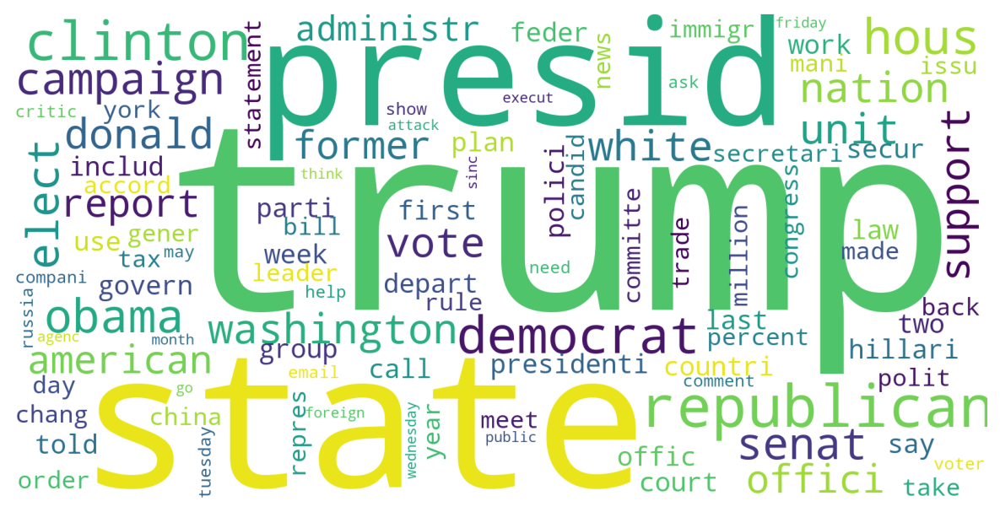

In [ ]:
text = freq_df.set_index('word').to_dict()
wordcloud = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

下方為假新聞詞頻文字雲

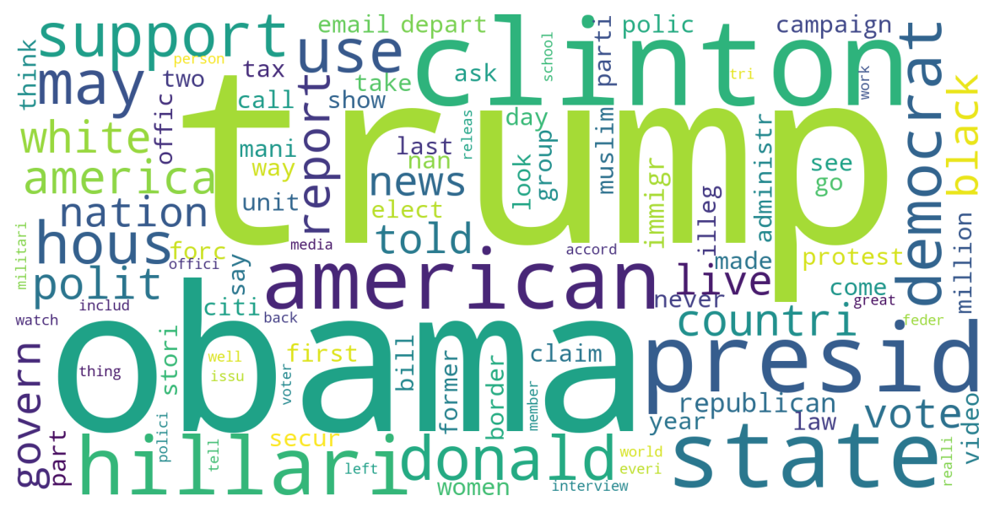

In [ ]:
text = freq_df.set_index('word').to_dict()
wordcloud = WordCloud(scale = 4, background_color = 'white', max_words=100).generate_from_frequencies(text['freq'])
plt.figure(figsize=(10,5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## 情緒分析

In [ ]:
en_dict_path = "./dict/liwc/LIWC_EN.csv"
liwc_dict = pd.read_csv(en_dict_path)
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})
liwc_dict

,word,sentiments
0,(:,affect
1,):,affect
2,:(,affect
3,:),affect
4,abandon,affect
...,...,...
3280,whine,sad
3281,whining,sad
3282,woe,sad
3283,worthless,sad


加入liwc情緒

In [ ]:
week4_df = noStop_df.copy()
liwc_df = pd.merge(week4_df, liwc_dict, how = 'left')
liwc_df

,title,subject,date,Authenticity,month,sentence,word,stem_token,sentiments
0,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,washington,washington,NaN
1,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,former,former,NaN
2,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,department,depart,NaN
3,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,justice,justic,NaN
4,Former U.S. official worried Russia could have...,politics,2017-05-08,True,2017-05,WASHINGTON Reuters A former US Department of ...,official,offici,NaN
...,...,...,...,...,...,...,...,...,...
1445045,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,republican,republican,NaN
1445046,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,presidential,presidenti,NaN
1445047,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,nominee,nomine,NaN
1445048,Palin vows to help defeat Ryan over his refusa...,politics,2016-05-08,True,2016-05,Palin who is popular with the Tea Party wing o...,john,john,NaN


以時間(月份)為單位進行情緒標註

In [ ]:
liwc_df['date'] = pd.to_datetime(liwc_df['date'])
sentiment_count_month = pd.DataFrame(liwc_df.groupby(['month', 'sentiments']).size()).reset_index()
# liwc_df['month'] = liwc_df['date'].dt.to_period('M')
# sentiment_count = pd.DataFrame(liwc_df.groupby(['sentiments', 'month']).size()).reset_index()


mask = ~(sentiment_count_month['sentiments'] == "affect")
pos_mask = (sentiment_count_month['sentiments'] == "positive") #過濾正向假新聞

sentiment_count_month = sentiment_count_month.loc[mask]
sentiment_count_month = sentiment_count_month.rename(columns={0: 'size'})

pos_month = sentiment_count_month[sentiment_count_month['sentiments']=='positive']
neg_month = sentiment_count_month[sentiment_count_month['sentiments']=='negative']
ang_month = sentiment_count_month[sentiment_count_month['sentiments']=='anger']
anx_month = sentiment_count_month[sentiment_count_month['sentiments']=='anx']
sad_month = sentiment_count_month[sentiment_count_month['sentiments']=='sad']

長條圖繪製  
可以看到大選當月，以及新年時新聞最多

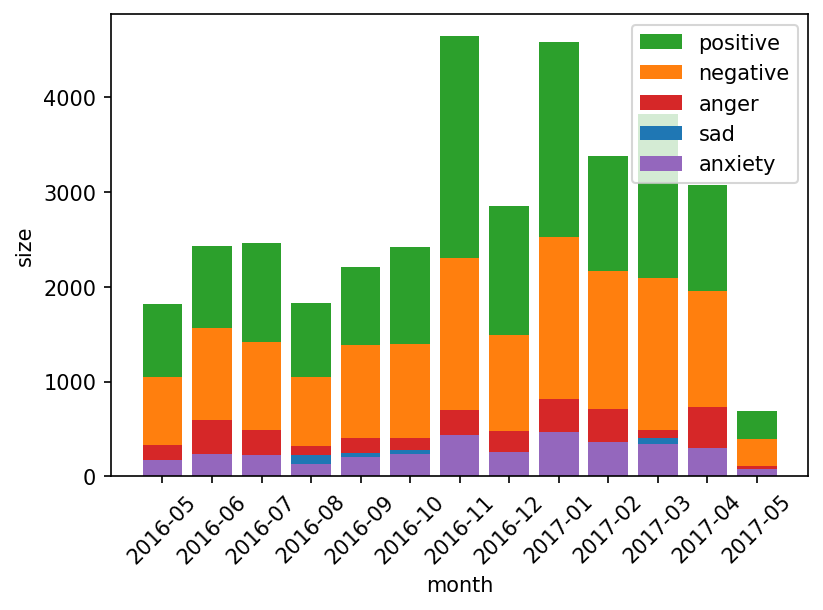

In [ ]:
colors = ["tab:green",  "tab:orange", "tab:red", "tab:blue", "tab:purple"]
fig, ax = plt.subplots()

ax.bar(pos_month['month'],
       pos_month['size'],
       color = colors[0],
       align='center')
ax.bar(neg_month['month'],
       neg_month['size'],
       color = colors[1],
       align='center')
ax.bar(ang_month['month'],
       ang_month['size'],
       color = colors[2],
       align='center')
ax.bar(sad_month['month'],
       sad_month['size'],
       color = colors[3],
       align='center')
ax.bar(anx_month['month'],
       anx_month['size'],
       color = colors[4],
       align='center')


ax.tick_params(axis='x', labelsize=10)
plt.xticks(rotation=45)

plt.xlabel('month')
plt.ylabel('size')

ax.legend(['positive','negative','anger', 'sad', 'anxiety'], loc ='upper right')
plt.show()

In [ ]:
sentiment_count_month.groupby('month')['size'].transform(lambda n : n/n.sum())
sentiment_count_month = sentiment_count_month.assign(
    ratio=sentiment_count_month.groupby("month")["size"].transform(lambda n: n / n.sum())
)
sentiment_count_month.head()

,month,sentiments,size,ratio
1,2016-05,anger,332,0.094131
2,2016-05,anx,174,0.049334
3,2016-05,negative,1053,0.298554
4,2016-05,positive,1814,0.514318
5,2016-05,sad,154,0.043663


In [ ]:
pos = sentiment_count_month[sentiment_count_month['sentiments']=='positive']
neg = sentiment_count_month[sentiment_count_month['sentiments']=='negative']
ang = sentiment_count_month[sentiment_count_month['sentiments']=='anger']
anx = sentiment_count_month[sentiment_count_month['sentiments']=='anx']
sad = sentiment_count_month[sentiment_count_month['sentiments']=='sad']

依月份的情緒折線圖

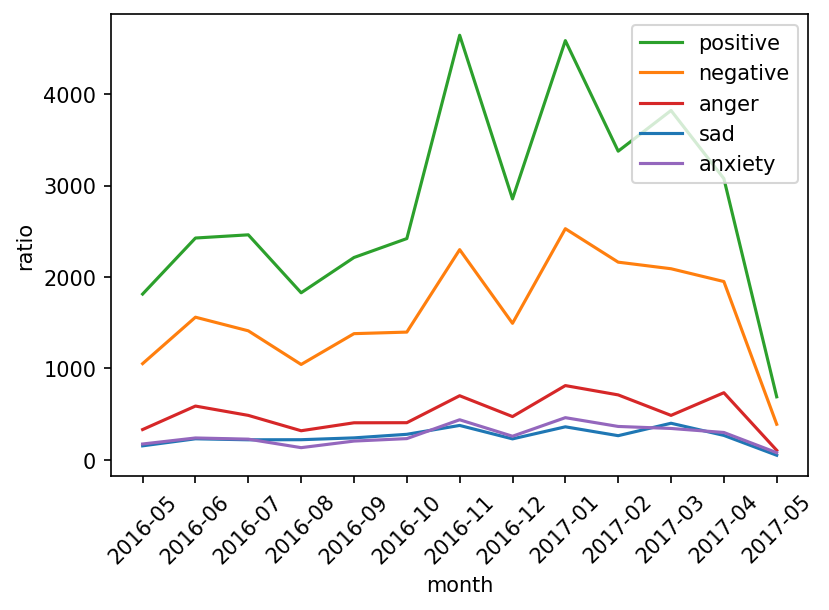

In [ ]:
fig, ax = plt.subplots()

ax.plot(pos['month'],
       pos['size'],
       color = colors[0])
ax.plot(neg['month'],
       neg['size'],
       color = colors[1])
ax.plot(ang['month'],
       ang['size'],
       color = colors[2])
ax.plot(sad['month'],
       sad['size'],
       color = colors[3])
ax.plot(anx['month'],
       anx['size'],
       color = colors[4])
plt.xlabel('month')
plt.ylabel('ratio')
ax.tick_params(axis='x', labelsize=10)
plt.xticks(rotation=45)

ax.legend(['positive','negative','anger', 'sad', 'anxiety'], loc ='upper right')

### sentiment value折線圖  
在此顯示的圖為真假新聞的加總情緒分數  
但我們另外有嘗試過單獨輸入真新聞或假新聞  
發現**真新聞情緒分數為正，而假新聞則為負的**  
我們推測可能假新聞的用途多為抹黑對手，因此會出現較多負面情緒字


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, '2016-05'),
  Text(1, 0, '2016-06'),
  Text(2, 0, '2016-07'),
  Text(3, 0, '2016-08'),
  Text(4, 0, '2016-09'),
  Text(5, 0, '2016-10'),
  Text(6, 0, '2016-11'),
  Text(7, 0, '2016-12'),
  Text(8, 0, '2017-01'),
  Text(9, 0, '2017-02'),
  Text(10, 0, '2017-03'),
  Text(11, 0, '2017-04'),
  Text(12, 0, '2017-05')])

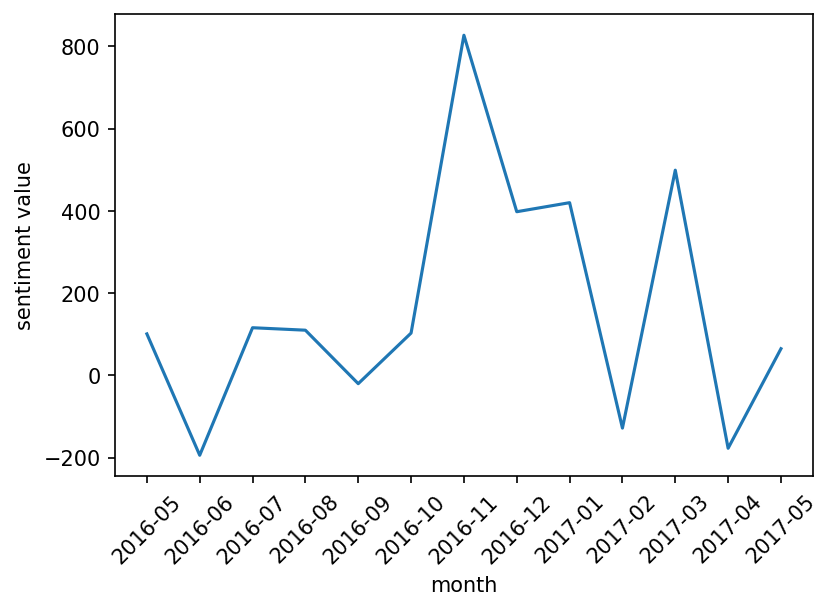

In [ ]:
mask = ~liwc_df['sentiments'].isna()
sentiment_value = sentiment_count_month.pivot_table(index='month', columns='sentiments', values='size', fill_value=0).reset_index().rename_axis(None, axis=1)
sentiment_value["sentiment_value"] = (
    sentiment_value["positive"]
    - sentiment_value["negative"]
    - sentiment_value["anger"]
    - sentiment_value["anx"]
    - sentiment_value["sad"]
)
fig, ax = plt.subplots()
ax.plot(sentiment_value['month'], sentiment_value["sentiment_value"])
ax.set_xlabel('month')
ax.set_ylabel('sentiment value')
ax.tick_params(axis='x', labelsize=10)
plt.xticks(rotation=45)

## coreNLP實體分析

In [ ]:
stanza.install_corenlp("./stanza_corenlp") # 下載coreNLP模型，預設會在/stanza_corenlp裡面
os.environ['CORENLP_HOME'] = "./stanza_corenlp" # 因為自訂下載路徑，所以要設定環境參數

2024-06-02 11:06:13 WARNING: Directory ./stanza_corenlp already exists. Please install CoreNLP to a new directory.


CoreNLP 標註

In [ ]:
def get_nlp_result(df, text_col, id_col, label_col):
    print("Starting a server with the Python \"with\" statement...")
    df_len = len(df)
    start = time.time()

    with CoreNLPClient(
        annotators = ['tokenize','ssplit', 'pos', 'lemma', 'ner','sentiment','entitymentions'],
        memory = '8G', endpoint = 'http://localhost:7778' , be_quiet=True,
    ) as client:

        token_list = []
        senti_list = []
        mention_list = []

        index_row = 0
        for index, row in df.iterrows(): # document level
            print(index_row)
            print("complete:", (index_row/df_len)*100, "%")
            index_row += 1
            # send text into client
            document = client.annotate(row[text_col])
            if document is None:
                continue  # Skip this iteration if document is None
            print(f"{'Word':12s}\t{'Lemma':12s}\t{'POS':6s}\t{'NER'}")

             # sentence level
            for i, sentence in enumerate(document.sentence):
                s = ""
                # token level
                for token in sentence.token:
                    s = s + " " + token.word # for sentence
                    # print("{:12s}\t{:12s}\t{:6s}\t{}".format(t.word, t.lemma, t.pos, t.ner))
                    # save lemma, pos, ner
                    temp_token = [row[id_col],token.word, row[label_col], token.lemma, token.pos, token.ner]
                    token_list.append(temp_token)
                # print("[Sentence {}:{}_____________]".format(i+1, s))

                # save sentiment, mention
                temp_senti = [row[id_col], row[label_col], s, sentence.sentiment]
                senti_list.append(temp_senti)

                for mention in sentence.mentions:
                    try:
                        # print(mention.entityMentionText, mention.ner)
                        temp_mention = [row[id_col], mention.entityMentionText, mention.ner]
                        mention_list.append(temp_mention)
                    except:
                        continue

        token_table = pd.DataFrame(data=token_list,
                            columns=[id_col, label_col, 'word','lemma','pos','ner'])

        senti_table = pd.DataFrame(data=senti_list,
                            columns=[id_col, label_col, 'sentence', 'sentiment'])

        mention_table = pd.DataFrame(data=mention_list,
                            columns=[id_col, 'mention','ner'])

        end = time.time()

        print("time costing: {}".format(end - start))
        print("\nThe server should be stopped upon exit from the \"with\" statement.")

        client.stop()
        return token_table, senti_table , mention_table

抓出true news

In [ ]:
import datetime
filter = pd.read_csv('filter.csv')
true_df = filter.copy()
start_date = datetime.datetime(2016, 9, 1)
end_date = datetime.datetime(2016, 11, 1)

true_df = true_df[true_df['Authenticity'] == 'True']
true_df['id'] = true_df.reset_index().index
true_df['date'] = pd.to_datetime(true_df['month'])
true_df = true_df[(true_df['date'] >= start_date) & (true_df['date'] <= end_date)]
true_df['text_length'] = true_df['text'].str.len()
eighty = true_df['text_length'].quantile(0.4)
true_df = true_df[true_df['text_length'] < eighty]
len(true_df)

530

因運算限制，將資料集限制在美國2016總統大選前後約一個月

In [ ]:
fake_df = filter.copy()
start_date = datetime.datetime(2016, 9, 1)
end_date = datetime.datetime(2016, 11, 1)

fake_df = fake_df[fake_df['Authenticity'] == 'Fake']
fake_df['id'] = fake_df.reset_index().index
fake_df['date'] = pd.to_datetime(fake_df['month'])
fake_df = fake_df[(fake_df['date'] >= start_date) & (fake_df['date'] <= end_date)]
fake_df['text_length'] = fake_df['text'].str.len()
eighty = fake_df['text_length'].quantile(0.6)
fake_df = fake_df[fake_df['text_length'] < eighty]
len(fake_df)

519

In [ ]:
# 找出NER、POS和sentiment分析結果
# tokens, sentiment, mention  = get_nlp_result(true_df,'text','id', 'Authenticity') # 資料框, 要處理的文字欄位名, id 欄位名
tokens, sentiment, mention  = get_nlp_result(fake_df,'text','id', 'Authenticity') # 資料框, 要處理的文字欄位名, id 欄位名


2024-06-02 11:41:07 INFO: Writing properties to tmp file: corenlp_server-664fc3e5ae584b76.props
2024-06-02 11:41:07 INFO: Starting server with command: java -Xmx8G -cp ./stanza_corenlp\* edu.stanford.nlp.pipeline.StanfordCoreNLPServer -port 7778 -timeout 60000 -threads 5 -maxCharLength 100000 -quiet True -serverProperties corenlp_server-664fc3e5ae584b76.props -annotators tokenize,ssplit,pos,lemma,ner,sentiment,entitymentions -preload -outputFormat serialized


Starting a server with the Python "with" statement...
start custom...
0
complete: 0.0 %
Word        	Lemma       	POS   	NER
1
complete: 0.1926782273603083 %
Word        	Lemma       	POS   	NER
2
complete: 0.3853564547206166 %
Word        	Lemma       	POS   	NER
3
complete: 0.5780346820809248 %
Word        	Lemma       	POS   	NER
4
complete: 0.7707129094412332 %
Word        	Lemma       	POS   	NER
5
complete: 0.9633911368015413 %
Word        	Lemma       	POS   	NER
6
complete: 1.1560693641618496 %
Word        	Lemma       	POS   	NER
7
complete: 1.348747591522158 %
Word        	Lemma       	POS   	NER
8
complete: 1.5414258188824663 %
Word        	Lemma       	POS   	NER
9
complete: 1.7341040462427744 %
Word        	Lemma       	POS   	NER
10
complete: 1.9267822736030826 %
Word        	Lemma       	POS   	NER
11
complete: 2.119460500963391 %
Word        	Lemma       	POS   	NER
12
complete: 2.312138728323699 %
Word        	Lemma       	POS   	NER
13
complete: 2.5048169556840074 %
W

儲存結果

In [ ]:
tokens.to_csv('raw_data/eng/tokens_fake.csv', encoding = 'utf-8', index = False)
sentiment.to_csv('raw_data/eng/sentiment_fake.csv', encoding = 'utf-8', index = False)
mention.to_csv('raw_data/eng/mention_fake.csv', encoding = 'utf-8', index = False)

NameError: name 'tokens' is not defined

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
tokens_true = pd.read_csv("raw_data/eng/tokens_tp.csv",  encoding='unicode_escape')
sentiments_true = pd.read_csv("raw_data/eng/sentiment_tp.csv")
mentions_true = pd.read_csv("raw_data/eng/mention_tp.csv")

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\3255982085.py:1: DtypeWarning: Columns (6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,194,195) have mixed types. Specify dtype option on import or set low_memory=False.
  tokens_true = pd.read_csv("raw_data/eng/tokens_tp.csv",  encoding='unicode_escape')


In [ ]:
tokens_fake = pd.read_csv("raw_data/eng/tokens_fake.csv",  encoding='unicode_escape')
sentiments_fake = pd.read_csv("raw_data/eng/sentiment_fake.csv")
mentions_fake = pd.read_csv("raw_data/eng/mention_fake.csv")

In [ ]:
#True
# 進行NER類別統計
ner_count_true = mentions_true.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
ner_count_true


,ner,count
16,PERSON,5346
14,ORGANIZATION,2207
4,DATE,1988
21,TITLE,1857
2,COUNTRY,1630
19,STATE_OR_PROVINCE,701
12,NUMBER,689
7,IDEOLOGY,636
1,CITY,456
9,MISC,452


In [ ]:

#Fake
ner_count_fake = mentions_fake.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
ner_count_fake

,ner,count
16,PERSON,2312
4,DATE,533
14,ORGANIZATION,451
21,TITLE,403
12,NUMBER,240
6,HANDLE,202
9,MISC,153
2,COUNTRY,152
19,STATE_OR_PROVINCE,136
7,IDEOLOGY,119


計算各種類NER的出現次數

### 真新聞之NER Category Count

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\731972378.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


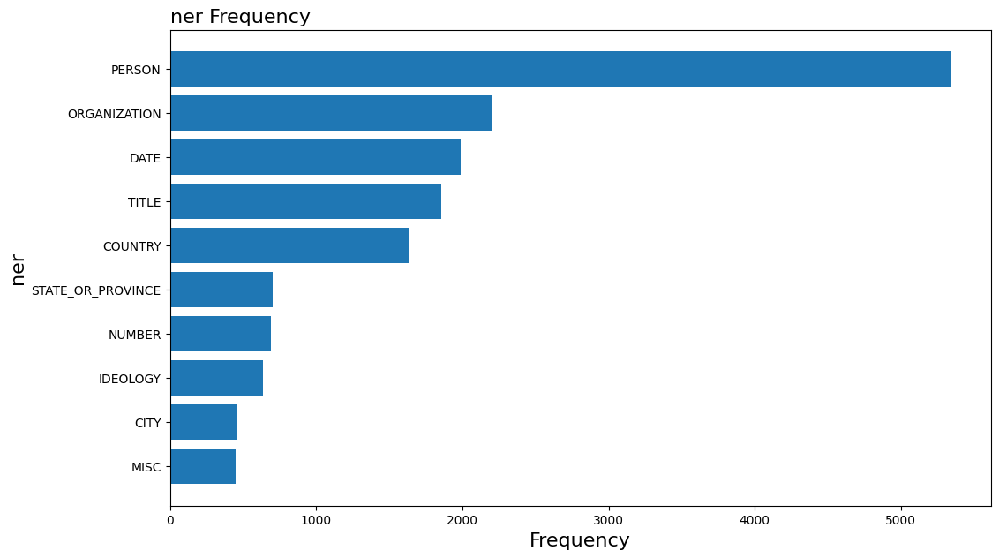

In [ ]:
ner = ner_count_true['ner']
count = ner_count_true['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(ner, count)
ax.invert_yaxis()
ax.set_title('ner Frequency',loc ='left', size = 16)
ax.set_ylabel('ner', size = 16)
ax.set_xlabel('Frequency', size = 16)
fig.show()

### 假新聞之NER Category Count

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\3645203662.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


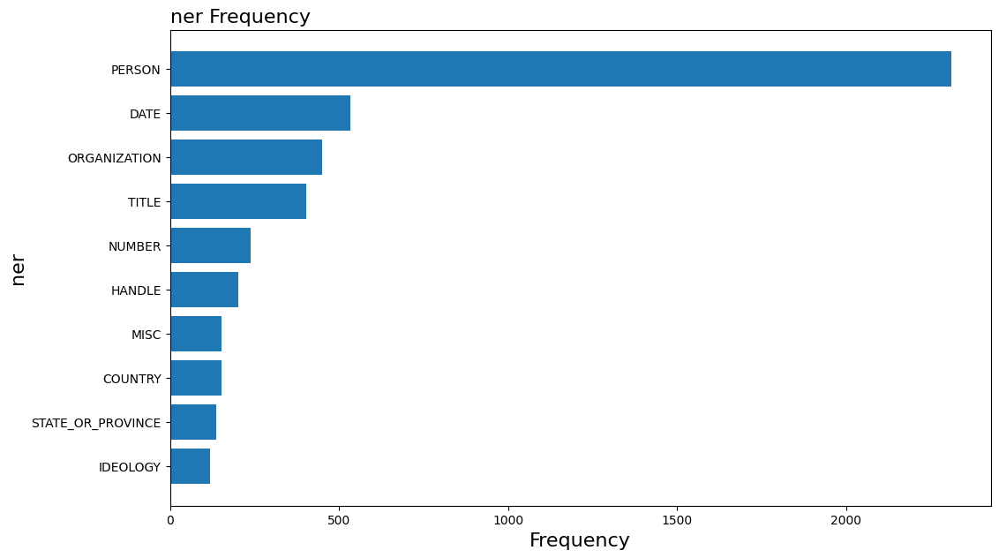

In [ ]:
ner = ner_count_fake['ner']
count = ner_count_fake['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(ner, count)
ax.invert_yaxis()
ax.set_title('ner Frequency',loc ='left', size = 16)
ax.set_ylabel('ner', size = 16)
ax.set_xlabel('Frequency', size = 16)
fig.show()

分析： 此處可以發現假新聞總共被偵測到的實體較少，目前假設造謠、未經查證的內容本身就多以模糊的字眼填充，而沒辦法確切的提出多個實體，後續將會再透過資料分析驗證這樣的假設之正確性。

### 依照類別查看真假新聞中各自的熱門字眼

In [ ]:
#為了正確計算詞頻，把內容轉小寫
mentions_true['word_lower'] = mentions_true['mention'].str.lower()
mentions_fake['word_lower'] = mentions_fake['mention'].str.lower()

### 列出文章中涉及到的地點(Location)

In [ ]:
# 篩選ner為country的資料
location = mentions_true.loc[mentions_true['ner'] == 'LOCATION']
remove_word = ['trump', 'city', 'laos']

location = location[~location['word_lower'].isin(remove_word)]
# 計算每個地點提到的次數，選出前8個
location_count = location[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count')
location_count = location_count.sort_values(['count'], ascending=False).head(8)
location_count

,word_lower,count
99,white house,34
37,europe,33
90,tehran,11
66,oval office,9
98,west bank,8
61,middle east,7
0,africa,6
29,earnest,6


#### 真新聞Location前10實體

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\328278394.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


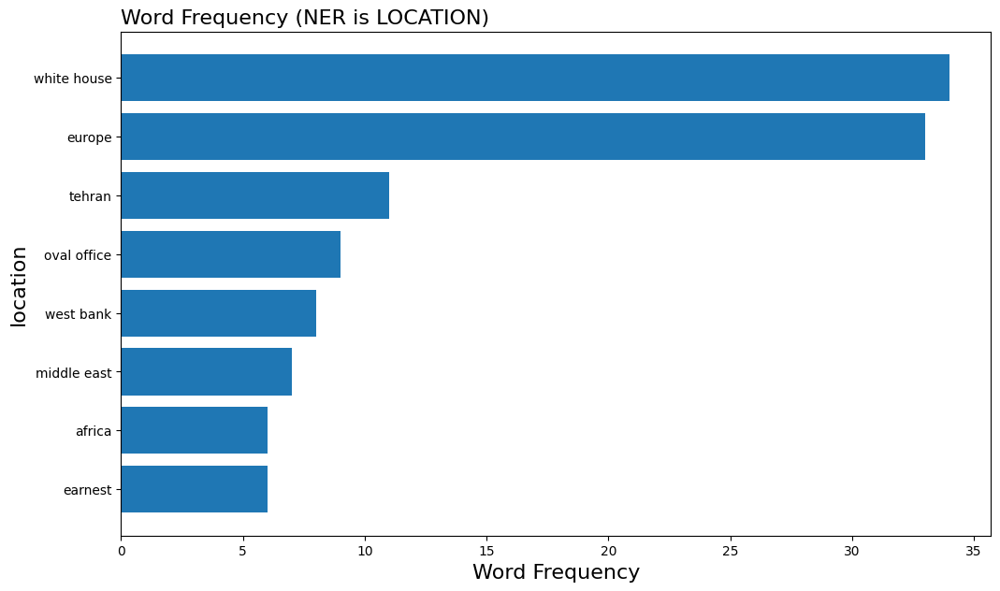

In [ ]:
word = location_count['word_lower']
count = location_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is LOCATION)',loc ='left', size = 16)
ax.set_ylabel('location', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

In [ ]:
# 篩選ner為country的資料
location = mentions_fake.loc[mentions_fake['ner'] == 'LOCATION']
remove_word = ['trump', 'county', 'laos', 'west coast camp david.rancho mirage']
location = location[~location['word_lower'].isin(remove_word)]
# 計算每個地點提到的次數，選出前8個
location_count = location[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count')
location_count = location_count.sort_values(['count'], ascending=False).head(8)
location_count

,word_lower,count
57,white house,7
0,amazon,4
31,oval office,4
14,easter park,2
20,gettysburg,2
15,flatiron,2
29,negan,2
7,church,1


#### 假新聞Location前10實體

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\328278394.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


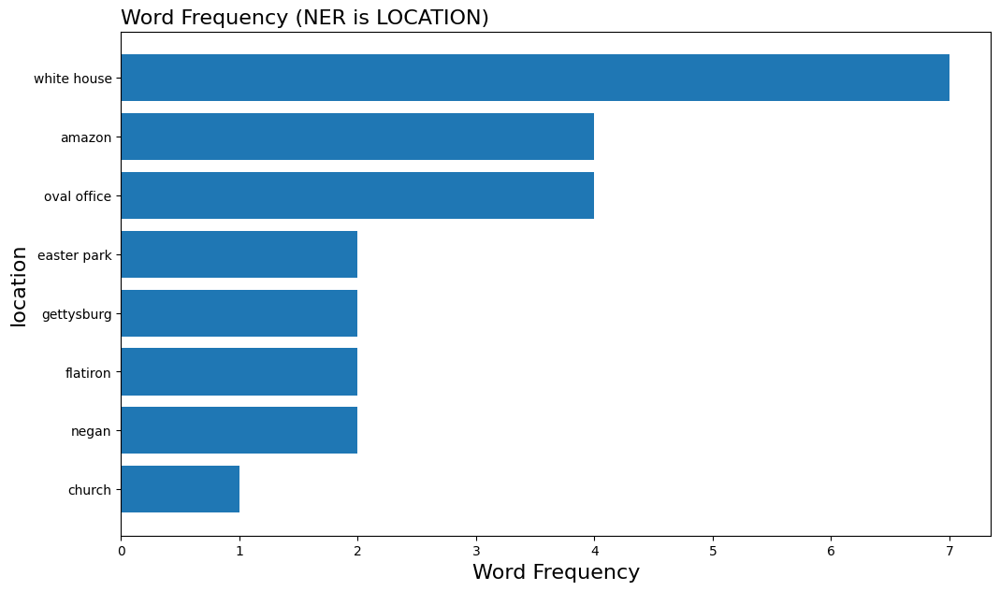

In [ ]:
word = location_count['word_lower']
count = location_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is LOCATION)',loc ='left', size = 16)
ax.set_ylabel('location', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

分析：在長度兩個月的資料集中可以看出，真新聞的資料集偵測出更多的Location Entity，假新聞資料及則非常少，符合我們在前面所做的推論，假新聞中的確切地點(Location)較少。

分析：另一方面，真新聞資料集當中的具體地點、政治相關地點也較明確，例如：
1. europe(歐洲)
2. tehran(德黑蘭)
3. middle east(中東)
4. africa(非洲)
5. earnest(堪薩斯州, 厄內斯特)

### 國家(City)

In [ ]:
# 篩選ner為city的資料
city = mentions_true.loc[mentions_true['ner'] == 'CITY']

# 計算每個地點提到的次數，選出前8個
city_count = city[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count')
city_count = city_count.sort_values(['count'], ascending=False).head(8)
city_count

,word_lower,count
90,moscow,36
74,london,30
12,berlin,22
23,chicago,16
71,lima,14
103,paris,14
5,asia,12
77,los angeles,10


#### 真新聞 City

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\781951515.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


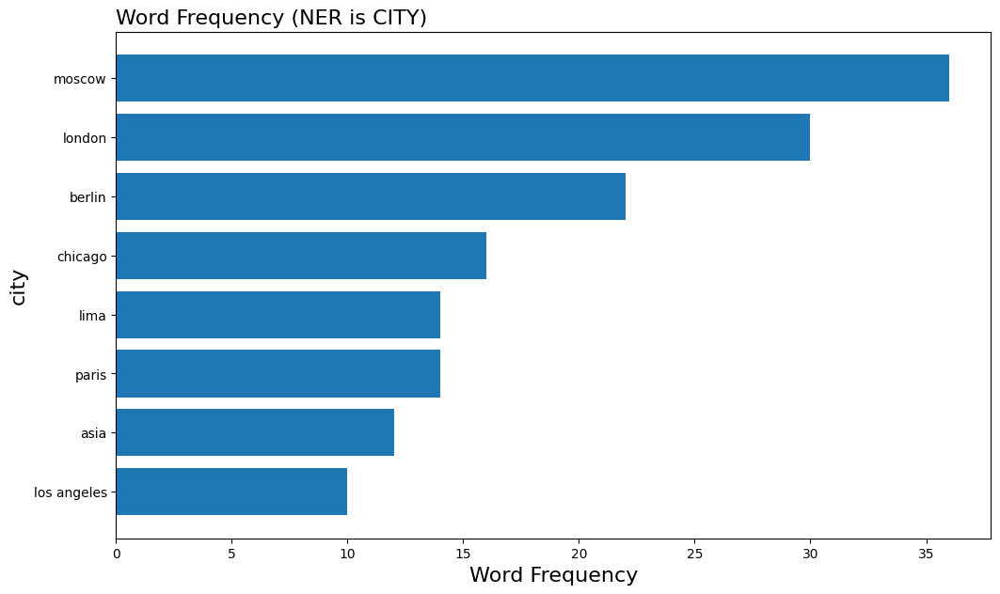

In [ ]:
word = city_count['word_lower']
count = city_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is CITY)',loc ='left', size = 16)
ax.set_ylabel('city', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

In [ ]:
# 篩選ner為city的資料
city = mentions_fake.loc[mentions_fake['ner'] == 'CITY']

# 計算每個地點提到的次數，選出前8個
city_count = city[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count')
city_count = city_count.sort_values(['count'], ascending=False).head(8)
city_count

,word_lower,count
35,portland,12
6,charlotte,9
12,flint,6
22,london,5
18,hollywood,5
44,tower,5
2,bangor,4
4,benghazi,4


#### 假新聞 City

C:\Users\kevin\AppData\Local\Temp\ipykernel_21568\781951515.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


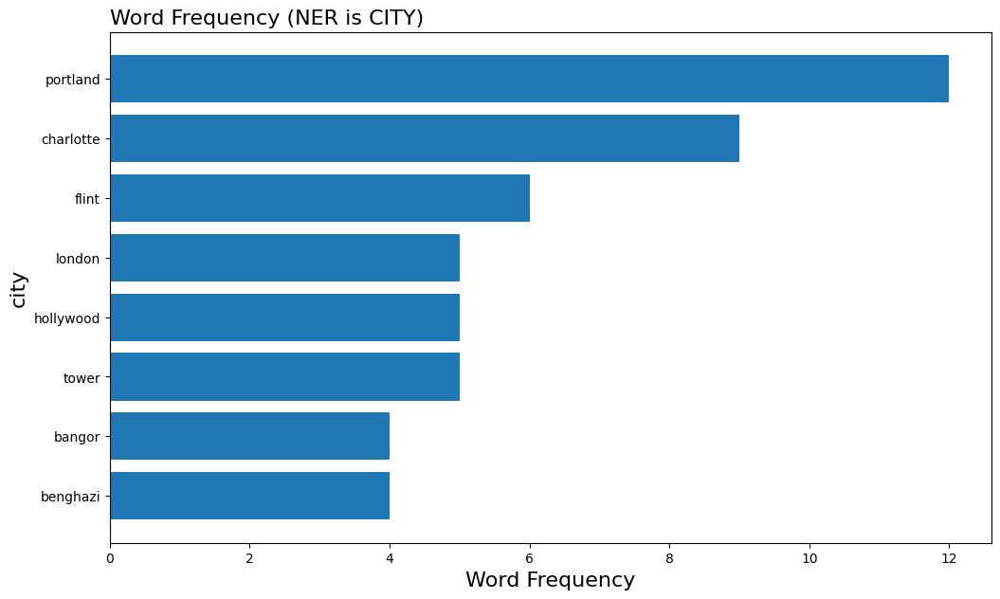

In [ ]:
word = city_count['word_lower']
count = city_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is CITY)',loc ='left', size = 16)
ax.set_ylabel('city', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

City同樣，true dataset當中偵測出更多國際性、具體、politic related的City實體，例如：
1. Moscow(俄羅斯首都，莫斯科)
2. London(倫敦)
3. Berlin(柏林)
4. Lima(利馬，祕魯首都)
5. Paris(巴黎)
6. Asia

### 涉及到的人物(PERSON)

#### 真新聞

In [ ]:
peo = mentions_true.loc[mentions_true['ner'] == 'PERSON']

# 手動移除coreNLP分不好的字詞
remove_l = ['her','his','he','she','him']
peo = peo[~peo.word_lower.isin(remove_l)]
peo['word_lower'] = peo['word_lower'].replace('trump', 'donald trump')
peo['word_lower'] = peo['word_lower'].replace('clinton', 'hillary clinton')
peo['word_lower'] = peo['word_lower'].replace('obama', 'barack obama')
peo['word_lower'] = peo['word_lower'].replace('putin', 'vladimir putin')

peo_count = peo[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
peo_count.head(10)

,word_lower,count
180,donald trump,1111
277,hillary clinton,430
49,barack obama,337
700,vladimir putin,63
601,ryan,30
480,mike pence,27
68,biden,27
463,merkel,26
359,josh earnest,25
537,pena nieto,20


繪製人物圖表

C:\Users\kevin\AppData\Local\Temp\ipykernel_19668\3454232053.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


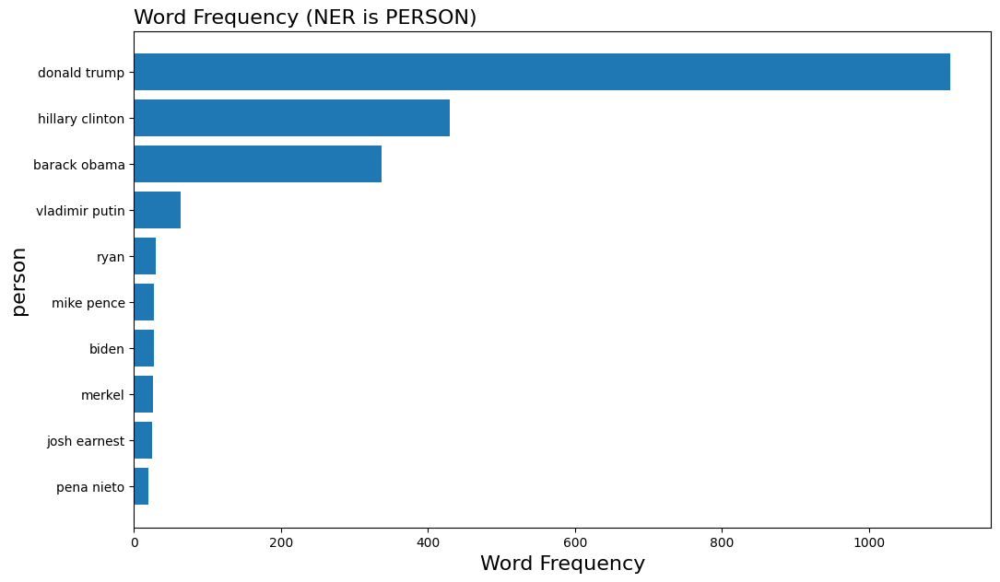

In [ ]:
word = peo_count['word_lower']
count = peo_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is PERSON)',loc ='left', size = 16)
ax.set_ylabel('person', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

#### 假新聞

In [ ]:
peo = mentions_fake.loc[mentions_fake['ner'] == 'PERSON']

# 手動移除coreNLP分不好的字詞
remove_l = ['her','his','he','she','him']
peo = peo[~peo.word_lower.isin(remove_l)]
peo['word_lower'] = peo['word_lower'].replace('trump', 'donald trump')
peo['word_lower'] = peo['word_lower'].replace('donald', 'donald trump')
peo['word_lower'] = peo['word_lower'].replace('donald j. trump', 'donald trump')
peo['word_lower'] = peo['word_lower'].replace('clinton', 'hillary clinton')
peo['word_lower'] = peo['word_lower'].replace('hillary', 'hillary clinton')
peo['word_lower'] = peo['word_lower'].replace('obama', 'barack obama')
peo['word_lower'] = peo['word_lower'].replace('putin', 'vladimir putin')
peo['word_lower'] = peo['word_lower'].replace('podesta', 'john podesta')
peo['word_lower'] = peo['word_lower'].replace('soros', 'george soros')
peo['word_lower'] = peo['word_lower'].replace('breitbart', 'andrew breitbart')

peo_count = peo[['word_lower']].groupby(['word_lower'])['word_lower'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
peo_count.head(10)

,word_lower,count
197,hillary clinton,394
133,donald trump,245
31,barack obama,93
45,bill clinton,31
256,john podesta,18
163,george soros,16
273,julian assange,14
17,andrew breitbart,14
357,paul joseph watson,8
106,comey,7


C:\Users\kevin\AppData\Local\Temp\ipykernel_19668\3454232053.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


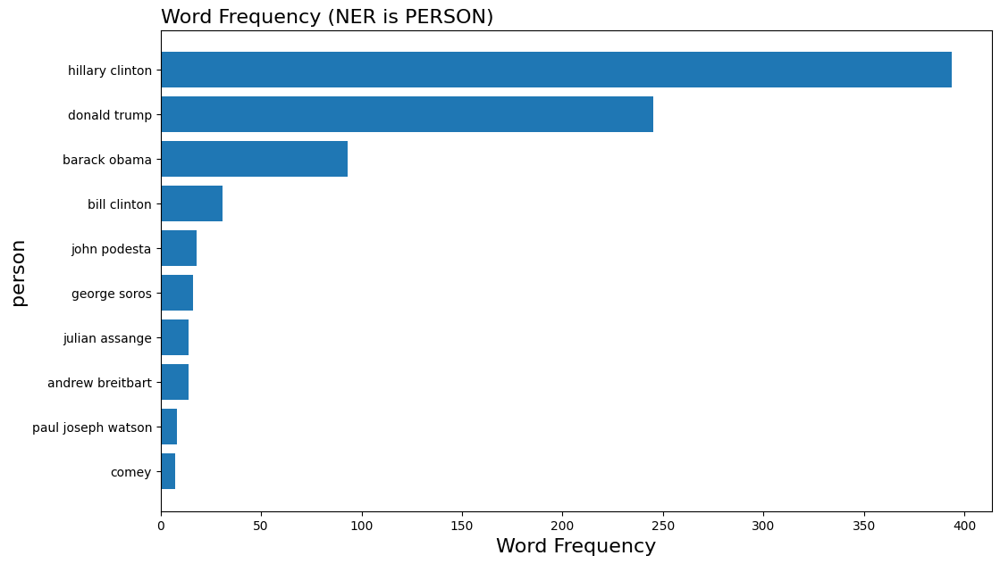

In [ ]:
word = peo_count['word_lower']
count = peo_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is PERSON)',loc ='left', size = 16)
ax.set_ylabel('person', size = 16)
ax.set_xlabel('Word Frequency', size = 16)
fig.show()

分析：在真新聞中，trump是hillary的兩倍多，在假新聞中，hillary是trump的將近兩倍。透過文獻查詢，我們發現在2016年大選中，Hillary受到大量假新聞的攻擊，Hillary也曾在敗選後提出"Fake news epidemic"的糟糕現況。

### 真假新聞之情緒分析

In [ ]:
# 讀取已經執行完畢的結果
sentiments_true = pd.read_csv("raw_data/eng/sentiment_tp.csv")
sentiments_fake = pd.read_csv("raw_data/eng/sentiment_fake.csv")
sentiment_df = pd.concat([sentiments_true, sentiments_fake])
sentiment_df.head(5)

,id,Authenticity,sentence,sentiment
0,3103,True,WASHINGTON ( Reuters ) - Two senior U.S. sena...,Neutral
1,3103,True,"Lindsey Graham and John McCain , two of the R...",Neutral
2,3103,True,“ All we ’re saying to any ally of the United...,Negative
3,3103,True,"In September , the Senate and House of Repres...",Negative
4,3103,True,"However , lawmakers said almost as soon as th...",Neutral


In [ ]:
# 看一下各情緒的分布
sentiment_df.groupby('sentiment')['sentiment'].agg(['count'])

,count
sentiment,
Negative,2042
Neutral,2031
Positive,1095
Very positive,13


In [ ]:
# 將情緒轉為分數
def label_sentiment(row):
    if row['sentiment'] == "Very positive" :
        return 2
    if row['sentiment'] == "Positive" :
        return 1
    if row['sentiment'] == "Neutral" :
        return 0
    if row['sentiment'] == "Negative" :
        return -1
    if row['sentiment'] == "Very negative" :
        return -2


sentiment_df['sentimentValue'] = sentiment_df.apply(lambda row: label_sentiment(row), axis=1)
sentiment_df

,id,Authenticity,sentence,sentiment,sentimentValue
0,3103,True,WASHINGTON ( Reuters ) - Two senior U.S. sena...,Neutral,0
1,3103,True,"Lindsey Graham and John McCain , two of the R...",Neutral,0
2,3103,True,“ All we ’re saying to any ally of the United...,Negative,-1
3,3103,True,"In September , the Senate and House of Repres...",Negative,-1
4,3103,True,"However , lawmakers said almost as soon as th...",Neutral,0
...,...,...,...,...,...
1594,2178,Fake,She basically saved his ass !,Neutral,0
1595,2178,Fake,Does the Republican Party not think that Laue...,Negative,-1
1596,2178,Fake,"How dumb can you get!NBC s Matt Lauer , who N...",Very positive,2
1597,2178,Fake,But Mediaite screencapped the page when it wa...,Neutral,0


#### 真假新聞之情緒總分比較

In [ ]:
sentiment_count = sentiment_df.groupby(['Authenticity'])['sentimentValue'].mean().reset_index()
sentiment_count

,Authenticity,sentimentValue
0,True,-0.166387
1,Fake,-0.203252


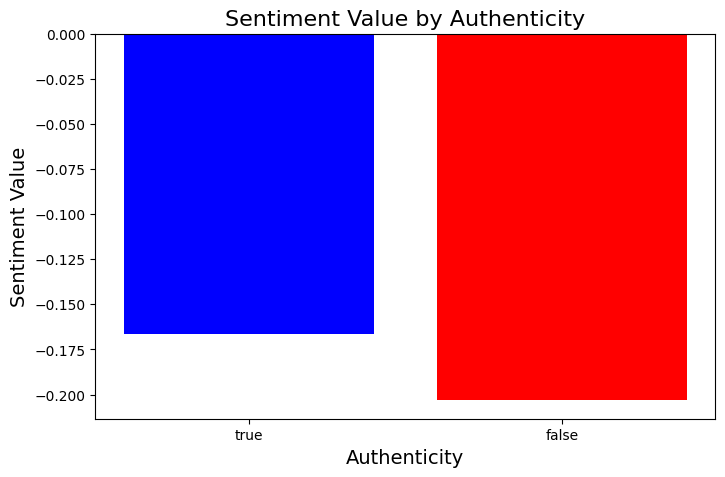

In [ ]:
authenticity = sentiment_count['Authenticity']
sentiment_value = sentiment_count['sentimentValue']
type(sentiment_value[0])
fig, ax = plt.subplots(figsize=(8, 5))

ax.bar(['true', 'false'], sentiment_value, color=['blue', 'red'])

ax.set_title('Sentiment Value by Authenticity', size=16)
ax.set_ylabel('Sentiment Value', size=14)
ax.set_xlabel('Authenticity', size=14)
plt.show()

---

In [ ]:
sentiment_count_by_article = pd.DataFrame(
    liwc_df.groupby(["title", "sentiments"]).size()
).reset_index()
sentiment_count_by_article = sentiment_count_by_article.rename(columns={0: "size"})
sentiment_count_by_article

,title,sentiments,size
0,"""It would be huge"": U.S. border town confronts...",affect,30
1,"""It would be huge"": U.S. border town confronts...",anger,3
2,"""It would be huge"": U.S. border town confronts...",anx,2
3,"""It would be huge"": U.S. border town confronts...",negative,14
4,"""It would be huge"": U.S. border town confronts...",positive,15
...,...,...,...
21236,Zuckerberg again rejects claims of Facebook im...,affect,15
21237,Zuckerberg again rejects claims of Facebook im...,anger,3
21238,Zuckerberg again rejects claims of Facebook im...,anx,1
21239,Zuckerberg again rejects claims of Facebook im...,negative,11


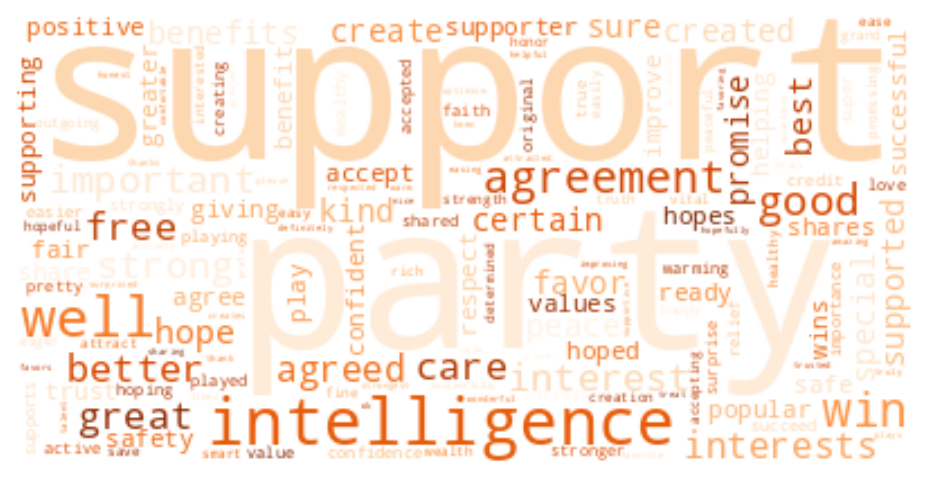

In [ ]:
#好奇正面的假新聞會報導甚麼
mask = (liwc_df['sentiments']=='positive')
tf_by_ch_df = liwc_df.loc[mask]
#算詞頻
word_count_count = pd.DataFrame(tf_by_ch_df.groupby(['word']).size()).reset_index().rename(columns={0: "size"})
word_count_count = word_count_count.sort_values(by='size', ascending=False)

#文字雲
cloud = WordCloud(max_words=200, background_color="white", colormap="Oranges")
wc_45 = dict(zip(word_count_count['word'], word_count_count['size']))
cloud.generate_from_frequencies(wc_45)
# plt.figure(figsize=(10,5), dpi=300)
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

結果都是不太重要的單字

In [ ]:
word_count = liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)
word_count

,word,sentiments,size
1560,support,positive,2199
1559,support,affect,2199
1166,party,affect,2070
1167,party,positive,2070
906,intelligence,positive,1761
...,...,...,...
1756,valuing,positive,1
973,lol,affect,1
972,lmao,positive,1
927,jerks,negative,1


各情緒的常見詞長條圖 (以去除不該出現在各情緒的詞)

In [ ]:
words_to_remove = ['party', 'defense']
# 使用 ~ 運算子和 isin() 方法過濾掉包含在 words_to_remove 列表中的行
liwc_dict_revise = liwc_dict[~liwc_dict['word'].isin(words_to_remove)]
# 使用更新後的情緒字典 merge
liwc_df = pd.merge(liwc_df[["title", "subject", "date", "month", "sentence", "word", "stem_token"]], liwc_dict_revise, how="left")
liwc_df.head()

,title,subject,date,month,sentence,word,stem_token,sentiments
0,Former U.S. official worried Russia could have...,politics,2017-05-08,2017-05,WASHINGTON Reuters A former US Department of ...,washington,washington,NaN
1,Former U.S. official worried Russia could have...,politics,2017-05-08,2017-05,WASHINGTON Reuters A former US Department of ...,former,former,NaN
2,Former U.S. official worried Russia could have...,politics,2017-05-08,2017-05,WASHINGTON Reuters A former US Department of ...,department,depart,NaN
3,Former U.S. official worried Russia could have...,politics,2017-05-08,2017-05,WASHINGTON Reuters A former US Department of ...,justice,justic,NaN
4,Former U.S. official worried Russia could have...,politics,2017-05-08,2017-05,WASHINGTON Reuters A former US Department of ...,official,offici,NaN


C:\Users\brian\AppData\Local\Temp\ipykernel_26232\3756588576.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0,0].set_yticklabels(pos["word"])
C:\Users\brian\AppData\Local\Temp\ipykernel_26232\3756588576.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0,1].set_yticklabels(neg["word"])
C:\Users\brian\AppData\Local\Temp\ipykernel_26232\3756588576.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1,0].set_yticklabels(ang["word"])
C:\Users\brian\AppData\Local\Temp\ipykernel_26232\3756588576.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1,1].set_yticklabels(anx["word"])
C:\Users\brian\AppData\Local\Temp\ipykernel_26232\3756588576

(0.0, 1.0, 0.0, 1.0)

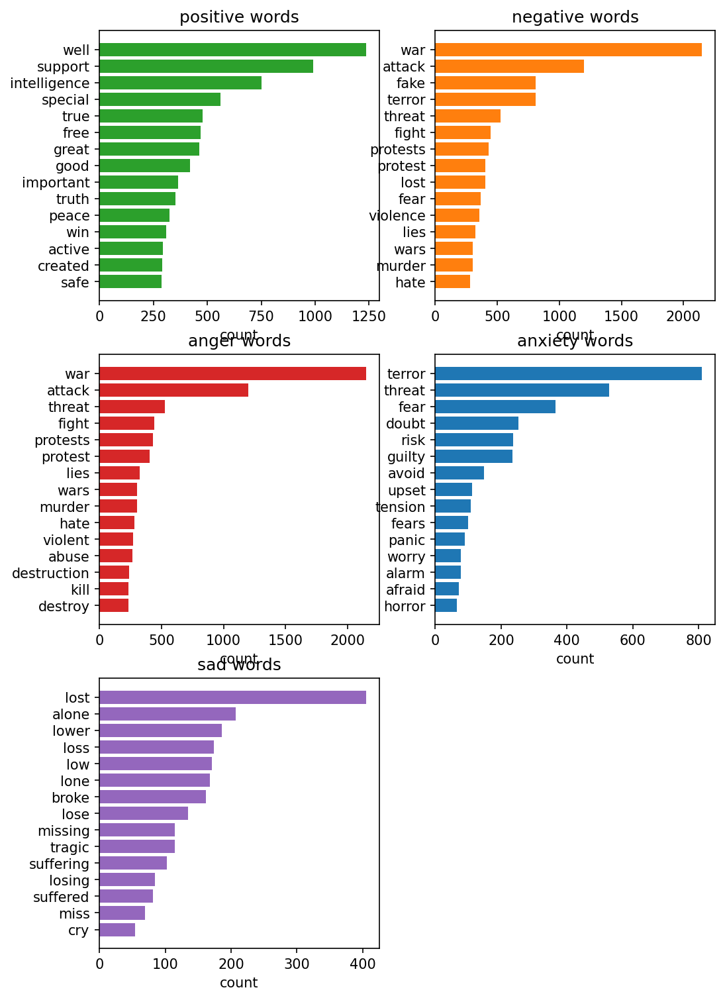

In [ ]:
word_count = liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]
word_of_ang = word_count.loc[(word_count["sentiments"] == "anger")]
word_of_anx = word_count.loc[(word_count["sentiments"] == "anx")]
word_of_sad = word_count.loc[(word_count["sentiments"] == "sad")]

pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)
ang = word_of_ang.head(15).sort_values(["size"], ascending=True)
anx = word_of_anx.head(15).sort_values(["size"], ascending=True)
sad = word_of_sad.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(3,2, figsize=(8, 12))

ax[0,0].barh(pos["word"], pos["size"], color=colors[0])
ax[0,0].set_xlabel("count")
ax[0,0].set_yticklabels(pos["word"])
ax[0,0].set_title("positive words")

ax[0,1].barh(neg["word"], neg["size"], color=colors[1])
ax[0,1].set_xlabel("count")
ax[0,1].set_yticklabels(neg["word"])
ax[0,1].set_title("negative words")

ax[1,0].barh(ang["word"], ang["size"], color=colors[2])
ax[1,0].set_xlabel("count")
ax[1,0].set_yticklabels(ang["word"])
ax[1,0].set_title("anger words")

ax[1,1].barh(anx["word"], anx["size"], color=colors[3])
ax[1,1].set_xlabel("count")
ax[1,1].set_yticklabels(anx["word"])
ax[1,1].set_title("anxiety words")

ax[2,0].barh(sad["word"], sad["size"], color=colors[4])
ax[2,0].set_xlabel("count")
ax[2,0].set_yticklabels(sad["word"])
ax[2,0].set_title("sad words")

ax[2, 1].axis('off')

## 字詞分類

### 資料前處理

In [ ]:
# 英文 bert-base-uncased
bert_en = SentenceTransformer('google-bert/bert-base-uncased')

bert_en.tokenizer.add_special_tokens({'pad_token': '[PAD]'})

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

0

In [ ]:
# 匯入資料
true = pd.read_csv('./data/True.csv')
fake = pd.read_csv('./data/Fake.csv')

In [ ]:
# 篩選政治新聞
true = true[true["subject"] == "politicsNews"]
fake = fake[fake["subject"] == "politics"]

In [ ]:
# 轉換時間呈現形式
true["date"] = pd.to_datetime(true["date"])

# 篩選時間：2016/5/8 ~ 2017/5/8
true = true[true['date'].dt.strftime('%Y-%m-%d').between('2016-05-08', '2017-05-08')]

In [ ]:
# 定義一個函數來解析不同格式的日期字串
date_formats = ['%d-%b-%y', '%b %d, %Y']

# 應用解析函數來轉換日期字串
for i, row in fake.iterrows():
    try:
        if bool(datetime.strptime(row['date'], date_formats[0])) == True:
            row['date'] =  pd.to_datetime(row['date'], format='%d-%b-%y')
    except ValueError:
        try:
            if bool(datetime.strptime(row['date'], date_formats[1])) == True:
                row['date'] =  pd.to_datetime(row['date'], format='%b %d, %Y')
        except ValueError:
            row['date'] = pd.NaT

fake['date'] = pd.to_datetime(fake['date'])
fake = fake[fake['date'].dt.strftime('%Y-%m-%d').between('2016-05-08', '2017-05-08')]

In [ ]:
# 新增真假新聞欄位
true['T_or_F'] = 'True'
fake['T_or_F'] = 'Fake'
news = pd.concat([true,fake],axis=0)

# 新增大選前後欄位
news['period'] = 'After Election'
news.loc[(news['date'] <= '2016-11-08'), 'period'] = 'before Election'

# 新增大選前後及真假新聞欄位
news['category'] = 'Fake_News_After_Election'
news.loc[(news['T_or_F'] == 'True') & (news['period'] == 'After Election'), 'category'] = 'True_News_After_Election'
news.loc[(news['T_or_F'] == 'Fake') & (news['period'] == 'before Election'), 'category'] = 'Fake_News_before_Election'
news.loc[(news['T_or_F'] == 'True') & (news['period'] == 'before Election'), 'category'] = 'True_News_before_Election'

# 移除用不到的欄位
news.drop(columns=["subject", "date"], inplace=True)

# 移除含有空值的資料
news.dropna(inplace=True)

news.head(6)

,title,text,T_or_F,period
3876,Former U.S. official worried Russia could have...,WASHINGTON (Reuters) - A former U.S. Departmen...,True,After Election
3881,Senate confirms Heather Wilson as Trump's Air ...,WASHINGTON (Reuters) - The U.S. Senate easily ...,True,After Election
3882,Former Trump security aide was Russia blackmai...,WASHINGTON (Reuters) - Former Acting U.S. Atto...,True,After Election
3883,Trump review of Wall Street rules to be done i...,NEW YORK/WASHINGTON (Reuters) - The U.S. gover...,True,After Election
3884,Judges hit Trump lawyer with tough questions o...,"RICHMOND, Va. (Reuters) - Federal appeals cour...",True,After Election
3885,"Rice chides Trump for criticism of judges, media",NEW YORK (Reuters) - Former U.S. Secretary of ...,True,After Election


In [ ]:
# 將新聞內文Embedding
news["embeddings"] = news.text.apply(lambda x: bert_en.encode(x))
news.head(3)

In [ ]:
news.head(3)

,title,text,T_or_F,period,embeddings,category
3876,Former U.S. official worried Russia could have...,WASHINGTON (Reuters) - A former U.S. Departmen...,True,After Election,"[-0.2524883, -0.25978306, -0.044206638, -0.115...",True_News_After_Election
3881,Senate confirms Heather Wilson as Trump's Air ...,WASHINGTON (Reuters) - The U.S. Senate easily ...,True,After Election,"[-0.3521042, -0.3643182, 0.009723774, -0.06540...",True_News_After_Election
3882,Former Trump security aide was Russia blackmai...,WASHINGTON (Reuters) - Former Acting U.S. Atto...,True,After Election,"[-0.3663109, -0.21958277, -0.06390595, -0.0743...",True_News_After_Election


In [ ]:
# 新聞各種類數量
news['category'].value_counts()

category
True_News_After_Election     3604
True_News_before_Election    2150
Fake_News_After_Election     1525
Fake_News_before_Election    1494
Name: count, dtype: int64

### 分類模型的訓練

#### 新增停用字

In [ ]:
# 初次使用需要安裝nltk中的停用字資源
nltk.download('stopwords')

# 使用nltk的stop_words
stops1 = stops2 = stops3 = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# 手動加入停用字
newStops_before_after_election = ['nov', 'june', 'jan', 'aug', 'july', 'sept', 'oct', 'dec', 'feb', 'march', 'april', 'september', 'october', 'november', 'december', 'january', 'february', 'august', '2017', '2016']
newStops_true_or_fake = ['reuters', 'washington']

stops1.extend(newStops_before_after_election)
stops2.extend(newStops_true_or_fake)
stops3.extend(newStops_before_after_election)
stops3.extend(newStops_true_or_fake)

1. 月分和年份會高度影響大選前後的分類，因此排除
2. 我們發現資料集中路透社和華盛頓郵報都集中在某一個真新聞類別，因此排除

#### cross validation

In [ ]:
# 定義模型訓練組合
## pipeline: 資料處理 vectorizer + 分類器 clf
## 由於 cross-validation 會自動將資料分成 train/test，因此 input 只要給 X, y 即可

def train_cv(vectorizer, clf, X, y):

    ## train classifier
    vec_X = vectorizer.fit_transform(X).toarray()

    ## get cv results
    cv_results = cross_validate(clf, vec_X, y, cv=5, return_estimator=True)
    y_pred = cross_val_predict(clf, vec_X, y, cv=5)
    y_pred_proba = cross_val_predict(clf, vec_X, y, cv=5, method="predict_proba")

    # one-hot encoding
    enc = OneHotEncoder(sparse_output=False)
    enc.fit(y.values.reshape(-1, 1))

    ## Accuracy, Precision, Recall, F1-score
    cls_report = classification_report(y, y_pred, output_dict=True)
    print(classification_report(y, y_pred))

    classes = cv_results['estimator'][0].classes_

    ## Plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt="d", ax=ax, cmap=plt.cm.Blues, cbar=False)
    ax.set(
        xlabel="Pred",
        ylabel="True",
        xticklabels=classes,
        yticklabels=classes,
        title="Confusion matrix",
    )
    plt.yticks(rotation=0)

    clf.fit(vec_X, y)
    # return the model object
    return cls_report

#### 比較不同模型和不同DTM轉換方式的效果

now training: clf_logistic_freq
                 precision    recall  f1-score   support

 After Election       0.83      0.87      0.85      3592
before Election       0.81      0.75      0.78      2549

       accuracy                           0.82      6141
      macro avg       0.82      0.81      0.81      6141
   weighted avg       0.82      0.82      0.82      6141

now training: clf_dtree_freq
                 precision    recall  f1-score   support

 After Election       0.83      0.85      0.84      3592
before Election       0.78      0.75      0.76      2549

       accuracy                           0.81      6141
      macro avg       0.80      0.80      0.80      6141
   weighted avg       0.81      0.81      0.81      6141

now training: clf_svm_freq
                 precision    recall  f1-score   support

 After Election       0.81      0.92      0.86      3592
before Election       0.86      0.69      0.77      2549

       accuracy                           0.83   

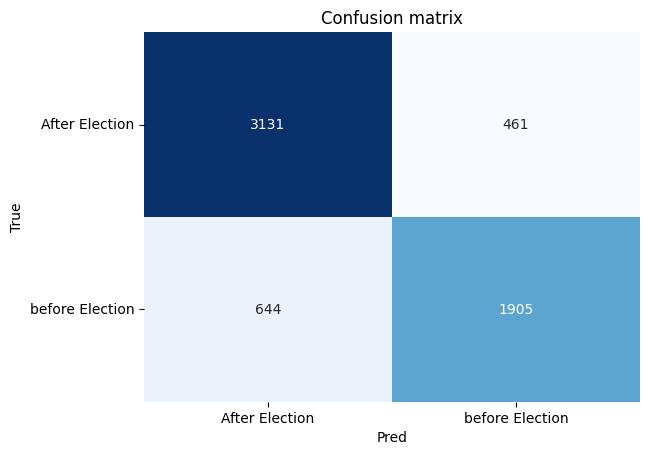

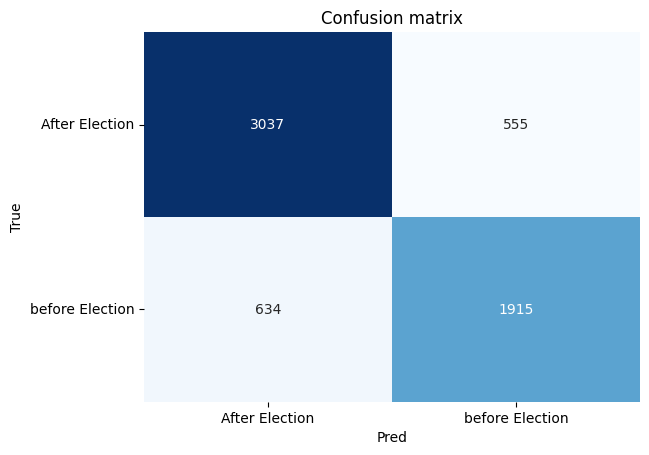

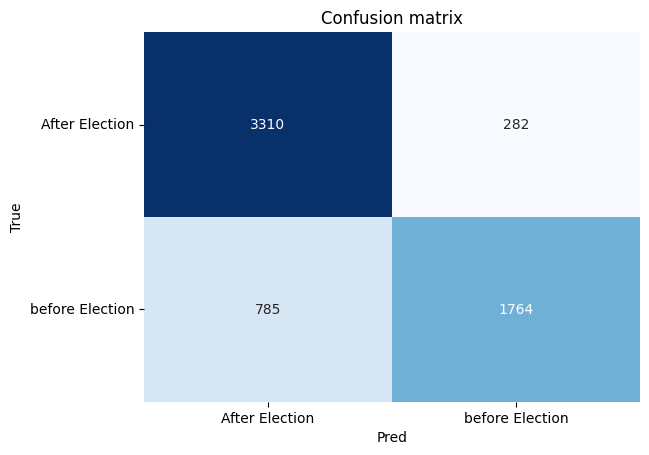

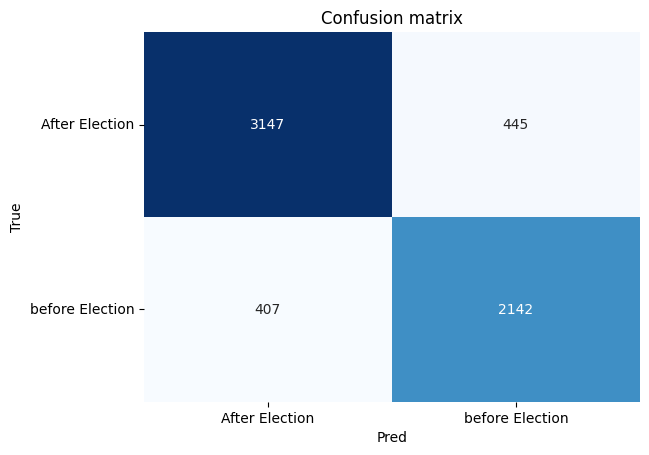

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
data = news.copy()
X = data["text"]
y_period = data["period"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y_period, test_size=0.3, random_state=777
)

# 存結果
result_set_period_count = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic_freq'] = LogisticRegression()
model_set['clf_dtree_freq'] = DecisionTreeClassifier()
model_set['clf_svm_freq'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf_freq'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = CountVectorizer(max_features=1000, stop_words=stops1)

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_period_count[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

now training: clf_logistic_tfidf
                 precision    recall  f1-score   support

 After Election       0.83      0.91      0.87      3592
before Election       0.85      0.74      0.79      2549

       accuracy                           0.84      6141
      macro avg       0.84      0.82      0.83      6141
   weighted avg       0.84      0.84      0.83      6141

now training: clf_dtree_tfidf
                 precision    recall  f1-score   support

 After Election       0.83      0.85      0.84      3592
before Election       0.78      0.76      0.77      2549

       accuracy                           0.81      6141
      macro avg       0.81      0.80      0.81      6141
   weighted avg       0.81      0.81      0.81      6141

now training: clf_svm_tfidf
                 precision    recall  f1-score   support

 After Election       0.86      0.91      0.88      3592
before Election       0.86      0.79      0.82      2549

       accuracy                           0.86

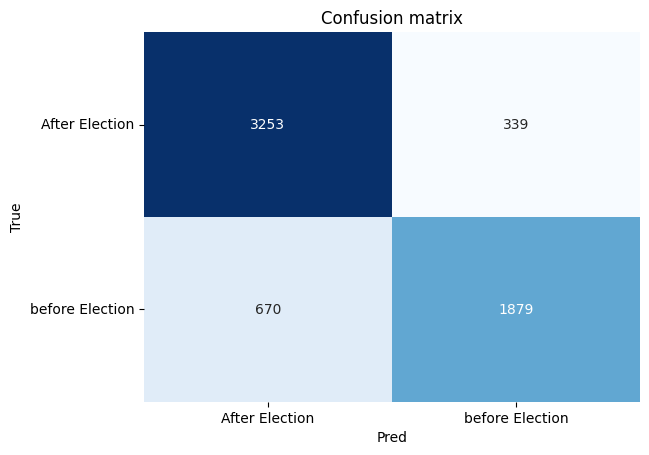

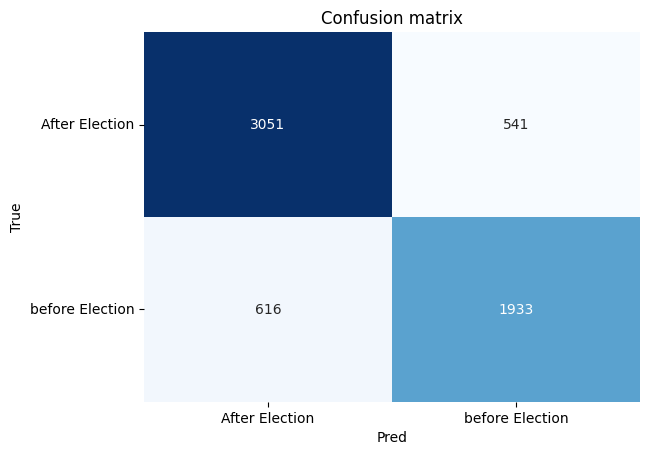

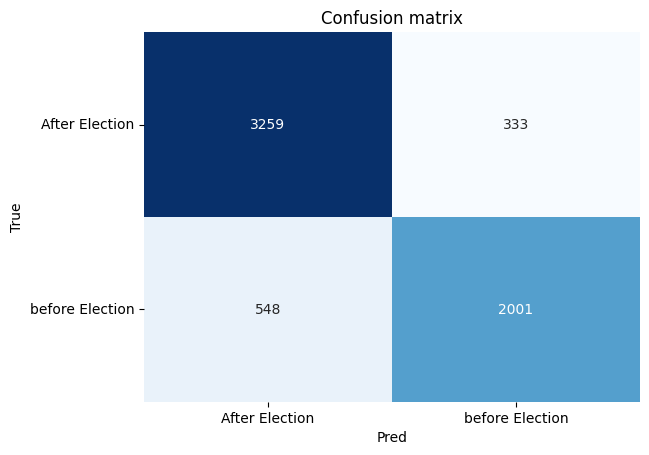

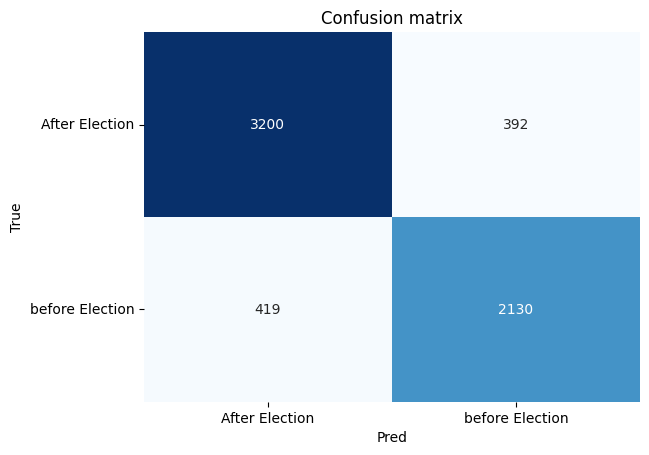

In [ ]:
result_set_period_tfidf = dict()

# 定義模型訓練組合
model_set2 = dict()
model_set2['clf_logistic_tfidf'] = LogisticRegression()
model_set2['clf_dtree_tfidf'] = DecisionTreeClassifier()
model_set2['clf_svm_tfidf'] = svm.SVC(probability=True)
model_set2['clf_rf_tfidf'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = TfidfVectorizer(max_features=1000, stop_words=stops1)

for k, model in model_set2.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_period_tfidf[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

result1 = result_set_period_count  # or orig.copy()
result1.update(result_set_period_tfidf)

## choose max f1-score model from result_set
for k, v in result1.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_rf_tfidf


In [ ]:
y_pred = model_set2['clf_rf_tfidf'].predict(vectorizer.transform(X_test))
print(classification_report(y_test, y_pred))

                 precision    recall  f1-score   support

 After Election       0.89      0.87      0.88      1537
before Election       0.83      0.85      0.84      1095

       accuracy                           0.86      2632
      macro avg       0.86      0.86      0.86      2632
   weighted avg       0.86      0.86      0.86      2632



now training: clf_logistic_freq
              precision    recall  f1-score   support

        Fake       0.93      0.92      0.92      2135
        True       0.96      0.96      0.96      4006

    accuracy                           0.95      6141
   macro avg       0.94      0.94      0.94      6141
weighted avg       0.95      0.95      0.95      6141

now training: clf_dtree_freq
              precision    recall  f1-score   support

        Fake       0.86      0.85      0.85      2135
        True       0.92      0.92      0.92      4006

    accuracy                           0.90      6141
   macro avg       0.89      0.89      0.89      6141
weighted avg       0.90      0.90      0.90      6141

now training: clf_svm_freq
              precision    recall  f1-score   support

        Fake       0.95      0.87      0.91      2135
        True       0.93      0.97      0.95      4006

    accuracy                           0.94      6141
   macro avg       0.94      0.92      0

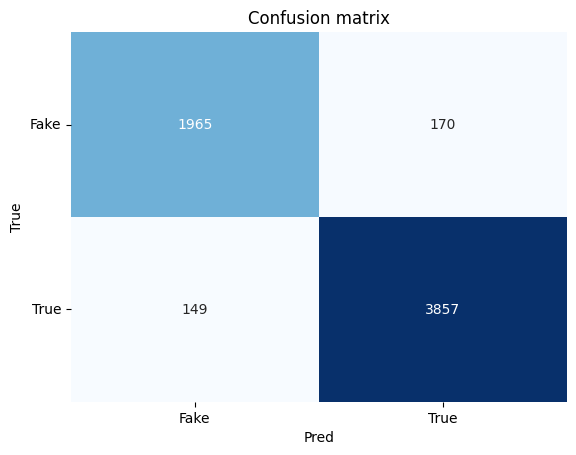

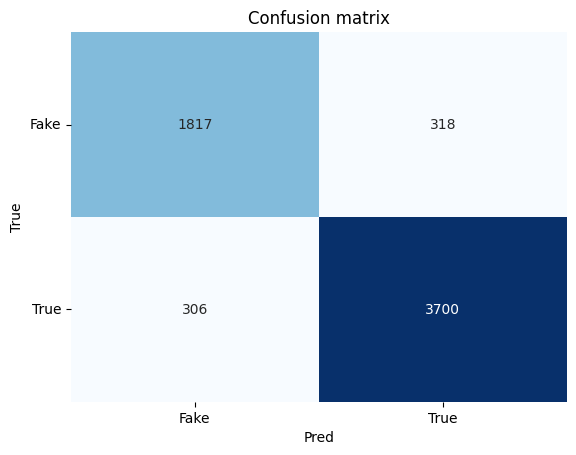

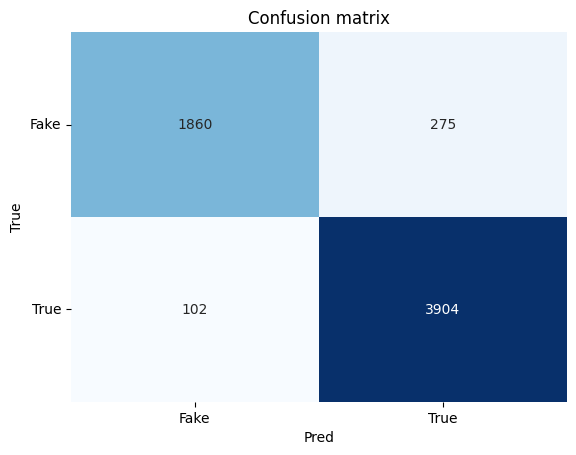

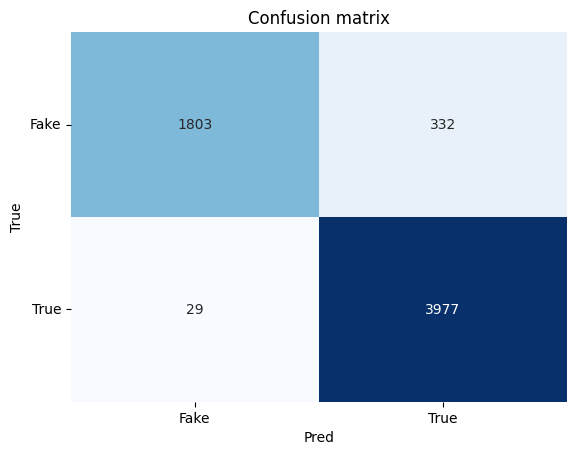

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
X = data["text"]
y = data["T_or_F"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=777
)

# 存結果
result_set_T_or_F_count = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic_freq'] = LogisticRegression()
model_set['clf_dtree_freq'] = DecisionTreeClassifier()
model_set['clf_svm_freq'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf_freq'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = CountVectorizer(max_features=1000, stop_words=stops2)

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_T_or_F_count[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

now training: clf_logistic_tfidf
              precision    recall  f1-score   support

        Fake       0.96      0.90      0.93      2135
        True       0.95      0.98      0.96      4006

    accuracy                           0.95      6141
   macro avg       0.95      0.94      0.95      6141
weighted avg       0.95      0.95      0.95      6141

now training: clf_dtree_tfidf
              precision    recall  f1-score   support

        Fake       0.88      0.87      0.88      2135
        True       0.93      0.94      0.93      4006

    accuracy                           0.91      6141
   macro avg       0.91      0.90      0.90      6141
weighted avg       0.91      0.91      0.91      6141

now training: clf_svm_tfidf
              precision    recall  f1-score   support

        Fake       0.97      0.92      0.94      2135
        True       0.96      0.98      0.97      4006

    accuracy                           0.96      6141
   macro avg       0.96      0.95    

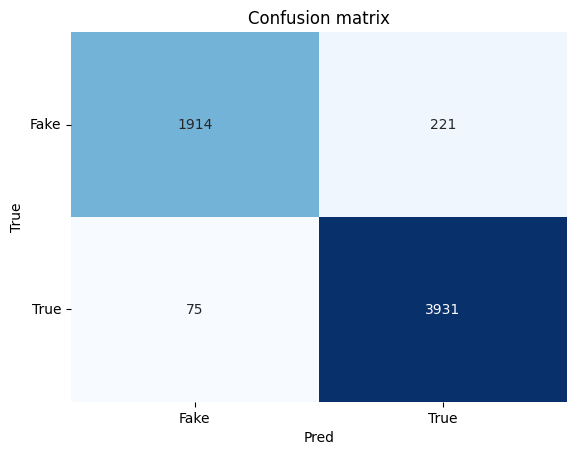

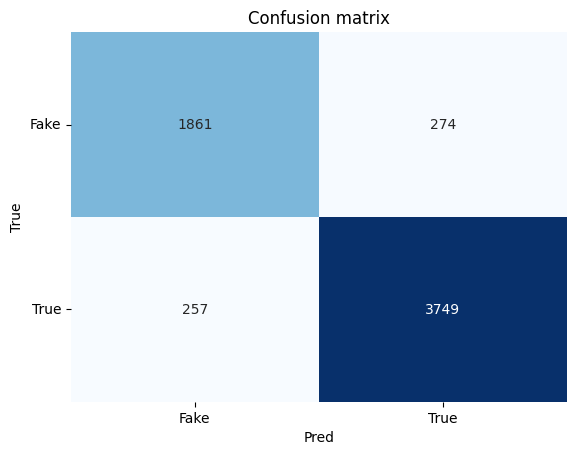

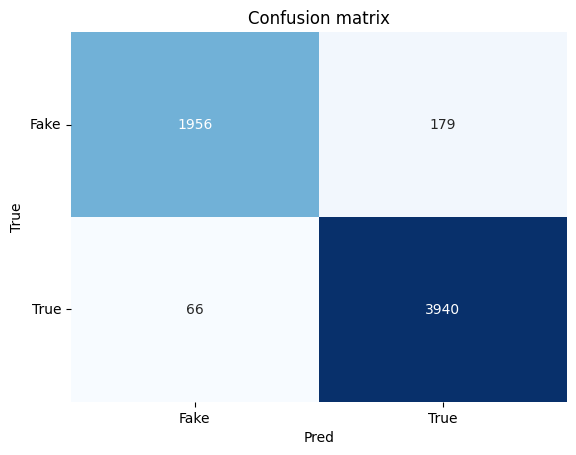

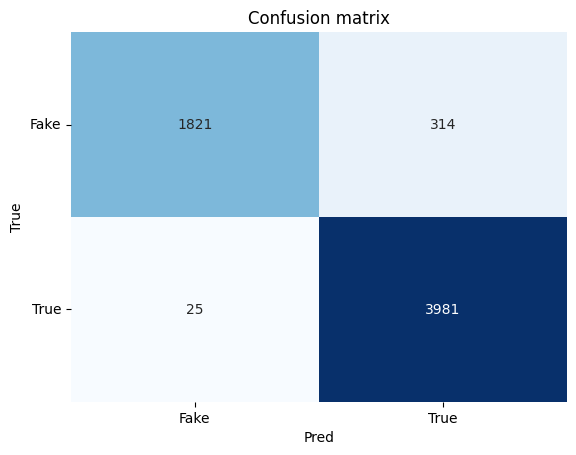

In [ ]:
# 存結果
result_set_T_or_F_tfidf = dict()

# 定義模型訓練組合
model_set2 = dict()
model_set2['clf_logistic_tfidf'] = LogisticRegression()
model_set2['clf_dtree_tfidf'] = DecisionTreeClassifier()
model_set2['clf_svm_tfidf'] = svm.SVC(probability=True)
model_set2['clf_rf_tfidf'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = TfidfVectorizer(max_features=1000, stop_words=stops2)

for k, model in model_set2.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_T_or_F_tfidf[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

result2 = result_set_T_or_F_count  # or orig.copy()
result2.update(result_set_T_or_F_tfidf)

## choose max f1-score model from result_set
for k, v in result2.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_svm_tfidf


In [ ]:
y_pred = model_set['clf_logistic_tfidf'].predict(vectorizer.transform(y_test))
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

        Fake       0.34      1.00      0.50       884
        True       0.00      0.00      0.00      1748

    accuracy                           0.34      2632
   macro avg       0.17      0.50      0.25      2632
weighted avg       0.11      0.34      0.17      2632



now training: clf_logistic_freq
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.63      0.70      0.67      1068
Fake_News_before_Election       0.70      0.62      0.65      1067
 True_News_After_Election       0.87      0.88      0.88      2524
True_News_before_Election       0.79      0.79      0.79      1482

                 accuracy                           0.78      6141
                macro avg       0.75      0.75      0.75      6141
             weighted avg       0.78      0.78      0.78      6141

now training: clf_dtree_freq
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.56      0.61      0.59      1068
Fake_News_before_Election       0.64      0.59      0.61      1067
 True_News_After_Election       0.83      0.83      0.83      2524
True_News_before_Election       0.73      0.73      0.73      1482

                 accuracy                           0.72      6

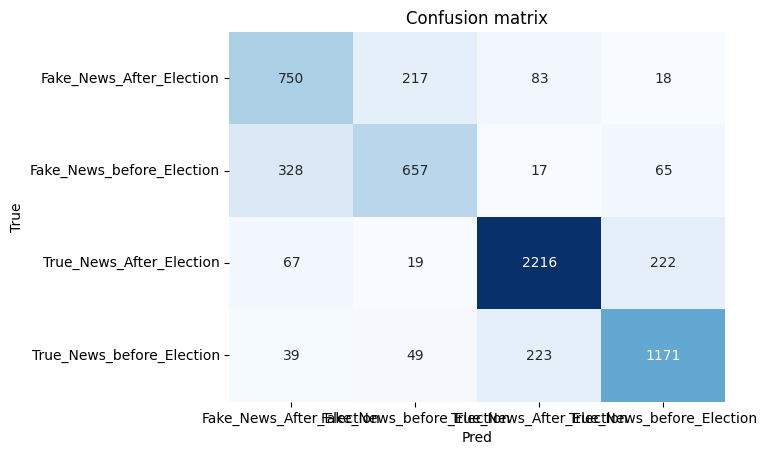

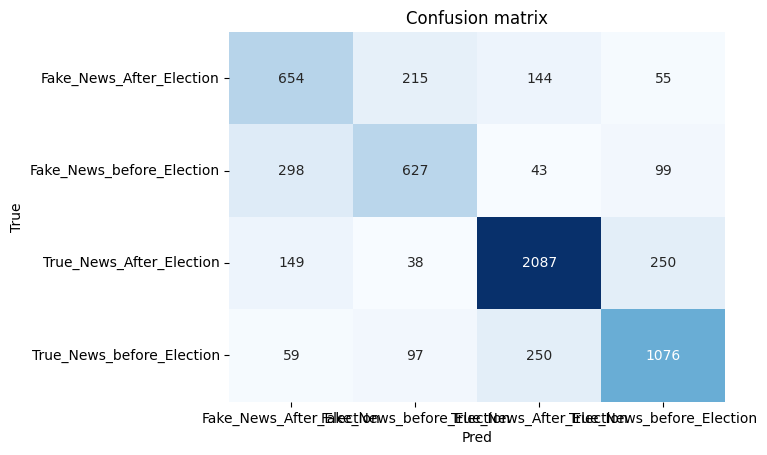

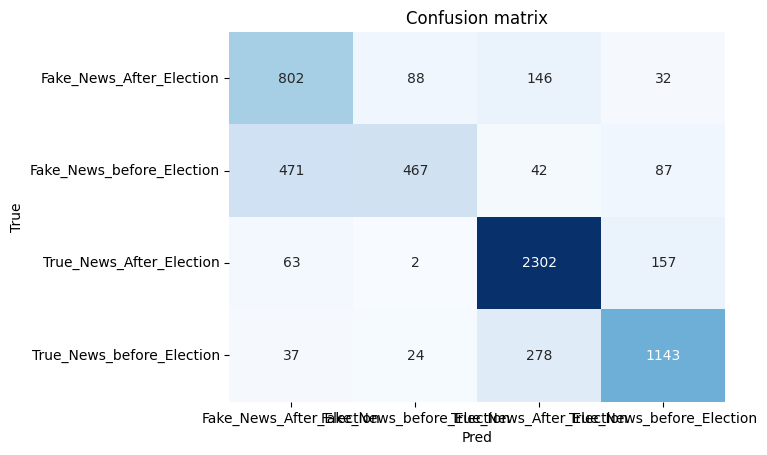

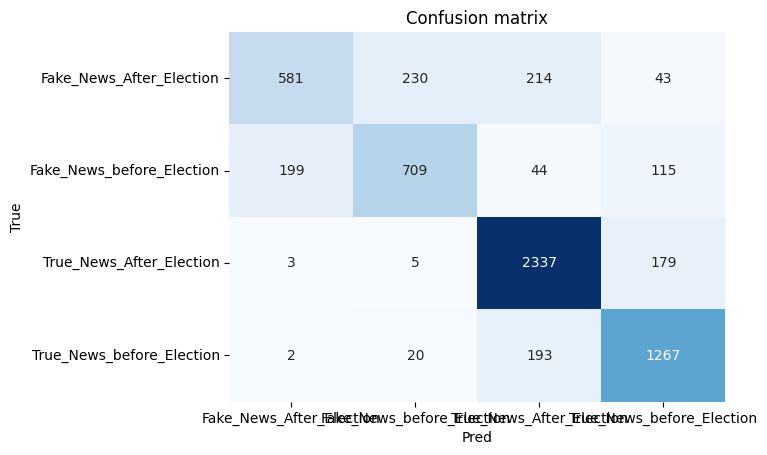

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
data = news.copy()
X = data["text"]
y_category = data["category"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y_category, test_size=0.3, random_state=777
)

# 存結果
result_set_category_count = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic_freq'] = LogisticRegression()
model_set['clf_dtree_freq'] = DecisionTreeClassifier()
model_set['clf_svm_freq'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf_freq'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = CountVectorizer(max_features=1000, stop_words=stops3)

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_category_count[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

now training: clf_logistic_tfidf
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.68      0.72      0.70      1068
Fake_News_before_Election       0.78      0.62      0.69      1067
 True_News_After_Election       0.85      0.92      0.88      2524
True_News_before_Election       0.82      0.79      0.80      1482

                 accuracy                           0.80      6141
                macro avg       0.78      0.76      0.77      6141
             weighted avg       0.80      0.80      0.80      6141

now training: clf_dtree_tfidf
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.57      0.61      0.59      1068
Fake_News_before_Election       0.64      0.57      0.61      1067
 True_News_After_Election       0.82      0.84      0.83      2524
True_News_before_Election       0.73      0.71      0.72      1482

                 accuracy                           0.72     

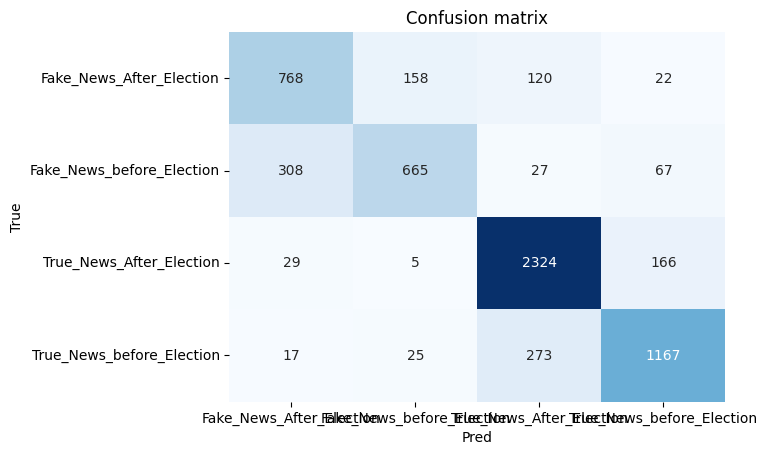

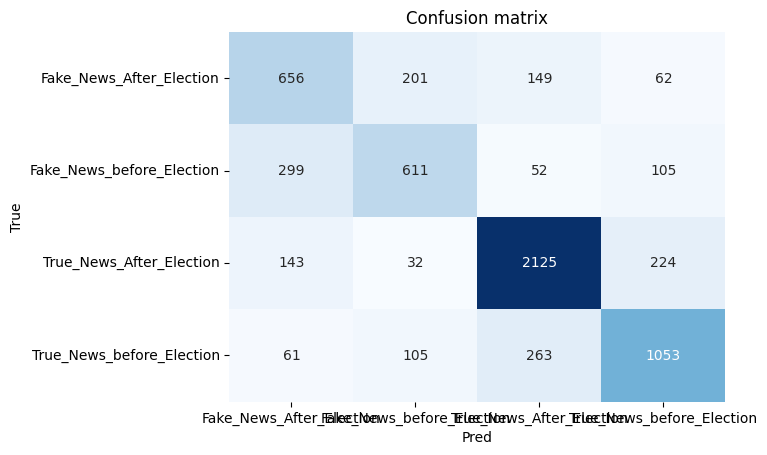

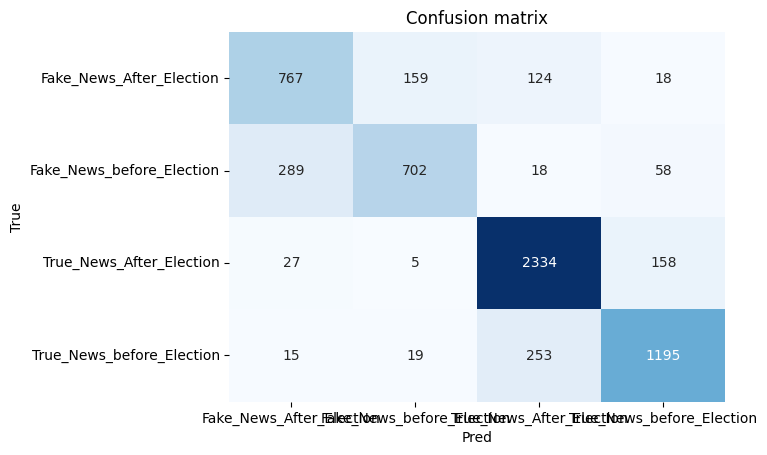

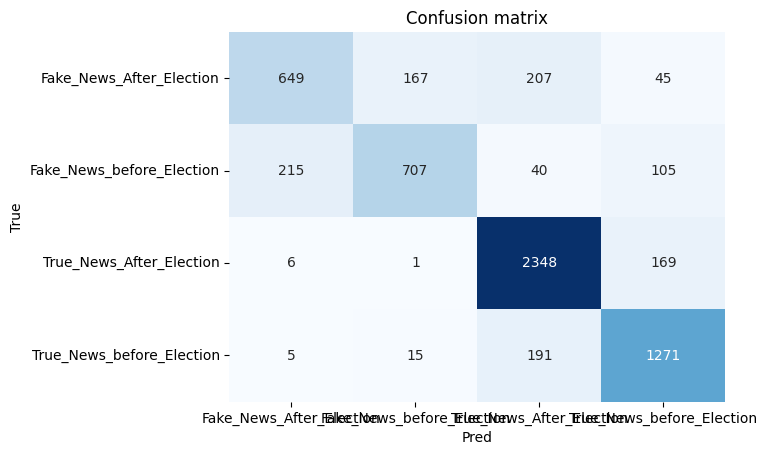

In [ ]:
# 存結果
result_set_category_tfidf = dict()

# 定義模型訓練組合
model_set2 = dict()
model_set2['clf_logistic_tfidf'] = LogisticRegression()
model_set2['clf_dtree_tfidf'] = DecisionTreeClassifier()
model_set2['clf_svm_tfidf'] = svm.SVC(probability=True)
model_set2['clf_rf_tfidf'] = RandomForestClassifier()

# 定義 vectorizer
vectorizer = TfidfVectorizer(max_features=1000, stop_words=stops3)

for k, model in model_set2.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_category_tfidf[k] = train_cv(vectorizer, model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

result2 = result_set_category_count  # or orig.copy()
result2.update(result_set_category_tfidf)

## choose max f1-score model from result_set
for k, v in result2.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_svm_tfidf


In [ ]:
y_pred = model_set2['clf_rf_tfidf'].predict(vectorizer.transform(X_test))
print(classification_report(y_test, y_pred))

                           precision    recall  f1-score   support

 Fake_News_After_Election       0.75      0.61      0.67       457
Fake_News_before_Election       0.75      0.65      0.70       427
 True_News_After_Election       0.85      0.92      0.88      1080
True_News_before_Election       0.80      0.86      0.83       668

                 accuracy                           0.81      2632
                macro avg       0.79      0.76      0.77      2632
             weighted avg       0.80      0.81      0.80      2632



#### Embeddings

In [ ]:
# 定義模型訓練組合
## pipeline: 資料處理 vectorizer + 分類器 clf
## 由於 cross-validation 會自動將資料分成 train/test，因此 input 只要給 X, y 即可

def train_cv(clf, X, y):

    ## train classifier
    vec_X = X

    ## get cv results
    cv_results = cross_validate(clf, vec_X, y, cv=5, return_estimator=True)
    y_pred = cross_val_predict(clf, vec_X, y, cv=5)
    y_pred_proba = cross_val_predict(clf, vec_X, y, cv=5, method="predict_proba")

    # one-hot encoding
    enc = OneHotEncoder(sparse_output=False)
    enc.fit(y.values.reshape(-1, 1))

    ## Accuracy, Precision, Recall, F1-score
    cls_report = classification_report(y, y_pred, output_dict=True)
    print(classification_report(y, y_pred))

    classes = cv_results['estimator'][0].classes_

    ## Plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt="d", ax=ax, cmap=plt.cm.Blues, cbar=False)
    ax.set(
        xlabel="Pred",
        ylabel="True",
        xticklabels=classes,
        yticklabels=classes,
        title="Confusion matrix",
    )
    plt.yticks(rotation=0)

    clf.fit(vec_X, y)
    # return the model object
    return cls_report

now training: clf_logistic
                 precision    recall  f1-score   support

 After Election       0.80      0.85      0.82      3592
before Election       0.77      0.70      0.73      2549

       accuracy                           0.79      6141
      macro avg       0.78      0.77      0.78      6141
   weighted avg       0.79      0.79      0.79      6141

now training: clf_dtree
                 precision    recall  f1-score   support

 After Election       0.69      0.71      0.70      3592
before Election       0.58      0.56      0.57      2549

       accuracy                           0.65      6141
      macro avg       0.63      0.63      0.63      6141
   weighted avg       0.64      0.65      0.64      6141

now training: clf_svm
                 precision    recall  f1-score   support

 After Election       0.77      0.85      0.81      3592
before Election       0.75      0.65      0.70      2549

       accuracy                           0.77      6141
      m

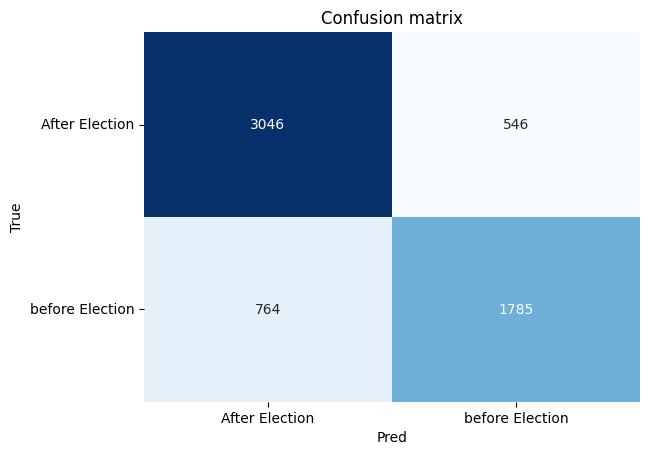

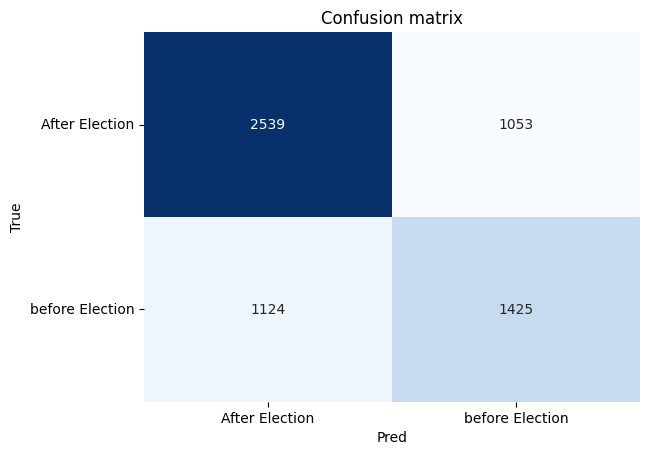

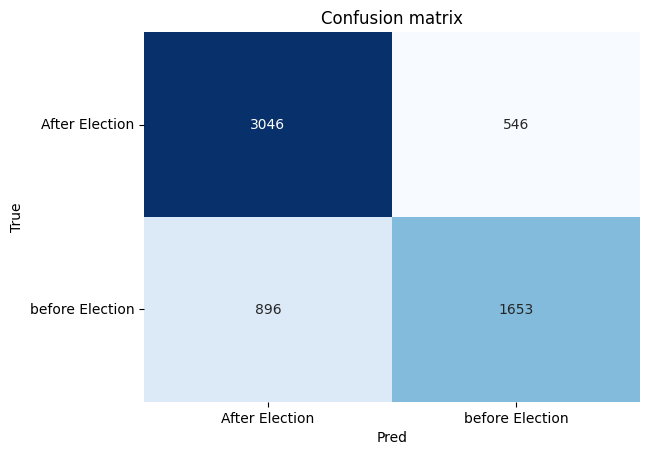

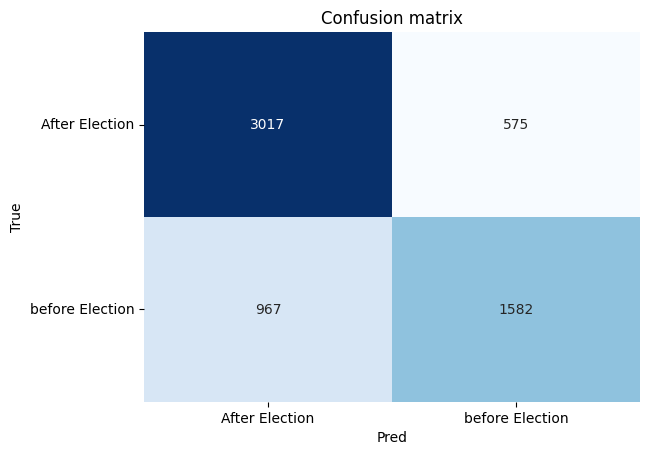

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
data = news.copy()
X = data["embeddings"].apply(pd.Series)
y_period = data["period"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y_period, test_size=0.3, random_state=777
)

# 存結果
result_set_period_embeddings = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic'] = LogisticRegression()
model_set['clf_dtree'] = DecisionTreeClassifier()
model_set['clf_svm'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf'] = RandomForestClassifier()

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_period_embeddings[k] = train_cv(model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

## choose max f1-score model from result_set
for k, v in result_set_period_embeddings.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_logistic


In [ ]:
y_pred = model_set['clf_logistic'].predict(X_test)
print(classification_report(y_test, y_pred))

                 precision    recall  f1-score   support

 After Election       0.80      0.86      0.83      1537
before Election       0.78      0.70      0.73      1095

       accuracy                           0.79      2632
      macro avg       0.79      0.78      0.78      2632
   weighted avg       0.79      0.79      0.79      2632



now training: clf_logistic
              precision    recall  f1-score   support

        Fake       0.99      0.98      0.99      2135
        True       0.99      1.00      0.99      4006

    accuracy                           0.99      6141
   macro avg       0.99      0.99      0.99      6141
weighted avg       0.99      0.99      0.99      6141

now training: clf_dtree
              precision    recall  f1-score   support

        Fake       0.88      0.87      0.87      2135
        True       0.93      0.94      0.93      4006

    accuracy                           0.91      6141
   macro avg       0.90      0.90      0.90      6141
weighted avg       0.91      0.91      0.91      6141

now training: clf_svm
              precision    recall  f1-score   support

        Fake       0.99      0.97      0.98      2135
        True       0.99      0.99      0.99      4006

    accuracy                           0.99      6141
   macro avg       0.99      0.98      0.99      6141
w

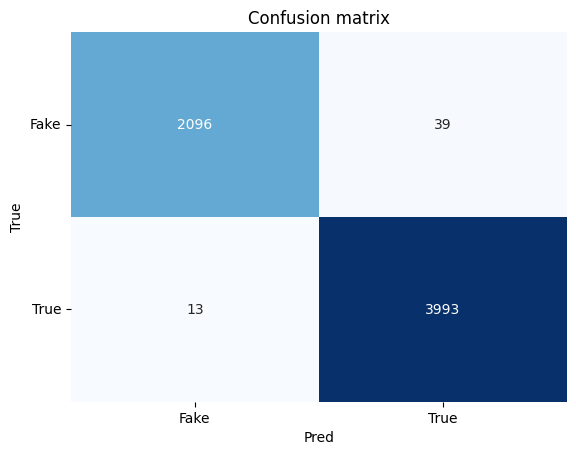

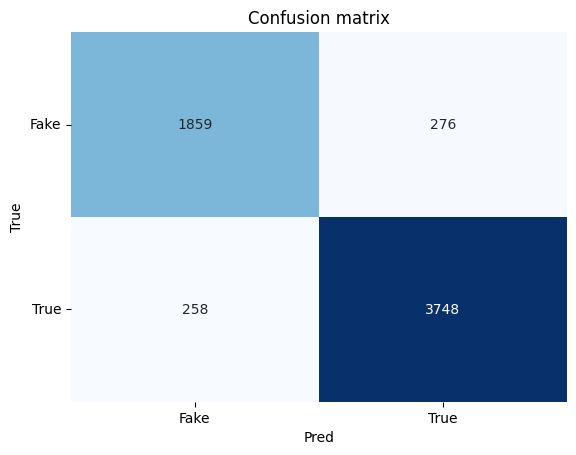

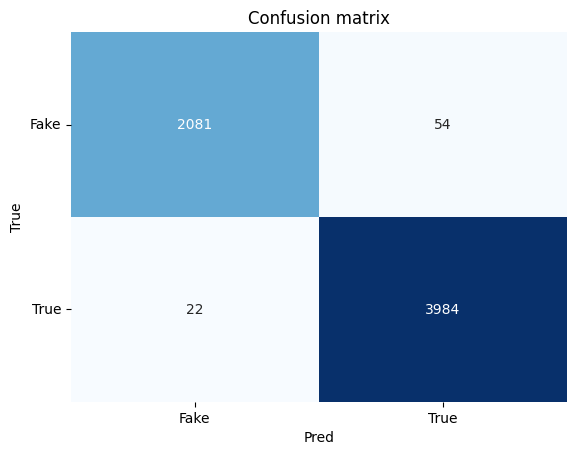

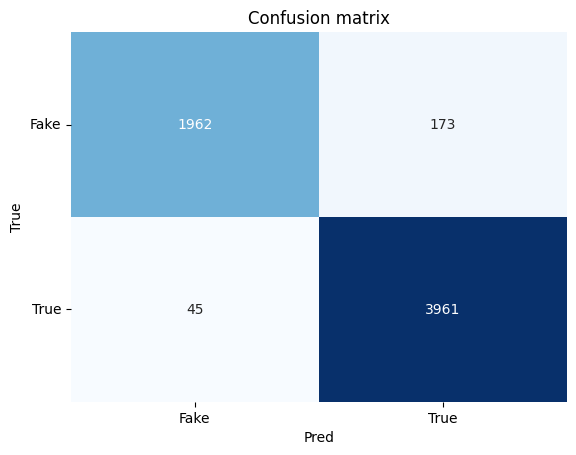

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
X = data["embeddings"].apply(pd.Series)
y_T_or_F = data["T_or_F"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y_T_or_F, test_size=0.3, random_state=777
)

# 存結果
result_set_T_or_F_embeddings = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic'] = LogisticRegression()
model_set['clf_dtree'] = DecisionTreeClassifier()
model_set['clf_svm'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf'] = RandomForestClassifier()

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_T_or_F_embeddings[k] = train_cv(model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

## choose max f1-score model from result_set
for k, v in result_set_T_or_F_embeddings.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_logistic


In [ ]:
y_pred = model_set['clf_logistic'].predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

        Fake       0.99      0.98      0.99       884
        True       0.99      0.99      0.99      1748

    accuracy                           0.99      2632
   macro avg       0.99      0.99      0.99      2632
weighted avg       0.99      0.99      0.99      2632



now training: clf_logistic
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.70      0.72      0.71      1068
Fake_News_before_Election       0.73      0.69      0.71      1067
 True_News_After_Election       0.84      0.88      0.86      2524
True_News_before_Election       0.78      0.74      0.76      1482

                 accuracy                           0.79      6141
                macro avg       0.76      0.76      0.76      6141
             weighted avg       0.78      0.79      0.78      6141

now training: clf_dtree
                           precision    recall  f1-score   support

 Fake_News_After_Election       0.50      0.55      0.52      1068
Fake_News_before_Election       0.53      0.48      0.50      1067
 True_News_After_Election       0.70      0.70      0.70      2524
True_News_before_Election       0.50      0.50      0.50      1482

                 accuracy                           0.59      6141
      

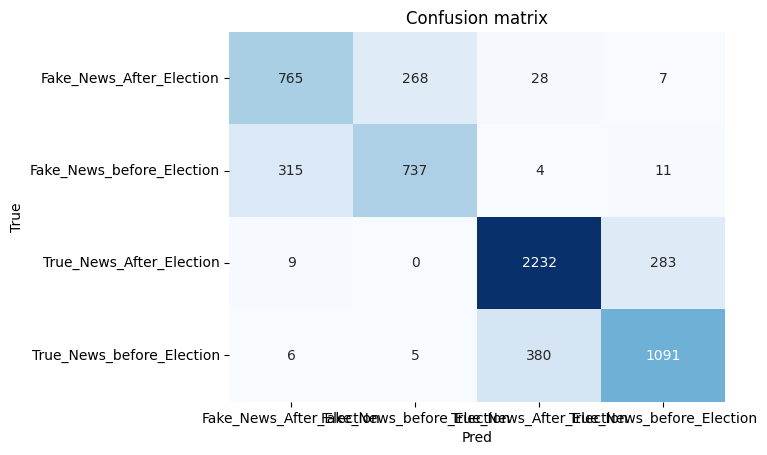

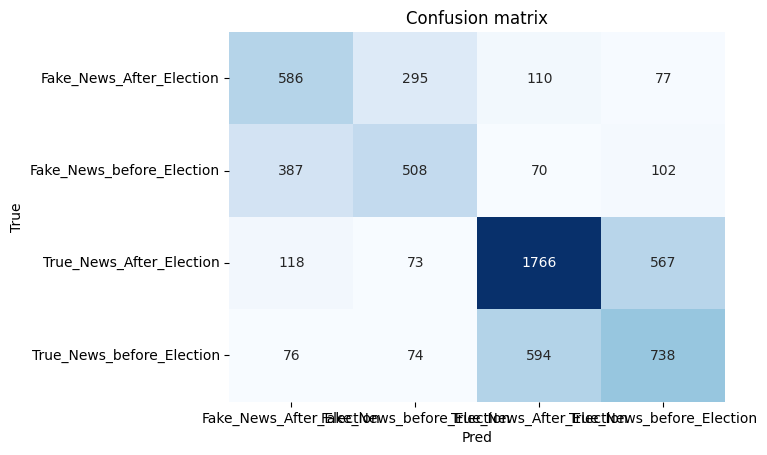

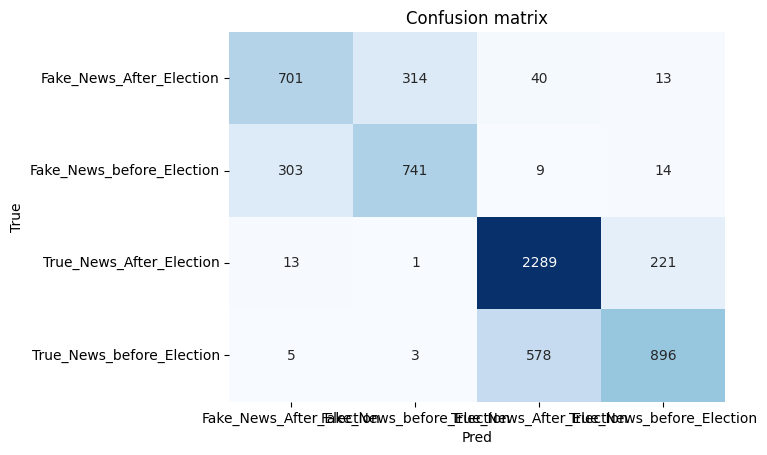

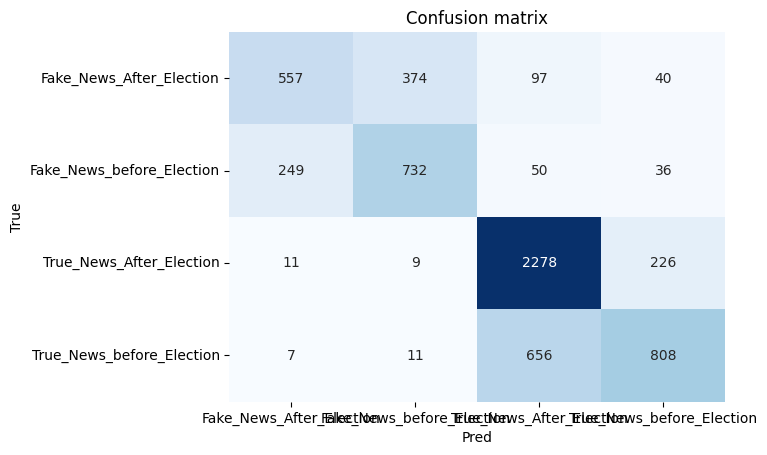

In [ ]:
warnings.filterwarnings('ignore')

# 準備訓練資料
X = data["embeddings"].apply(pd.Series)
y_category = data["category"]
# 把整個資料集七三切
X_train, X_test, y_train, y_test = train_test_split(
    X, y_category, test_size=0.3, random_state=777
)

# 存結果
result_set_category_embeddings = dict()

# 定義模型訓練組合
model_set = dict()
model_set['clf_logistic'] = LogisticRegression()
model_set['clf_dtree'] = DecisionTreeClassifier()
model_set['clf_svm'] = svm.SVC(probability=True) # 要使用SVM的predict_proba的話，必須在叫出SVC的時候就將probability設為True
model_set['clf_rf'] = RandomForestClassifier()

for k, model in model_set.items():
    print("="*100)
    print(f"now training: {k}")
    result_set_category_embeddings[k] = train_cv(model, X_train, y_train)
    print("="*100)

In [ ]:
max = 0
best_model_name = ""
best_model_metric = "f1-score"

## choose max f1-score model from result_set
for k, v in result_set_category_embeddings.items():
    if v['weighted avg'][best_model_metric] > max:
        max = v['weighted avg'][best_model_metric]
        best_model_name = k
print(f"best model: {best_model_name}")

best model: clf_logistic


In [ ]:
y_pred = model_set['clf_logistic'].predict(X_test)
print(classification_report(y_test, y_pred))

                           precision    recall  f1-score   support

 Fake_News_After_Election       0.71      0.73      0.72       457
Fake_News_before_Election       0.72      0.69      0.70       427
 True_News_After_Election       0.84      0.88      0.86      1080
True_News_before_Election       0.80      0.74      0.77       668

                 accuracy                           0.79      2632
                macro avg       0.77      0.76      0.76      2632
             weighted avg       0.79      0.79      0.79      2632



#### 模型分析小節

##### 預測大選前後
1. 可以發現將文章以TF-IDF的方式轉DTM文章的效果比以詞頻轉DTM或是Embedding的方式模型準確度較高
2. 而四種模型(邏輯式回歸、決策數、SVM、隨機森林)又以隨機森林的模型預測準確度較高
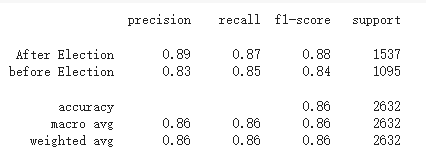

##### 預測真假新聞
1. 可以發現將文章Embedding的模型效果比以TF-IDF或詞頻的方式轉DTM文章的模型準確度較高
2. 而四種模型(邏輯式回歸、決策數、SVM、隨機森林)又以邏輯式回歸的模型預測準確度較高
3. 可能是因為Embedding把影響因素較高停用字考慮進去的緣故

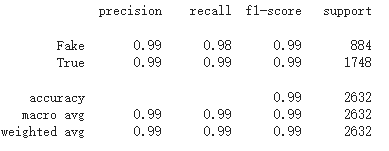

##### 預測類別
1. 可以發現將文章以TF-IDF的方式轉DTM文章的效果比以詞頻轉DTM或是Embedding的方式模型準確度較高
2. 而四種模型(邏輯式回歸、決策數、SVM、隨機森林)又以隨機森林的模型預測準確度較高
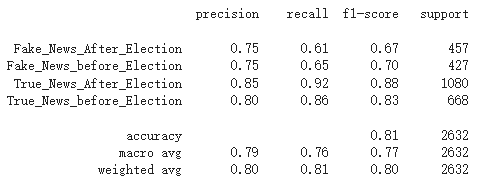

#### 分析可解釋模型的結果

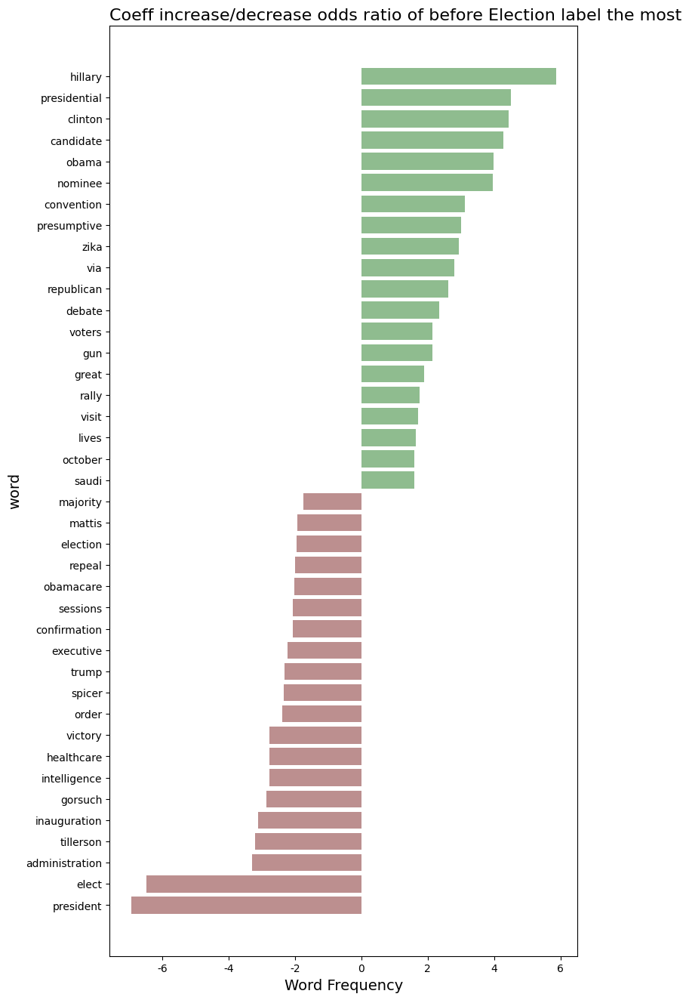

In [ ]:
def plot_coef(logistic_reg_model, feature_names, top_n=10):
    # 選出某個類別的前10大影響力字詞
    log_odds = logistic_reg_model.coef_.T
    coef_df = pd.DataFrame(
        log_odds,
        columns=logistic_reg_model.classes_[[1]], index=feature_names
    )
    for label in coef_df.columns:
        select_words = (
            coef_df[[label]]
            .sort_values(by=label, ascending=False)
            .iloc[np.r_[0:top_n, -top_n:0]]
        )
        word = select_words.index
        count = select_words[label]
        category_colors = np.where(
            select_words[label] >= 0, "darkseagreen", "rosybrown"
        )  # 設定顏色

        fig, ax = plt.subplots(figsize=(8, top_n*0.8))  # 設定畫布
        plt.rcParams["axes.unicode_minus"] = False

        ax.barh(word, count, color=category_colors)
        ax.invert_yaxis()
        ax.set_title(
            "Coeff increase/decrease odds ratio of " + label + " label the most",
            loc="left",
            size=16,
        )
        ax.set_ylabel("word", size=14)
        ax.set_xlabel("Word Frequency", size=14)

# plot logistic model
plot_coef(logistic_reg_model=model_set2['clf_logistic_tfidf'], feature_names=vectorizer.get_feature_names_out(), top_n=20)

1. 川普當選的緣故，所以大選前希拉蕊的討論度較高；打選後則是川普的討論度較高
2. 大選前有許多選舉相關的詞彙對分類結果的影響較大，像是：nominee、voter、debate...
3. 大選後有許多選舉相關的詞彙對分類結果的影響較大，像是：president、inauguration...
4. 大選前比較多討論的議題為：茲卡病毒、槍枝議題、種族議題；大選後比較多討論的議題則為：行政人員配置(administration、tillerson、gorsuch)、健保議題

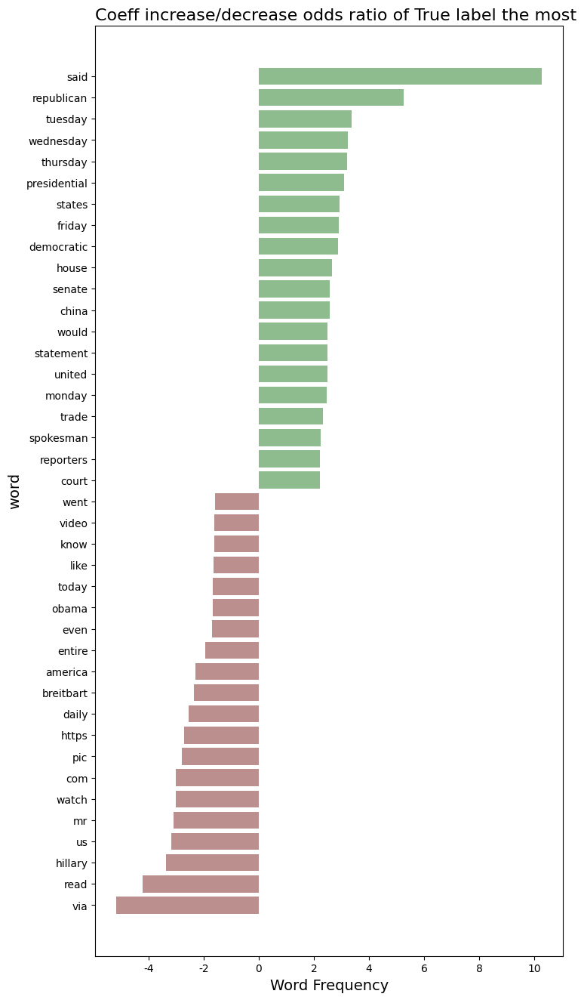

In [ ]:
def plot_coef(logistic_reg_model, feature_names, top_n=10):
    # 選出某個類別的前10大影響力字詞
    log_odds = logistic_reg_model.coef_.T
    coef_df = pd.DataFrame(
        log_odds,
        columns=logistic_reg_model.classes_[[1]], index=feature_names
    )
    for label in coef_df.columns:
        select_words = (
            coef_df[[label]]
            .sort_values(by=label, ascending=False)
            .iloc[np.r_[0:top_n, -top_n:0]]
        )
        word = select_words.index
        count = select_words[label]
        category_colors = np.where(
            select_words[label] >= 0, "darkseagreen", "rosybrown"
        )  # 設定顏色

        fig, ax = plt.subplots(figsize=(8, top_n*0.8))  # 設定畫布
        plt.rcParams["axes.unicode_minus"] = False

        ax.barh(word, count, color=category_colors)
        ax.invert_yaxis()
        ax.set_title(
            "Coeff increase/decrease odds ratio of " + label + " label the most",
            loc="left",
            size=16,
        )
        ax.set_ylabel("word", size=14)
        ax.set_xlabel("Word Frequency", size=14)

# plot logistic model
plot_coef(logistic_reg_model=model_set['clf_logistic_tfidf'], feature_names=vectorizer.get_feature_names_out(), top_n=20)

1. 可以發現有標註星期幾的新聞多為真新聞；標註每日或是今天的則多為假新聞
2. 假新聞則有很多新聞來源、網址或圖片等資訊
3. 真新聞多會引用他人的發言，所以有以下字眼：reporters、spokesman、statement、said...
4. 真新聞也多會提及政黨(democratic、republican)及重要政治場所(senate、white house)

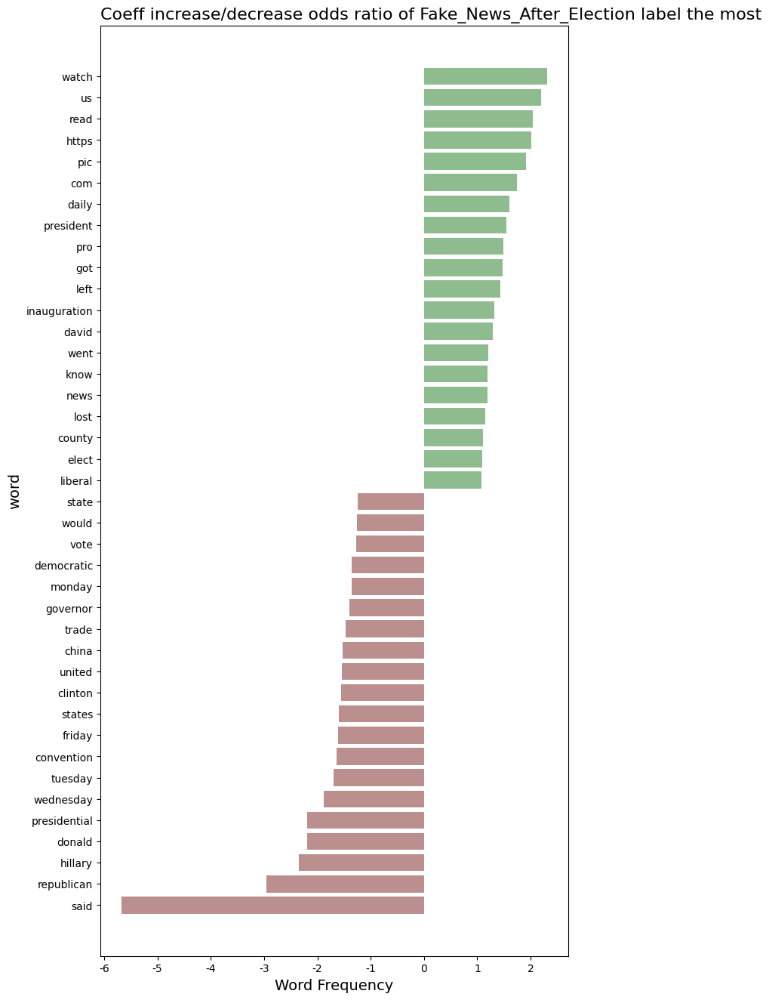

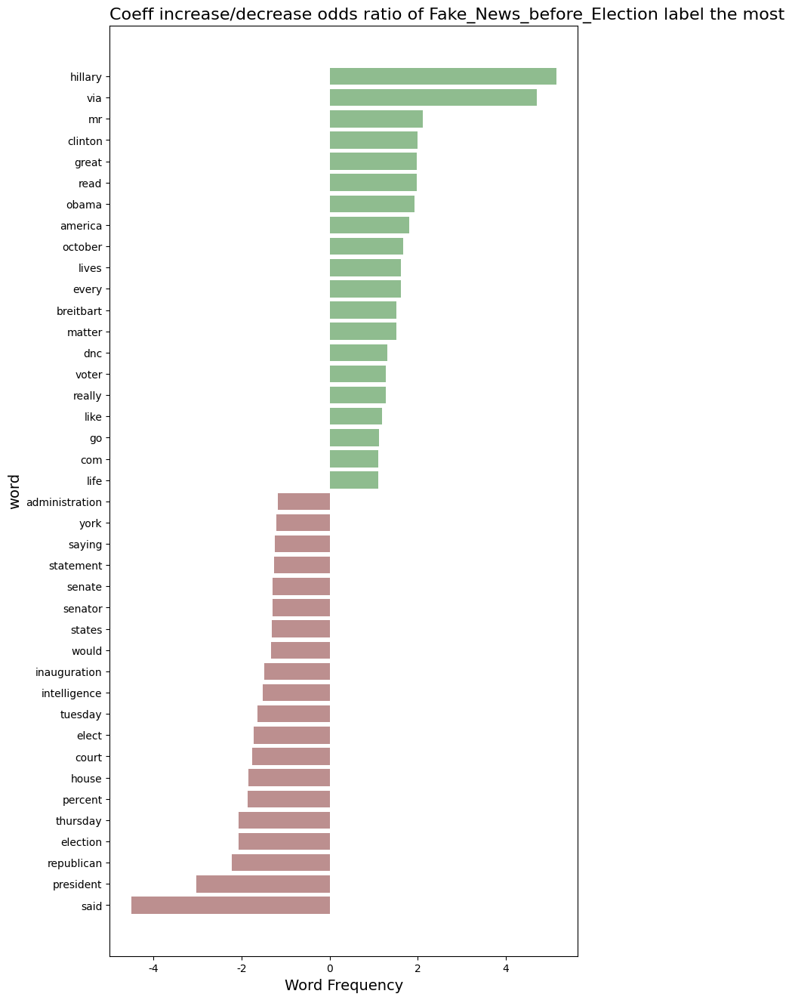

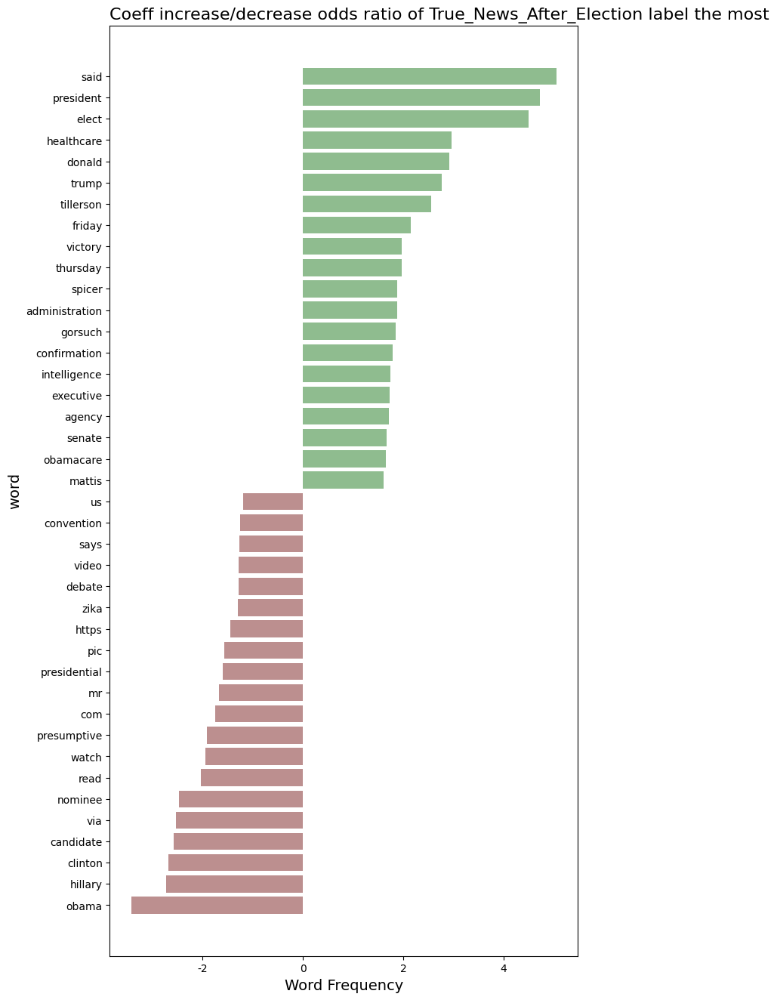

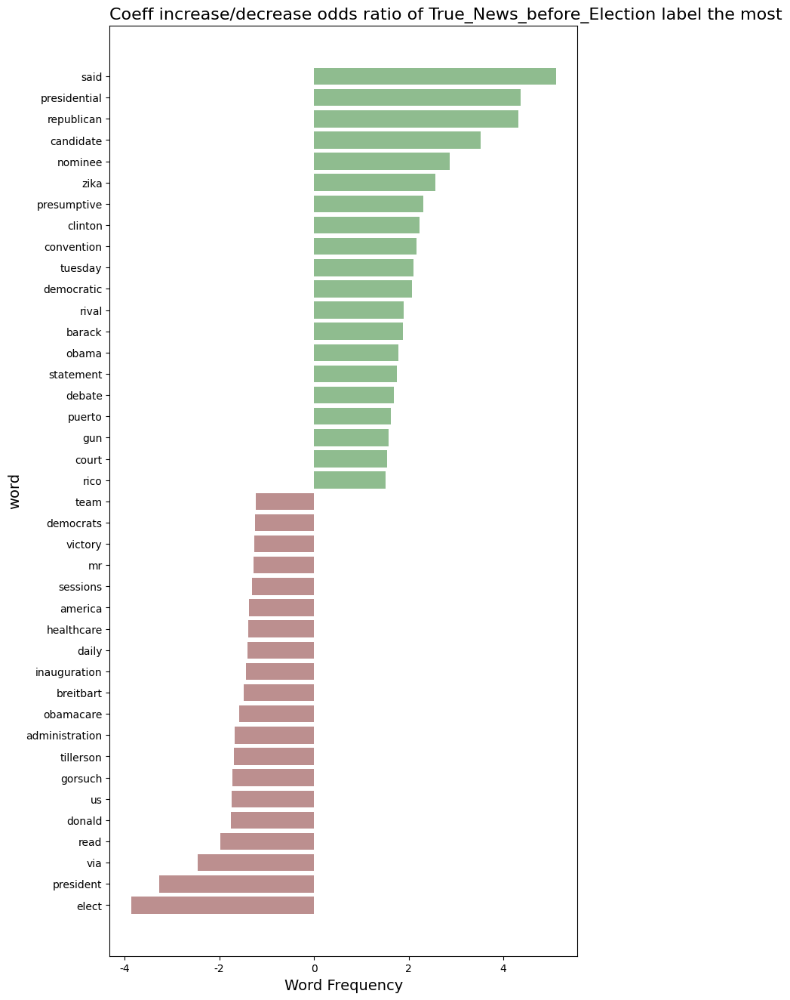

In [ ]:
def plot_coef(logistic_reg_model, feature_names, top_n=10):
    # 選出某個類別的前10大影響力字詞
    log_odds = logistic_reg_model.coef_.T
    coef_df = pd.DataFrame(
        log_odds,
        columns=logistic_reg_model.classes_, index=feature_names
    )
    for label in coef_df.columns:
        select_words = (
            coef_df[[label]]
            .sort_values(by=label, ascending=False)
            .iloc[np.r_[0:top_n, -top_n:0]]
        )
        word = select_words.index
        count = select_words[label]
        category_colors = np.where(
            select_words[label] >= 0, "darkseagreen", "rosybrown"
        )  # 設定顏色

        fig, ax = plt.subplots(figsize=(8, top_n*0.8))  # 設定畫布
        plt.rcParams["axes.unicode_minus"] = False

        ax.barh(word, count, color=category_colors)
        ax.invert_yaxis()
        ax.set_title(
            "Coeff increase/decrease odds ratio of " + label + " label the most",
            loc="left",
            size=16,
        )
        ax.set_ylabel("word", size=14)
        ax.set_xlabel("Word Frequency", size=14)

# plot logistic model
plot_coef(logistic_reg_model=model_set2['clf_logistic_tfidf'], feature_names=vectorizer.get_feature_names_out(), top_n=20)

## 主題模型

In [ ]:
import re
from nltk.corpus import stopwords

from pprint import pprint
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from gensim.models import Phrases
from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel
from gensim.matutils import corpus2csc

import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import pyLDAvis
import pyLDAvis.gensim_models

In [ ]:
content_df = df.assign(sentence = df['text'].apply(nltk.sent_tokenize)).explode('sentence').drop(['text'], axis=1)

# 刪除標點符號/數字/換行符號，只留下英文字母和空格(包含換行符號)
content_df["sentence"] = content_df["sentence"].apply(lambda x: re.sub(r'[^\w\s]','', str(x)))
# 刪除長度小於1的句子
content_df = content_df[~content_df["sentence"].str.len() < 1]
content_df

# token_df = content_df.assign(token = content_df['sentence'].apply(nltk.word_tokenize)).explode('token')
# token_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,title,subject,date,Authenticity,month,sentence
0,"Trump blasts retailer Nordstrom, raising new c...",politics,2017-02-08,True,2017-02,WASHINGTONCHICAGO Reuters This February 8 sto...
0,"Trump blasts retailer Nordstrom, raising new c...",politics,2017-02-08,True,2017-02,It did not sell Ivanka Trump products
0,"Trump blasts retailer Nordstrom, raising new c...",politics,2017-02-08,True,2017-02,President Donald Trump blasted department stor...
0,"Trump blasts retailer Nordstrom, raising new c...",politics,2017-02-08,True,2017-02,After Trumps highly unusual move to use a Whit...
0,"Trump blasts retailer Nordstrom, raising new c...",politics,2017-02-08,True,2017-02,But White House spokesman Sean Spicer characte...
...,...,...,...,...,...,...
2949,"A disenchanted Republican, fearing Trump, laun...",politics,2016-08-08,True,2016-08,He was widely criticized including by some sen...
2950,"Trump, in shift, to call for top tax rate of 3...",politics,2016-08-08,True,2016-08,WASHINGTON Reuters Republican presidential ho...
2950,"Trump, in shift, to call for top tax rate of 3...",politics,2016-08-08,True,2016-08,In a tweet and posting on its website CNBC sai...
2951,"Trump would freeze new federal regulations, re...",politics,2016-08-08,True,2016-08,WASHINGTON Reuters Republican presidential ca...


In [ ]:
#從之前分析加入新的停用字
nltk.download('stopwords')
stop_words = stopwords.words('english')
newStops = ['could', 'would', 'much', 'must', 'said', 'us', 'reuters', 'also', 'year', 'new',
            'one', 'like', 'say', 'go', 'time', 'even', 'make', 'via', 'get', 'people',
            'right', 'know', 'want', 'say', 'call',]
stop_words.extend(newStops)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
newStops1 = ['could', 'would', 'much', 'must', 'said', 'us', 'reuters', 'also', 'year', 'new',
            'one', 'like', 'say', 'go', 'time', 'even', 'make', 'via', 'get', 'people',
            'right', 'know', 'want', 'say', 'call',]
stop_words.extend(newStops1)

In [ ]:
df = df.groupby('month')['text'].apply(lambda x: " ".join(x)).reset_index()
df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,month,text
0,2016-08,HONOLULU (Reuters) - Preserving natural places...
1,2016-09,WASHINGTON (Reuters) - Republican presidential...
2,2016-10,WASHINGTON (Reuters) - The U.S. State Departme...
3,2016-11,WASHINGTON (Reuters) - A last-ditch effort in ...
4,2016-12,(Reuters) - A member of the Mormon Tabernacle ...
5,2017-01,WASHINGTON (Reuters) - Nationals from seven Mu...
6,2017-02,WASHINGTON/CHICAGO (Reuters) - (This February ...


In [ ]:
df['text'] = df['text'].str.lower()
docs = [[word for word in doc.split() if word not in stop_words] for doc in df['text']]
len(docs)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


7

在 docs 裡面新增出現次數大於 20 次的 bigram

In [ ]:
# Compute bigrams.

# Add bigrams and trigrams to docs (only ones that appear 20 times or more).
bigram = Phrases(docs, min_count=20)
for idx in range(len(docs)):
    for token in bigram[docs[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            docs[idx].append(token)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Create a dictionary representation of the documents.
dictionary = Dictionary(docs)

print(dictionary)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Dictionary<60126 unique tokens: ['"most', '#blackface', '#dems', '#laflood', '#protecthillary']...>


In [ ]:
# Bag-of-words representation of the documents.
# 用 gensim ldamodel input 需要將文章轉換成 bag of words
corpus = [dictionary.doc2bow(doc) for doc in docs]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
t0 = time.time()

topic_num_list = np.arange(2, 16)
result = {"topic_num":[], "perplexity":[], "pmi":[]}
model_set = dict()


for topic_num in topic_num_list:
    # perplexity
    model = LdaModel(
        corpus = corpus,
        num_topics = topic_num ,
        id2word=dictionary,
        random_state = 1500,
        passes=5
        )

    loss = model.log_perplexity(corpus)
    pmi = CoherenceModel(model=model, texts=docs, coherence='c_npmi').get_coherence()
    perplexity = np.exp(-1. * loss)

    # model_set[f'k_{topic_num}'] = model

    result['topic_num'].append(topic_num)
    result['perplexity'].append(perplexity)
    result['pmi'].append(pmi)

print(f"花費時間: {time.time() - t0} sec")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


花費時間: 254.23137044906616 sec


標出各個主題的常見詞，然而成果不盡理想，主要可以歸納成兩大問題  
1.我們以為reuters喜歡報川普的新聞，但是回去追朔資料集發現reuters的真實新聞有21511篇，而假新聞只有324。因此猜測是兩個資料集的蒐集或是呈現方式有些許不同  
2.每個主題的常見詞幾乎一樣，區別不出這些差異

In [ ]:
model.print_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.006*"u.s." + 0.005*"trump" + 0.004*"-" + 0.004*"trump’s" + 0.003*"republican" + 0.003*"said." + 0.003*"president" + 0.002*"united" + 0.002*"clinton" + 0.002*"donald"'),
 (1,
  '0.007*"trump" + 0.005*"u.s." + 0.003*"republican" + 0.002*"said." + 0.002*"-" + 0.002*"president" + 0.002*"campaign" + 0.002*"presidential" + 0.002*"clinton" + 0.002*"trump’s"'),
 (2,
  '0.004*"trump" + 0.003*"u.s." + 0.002*"trump’s" + 0.002*"president" + 0.002*"said." + 0.002*"-" + 0.001*"(reuters)" + 0.001*"clinton" + 0.001*"donald" + 0.001*"republican"'),
 (3,
  '0.008*"trump" + 0.005*"u.s." + 0.003*"-" + 0.003*"republican" + 0.003*"clinton" + 0.003*"president" + 0.003*"trump’s" + 0.002*"presidential" + 0.002*"said." + 0.002*"(reuters)"'),
 (4,
  '0.006*"trump" + 0.005*"u.s." + 0.003*"president" + 0.002*"trump’s" + 0.002*"(reuters)" + 0.002*"republican" + 0.002*"said." + 0.002*"former" + 0.002*"-" + 0.002*"house"'),
 (5,
  '0.012*"trump" + 0.009*"u.s." + 0.007*"clinton" + 0.006*"republican" + 0.005*

### 根據perplexity和pmi重新選擇主題數

In [ ]:
result = pd.DataFrame(result)
result

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,topic_num,perplexity,pmi
0,2,8494.290352,0.004825
1,3,8737.996478,0.039439
2,4,8881.734212,0.005877
3,5,9030.205526,0.026849
4,6,8943.546803,-0.006243
5,7,9076.847292,0.012011
6,8,9379.140091,0.023737
7,9,9840.194055,-0.017408
8,10,9605.272920,0.015223
9,11,10214.372045,0.012054


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: xlabel='topic_num'>

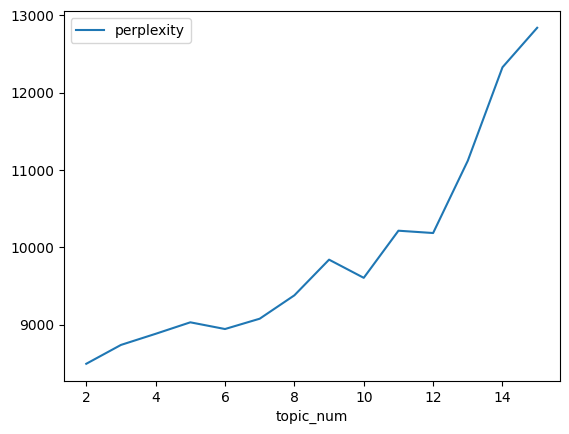

In [ ]:
result.plot.line(x='topic_num', y='perplexity')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: xlabel='topic_num'>

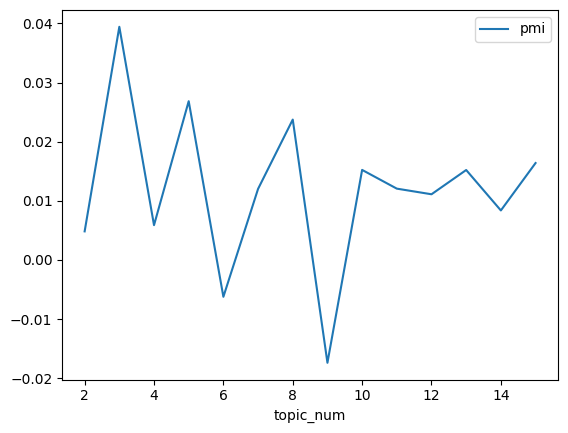

In [ ]:
result.plot.line(x='topic_num', y='pmi')

### 產生 LDAvis 結果
最佳主題數 4 來做 LDAvis 的結果

In [ ]:
model = LdaModel(
    corpus = corpus,
    num_topics = 3,
    id2word=dictionary,
    random_state = 1500,
    passes=5
    )

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


從分析結果還是看不出區別，可能是時間太接近大選，又被鎖定在政治版

In [ ]:
pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(model, corpus, dictionary)
p

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.009068  0.018799       1        1  62.480037
1     -0.025957 -0.013592       2        1  22.109623
2      0.035025 -0.005206       3        1  15.410340, topic_info=                Term         Freq        Total Category  logprob  loglift
12811          trump  9610.000000  9610.000000  Default  30.0000  30.0000
12922           u.s.  8307.000000  8307.000000  Default  29.0000  29.0000
10467     republican  3617.000000  3617.000000  Default  28.0000  28.0000
167                *  1423.000000  1423.000000  Default  27.0000  27.0000
2783         clinton  2614.000000  2614.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
3820      democratic   243.573882  1836.243720   Topic3  -6.2576  -0.1499
12600           told   239.075203  1752.939508   Topic3  -6.2763  -0.1221
13612          white   234.890753  1821.339193   Topic3  -6.2939  -0.1781
5730      government   204.212511  1294.889700   Topic3  -6.4339   0.0231
13065  united_states   206.359960  1462.857990   Topic3  -6.4234  -0.0884

[307 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
25441      1  0.213436         $916
25441      2  0.747026         $916
149        1  0.656889    (reuters)
149        2  0.201730    (reuters)
149        3  0.141356    (reuters)
...      ...       ...          ...
49767      2  0.081088  “one_china”
49767      3  0.587885  “one_china”
49859      1  0.170888       “stern
49859      2  0.170888       “stern
49859      3  0.854441       “stern

[651 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3])

## Bert model

In [ ]:
import pandas as pd
import re
import numpy as np
from collections import defaultdict
import multiprocessing
# import jieba
import matplotlib.pyplot as plt
from matplotlib.font_manager import fontManager

import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import re

# 設定字體
fontManager.addfont('./TaipeiSansTCBeta-Regular.ttf')
plt.rcParams['font.sans-serif'] = ['Taipei Sans TC Beta']
plt.rcParams['font.size'] = '16'

transformers 和 Sentence-transformers （使用 huggingface 模型）

In [ ]:
!pip install sentence_transformers
!pip install ckip_transformers

In [ ]:
from transformers import BertTokenizerFast, AutoTokenizer, AutoModelForTokenClassification, AutoModelForSequenceClassification, pipeline
from sentence_transformers import SentenceTransformer
from ckip_transformers.nlp import CkipWordSegmenter, CkipPosTagger, CkipNerChunker

BERTopic

In [ ]:
!pip install bertopic

In [ ]:
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans

### 前處理

這部份一樣選擇真假資料合併的政治版新聞，但時間縮短為選前一個月（已斷句）

In [ ]:
# 讀入資料集
en_origin_data = pd.read_csv('./raw_data/one_month_sentence.csv')
metaData = en_origin_data.drop(['subject', 'month'], axis=1)
sampled_data = en_origin_data.sample(frac=0.2, random_state=42)
metaData.head()

,title,date,Authenticity,sentence
0,"Clinton, Obama pledge unity behind Trump presi...",2016-11-07,True,Reuters Republican Donald Trump put aside the...
1,"Clinton, Obama pledge unity behind Trump presi...",2016-11-07,True,After Trumps stunning upset of the heavily fav...
2,"Clinton, Obama pledge unity behind Trump presi...",2016-11-07,True,Donald Trump is going to be our president
3,"Clinton, Obama pledge unity behind Trump presi...",2016-11-07,True,We owe him an open mind and the chance to lead...
4,"Clinton, Obama pledge unity behind Trump presi...",2016-11-07,True,While her loss was painful and it will be for ...


In [ ]:
tokenizer = AutoTokenizer.from_pretrained("dslim/bert-base-NER")
model = AutoModelForTokenClassification.from_pretrained("dslim/bert-base-NER")

nlp = pipeline("ner", model=model, tokenizer=tokenizer)

Some weights of the model checkpoint at dslim/bert-base-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


[[{'entity': 'B-PER',
   'score': 0.9990139,
   'index': 4,
   'word': 'Wolfgang',
   'start': 11,
   'end': 19},
  {'entity': 'B-LOC',
   'score': 0.999645,
   'index': 9,
   'word': 'Berlin',
   'start': 34,
   'end': 40}],
 [{'entity': 'B-PER',
   'score': 0.9987392,
   'index': 1,
   'word': 'Obama',
   'start': 0,
   'end': 5},
  {'entity': 'B-LOC',
   'score': 0.99977475,
   'index': 4,
   'word': 'USA',
   'start': 12,
   'end': 15}]]

### Text Clustering

In [ ]:
docs = en_origin_data['sentence'].tolist()

# 定義不同 layer 所要使用的模型與方法
embedding_model = "all-MiniLM-L6-v2"
hdbscan_model = HDBSCAN()
vectorizer_model = CountVectorizer()

topic_model = BERTopic(embedding_model=embedding_model, hdbscan_model=hdbscan_model, vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(docs[:500])

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

此處主題分類更為清楚  
以下為真實新聞主題分布   
topic1: 民主相關議題  
topic2: 亞洲、中國貿易  
topic3: 柯林頓選舉資訊  
topic5: 以色列議題  
topic6: 太陽能、能源議題  
topic7: 大麻議題  
topic11: 槍枝議題  
topic13: 歐巴馬obamacare議題  
topic18: 俄羅斯議題  
topic19: 前美國眾議院議長Dennis Hastert  
  
然而假新聞的主題分類非常不準確，推測是因為假新聞沒有主要的討論議題，所以主題非常零散，使的模型難以分類

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,87,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...
1,0,77,0_republican_senator_democrat_democratic,"[republican, senator, democrat, democratic, go...",[In Illinois Democratic US Representative Tamm...
2,1,48,1_trump_the_republican_republicans,"[trump, the, republican, republicans, on, to, ...",[WASHINGTON Reuters Republicans maintained th...
3,2,34,2_trade_asia_china_and,"[trade, asia, china, and, to, tpp, the, us, co...",[The TransPacific Partnership TPP trade deal c...
4,3,31,3_percent_the_poll_clinton,"[percent, the, poll, clinton, in, of, and, who...",[The poll of nearly 35000 people also showed t...
5,4,21,4_seats_democrats_needed_republicans,"[seats, democrats, needed, republicans, senate...",[The following outlines what was at stake in t...
6,5,19,5_israel_the_has_israeli,"[israel, the, has, israeli, jerusalem, palesti...",[Analysts say that standoffish approach is lik...
7,6,18,6_solar_energy_say_measure,"[solar, energy, say, measure, would, to, compa...",[Floridians for Solar Choice say the measure w...
8,7,18,7_assange_wikileaks_said_emails,"[assange, wikileaks, said, emails, clinton, of...",[It would be unconscionable for WikiLeaks to w...
9,8,17,8_marijuana_recreational_cannabis_of,"[marijuana, recreational, cannabis, of, pot, l...",[California was by far the largest of five sta...


In [ ]:
topic_model.get_topic(6)

[('solar', 0.0907383734956069),
 ('energy', 0.06424525863812289),
 ('say', 0.055352317895628826),
 ('measure', 0.05331190441994941),
 ('would', 0.043775178690815535),
 ('to', 0.04163292316279057),
 ('companies', 0.04134055423821754),
 ('the', 0.03962643381530595),
 ('decide', 0.039491909526255385),
 ('industry', 0.032796087449874424)]

In [ ]:
topic_model.get_document_info(docs[:500])

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Reuters Republican Donald Trump put aside the...,1,1_trump_the_republican_republicans,"[trump, the, republican, republicans, on, to, ...",[WASHINGTON Reuters Republicans maintained th...,trump - the - republican - republicans - on - ...,1.0,False
1,After Trumps stunning upset of the heavily fav...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False
2,Donald Trump is going to be our president,1,1_trump_the_republican_republicans,"[trump, the, republican, republicans, on, to, ...",[WASHINGTON Reuters Republicans maintained th...,trump - the - republican - republicans - on - ...,1.0,False
3,We owe him an open mind and the chance to lead...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False
4,While her loss was painful and it will be for ...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False
...,...,...,...,...,...,...,...,...
495,But the contempt is clear,19,19_trump_tower_stressed_magnanimous,"[trump, tower, stressed, magnanimous, seems, d...",[Thousands of protesters thronged Midtown Manh...,trump - tower - stressed - magnanimous - seems...,1.0,False
496,KKK Bitch The racially charged graffiti ap...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False
497,Many victims like Peters were African American...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False
498,Many also had lawn signs for Democratic candid...,-1,-1_the_of_and_said,"[the, of, and, said, in, to, for, trump, were,...",[AUSTIN Texas Reuters Former Republican Presi...,the - of - and - said - in - to - for - trump ...,0.0,False


In [ ]:
topic_model.visualize_topics()

### Clustering model<br>

調整 topic modeling 流程中的 clustering 算法

In [ ]:
nltk.download('stopwords')

# 使用nltk的stop_words
stops = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


此處分析結果和先前差異不大

In [ ]:
# 使用 KMeans 作為分群算法，需要指定分群個數
cluster_model = KMeans(n_clusters=10)

# 定義不同 layer 所要使用的模型與方法
embedding_model = "all-MiniLM-L6-v2"
vectorizer_model = CountVectorizer(stop_words=stops)

# 將 BERTopic 的 hdbscan_model 替換為其他模型（cluster_model）
kmeans_topic_model = BERTopic(embedding_model=embedding_model, hdbscan_model=cluster_model, vectorizer_model=vectorizer_model)
topics, probs = kmeans_topic_model.fit_transform(docs[:500])

kmeans_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,104,0_voting_voters_state_election,"[voting, voters, state, election, officials, v...",[WASHINGTON Reuters Election officials in thr...
1,1,78,1_republican_senator_democrat_democratic,"[republican, senator, democrat, democratic, go...",[In Illinois Democratic US Representative Tamm...
2,2,70,2_us_asia_trade_china,"[us, asia, trade, china, foreign, israel, trum...",[Trumps opposition to trade deals with foreign...
3,3,68,3_trump_republican_said_republicans,"[trump, republican, said, republicans, house, ...",[WASHINGTON Reuters Republicans maintained th...
4,4,49,4_marijuana_solar_would_measure,"[marijuana, solar, would, measure, gun, energy...",[Both ballot initiatives were backed by Everyt...
5,5,43,5_percent_clinton_poll_election,"[percent, clinton, poll, election, trump, like...",[Clinton led Republican candidate Donald Trump...
6,6,30,6_seats_democrats_republicans_house,"[seats, democrats, republicans, house, needed,...",[In a blow to Democrats Republicans were on pa...
7,7,28,7_obamacare_president_obamas_clinton,"[obamacare, president, obamas, clinton, repeal...",[Come January Republicans will have to pivot f...
8,8,18,8_assange_wikileaks_said_clinton,"[assange, wikileaks, said, clinton, emails, cl...",[In recent months WikiLeaks and I personally h...
9,9,12,9_hastert_hasterts_documents_doe,"[hastert, hasterts, documents, doe, abuse, cou...",[CHICAGO Reuters A sexual abuse victim will c...


查看 text clustering 結果

In [ ]:
topics[:10]

[3, 3, 3, 7, 7, 5, 7, 3, 3, 3]

In [ ]:
docs1 = metaData['sentence'].tolist()[:500]
topic_distr, _ = kmeans_topic_model.approximate_distribution(docs1)
kmeans_topic_model.visualize_distribution(topic_distr[18])

In [ ]:
kmeans_topic_model.get_topic(5)

[('percent', 0.10740417141280342),
 ('clinton', 0.05737660381643998),
 ('poll', 0.04569363445104992),
 ('election', 0.04352008198984294),
 ('trump', 0.04346288483512326),
 ('like', 0.038283771588540925),
 ('voters', 0.034441429172787016),
 ('presidential', 0.03368520390318745),
 ('said', 0.03353657262714326),
 ('reutersipsos', 0.03236280885007419)]

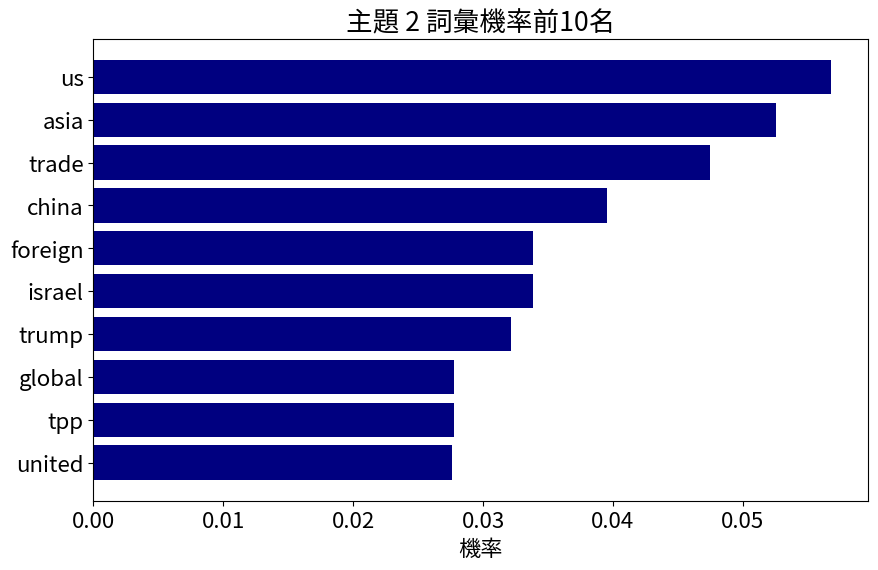

In [ ]:
# 視覺化顯示主題-詞彙分佈
topic_n = 2
data = kmeans_topic_model.get_topic(topic_n)

# 轉換為DataFrame
df = pd.DataFrame(data, columns=['word', 'prob'])
df = df[df['word'] != ' ']

# 根據prob排序並選出前10名
top_10 = df.sort_values('prob', ascending=False).head(10)

# 畫出長條圖
plt.figure(figsize=(10,6))
plt.barh(top_10['word'], top_10['prob'], color='navy')
plt.xlabel('機率')
plt.title(f'主題 {topic_n} 詞彙機率前10名')
plt.gca().invert_yaxis()
plt.show()

## Fake news的大選前後之詞彙關係

透過TF-IDF, N-gram等方法找出文章以及字詞間的關聯，以Fake news的大選前後做為分析資料。


In [ ]:
# pip install -U networkx

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import nltk
#nltk.download("punkt")
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import math
from nltk import ngrams
from nltk import FreqDist
from collections import Counter, namedtuple

import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
from sklearn.metrics.pairwise import cosine_similarity

#### 匯入資料


In [ ]:
#匯入資料
FakeData = pd.read_csv('./raw_data/Fake.csv')
TrueData = pd.read_csv('./raw_data/True.csv')

# 刪除標點符號/數字/換行符號，只留下英文字母和空格(包含換行符號)
FakeData["text"] = FakeData["text"].apply(lambda x: re.sub(r'[^\w\s]','', str(x)))
# 刪除長度小於1的句子
FakeData = FakeData[~FakeData["text"].str.len() < 1]

six_FakeData = FakeData.copy()
seven_FakeData = FakeData.copy()

#2016年末為總統大選，輿論可能比較激烈，篩出2016年以前的假新聞
six_FakeData['date'] = pd.to_datetime(FakeData['date'], errors='coerce')
six_FakeData = six_FakeData[six_FakeData['date'].dt.year <= 2016]
six_FakeData['date'] = six_FakeData['date'].dt.strftime('%Y-%m-%d')

#篩出2016年以後，選舉後的假新聞
seven_FakeData['date'] = pd.to_datetime(FakeData['date'], errors='coerce')
seven_FakeData = seven_FakeData[seven_FakeData['date'].dt.year > 2016]
seven_FakeData['date'] = seven_FakeData['date'].dt.strftime('%Y-%m-%d')


seven_FakeData.head()


,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31
2,Sheriff David Clarke Becomes An Internet Joke...,On Friday it was revealed that former Milwauke...,News,2017-12-30
3,Trump Is So Obsessed He Even Has Obama’s Name...,On Christmas day Donald Trump announced that h...,News,2017-12-29
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25


因為總統大選在2016年年底，所以將假新聞資料分成2016年（選舉前）與2017年（選舉後）
對大選前後的假新聞資料做分析


#### Tidy Data

In [ ]:
##新增stop words
nltk.download('stopwords')
stopWords = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jeanchen/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# 設定斷詞 function
stemmer = PorterStemmer() #做Stemming還原詞幹

def getToken(row):
    seg_list = nltk.tokenize.word_tokenize(row)
    seg_list = [stemmer.stem(str(w)).lower() for w in seg_list if w not in stopWords and len(w)>1]
    seg_list = [w for w in seg_list if w not in stopWords]
    return seg_list

In [ ]:
#假新聞2016
six_fake_data = six_FakeData.copy()
six_fake_data['word'] = six_fake_data['text'].apply(getToken)
six_fake_data = six_fake_data.explode('word')
six_fake_data.reset_index(inplace=True, drop=True) #重設index
six_fake_data.head()


,title,text,subject,date,word
0,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,donald
1,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,trump
2,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,threw
3,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,parti
4,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,celebr


In [ ]:
#假新聞2017
seven_fake_data = seven_FakeData.copy()
seven_fake_data['word'] = seven_fake_data['text'].apply(getToken)
seven_fake_data = seven_fake_data.explode('word')
seven_fake_data.reset_index(inplace=True, drop=True) #重設index
seven_fake_data.head()

,title,text,subject,date,word
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,donald
1,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,trump
2,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,wish
3,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,american
4,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,happi


In [ ]:
#手動新增停用字
stops = stopwords.words('english')
newStops = ['could', 'would', 'much', 'must', 'said', 'us', 'reuters', 'also', 'year', 'new', 'one', 'like', 'say', 'go', 'time', 'even', 'make', 'via', 'get', 'peopl', 'right', 'know', 'want', 'say', 'call','imag','think']
stops.extend(newStops)
six_fake_data = six_fake_data[~six_fake_data['word'].isin(stops)]
seven_fake_data = seven_fake_data[~seven_fake_data['word'].isin(stops)]

six_fake_data

,title,text,subject,date,word
0,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,donald
1,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,trump
2,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,threw
3,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,parti
4,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,celebr
...,...,...,...,...,...
1907972,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,2016-01-12,21st
1907973,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,2016-01-12,centuri
1907974,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,2016-01-12,wire
1907975,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,2016-01-12,iran


In [ ]:
#計算2016假新聞詞頻
freq_df = pd.DataFrame(six_fake_data['word'].value_counts()).reset_index()
freq_df.columns = ['word', 'freq']
freq_df.head(15)

,word,freq
0,trump,29367
1,republican,8721
2,state,8463
3,presid,8211
4,donald,7598
5,clinton,7261
6,obama,5744
7,support,5514
8,campaign,5400
9,elect,4942


In [ ]:
#計算2017假新聞詞頻
freq_df = pd.DataFrame(seven_fake_data['word'].value_counts()).reset_index()
freq_df.columns = ['word', 'freq']
freq_df.head(15)

,word,freq
0,trump,25396
1,presid,7129
2,donald,5257
3,state,4463
4,white,3700
5,american,3659
6,report,3601
7,hous,3530
8,media,3185
9,republican,3131


1. TF-IDF
評估選舉前後重要詞彙。

### 1. 計算大選前後的TF-IDF


In [ ]:
# FakeData各主題的總詞彙數
sixFk_total_words = six_fake_data.groupby(['subject'],as_index=False).size()
sixFk_total_words.rename(columns={'size': 'total'}, inplace=True)
sixFk_total_words

,subject,total
0,Government News,27512
1,Middle-east,168529
2,News,1264518
3,US_News,173897
4,left-news,54971
5,politics,63511


In [ ]:
sevenFk_total_words = seven_fake_data.groupby(['subject'],as_index=False).size()
sevenFk_total_words.rename(columns={'size': 'total'}, inplace=True)
sevenFk_total_words

,subject,total
0,Government News,8435
1,Middle-east,162448
2,News,701565
3,US_News,162448
4,left-news,37077
5,politics,52369


In [ ]:
# 計算2016假新聞各詞彙在各主題中出現的次數
sixfk_word_count = six_fake_data.groupby(['subject','word'],as_index=False).size()
sixfk_word_count.rename(columns={'size': 'count'}, inplace=True)
sixfk_word_count

,subject,word,count
0,Government News,002,1
1,Government News,03,1
2,Government News,08,1
3,Government News,10,7
4,Government News,100,11
...,...,...,...
131949,politics,zipper,3
131950,politics,zombi,1
131951,politics,zonat,1
131952,politics,zone,3


In [ ]:
# 計算2017假新聞各詞彙在各主題中出現的次數
sevenfk_word_count = seven_fake_data.groupby(['subject','word'],as_index=False).size()
sevenfk_word_count.rename(columns={'size': 'count'}, inplace=True)
sevenfk_word_count

,subject,word,count
0,Government News,10,5
1,Government News,1000,1
2,Government News,104215608,2
3,Government News,109,1
4,Government News,11,2
...,...,...,...
102293,politics,zinger,1
102294,politics,zogbi,2
102295,politics,zogbyvia,1
102296,politics,zone,3


#### 合併需要的資料欄位
- 合併 **每個詞彙在每個主題中出現的次數** 與 **每個主題的總詞數**

In [ ]:
sixfk_words = sixfk_word_count.merge(sixFk_total_words ,on = 'subject',how = 'left')

sevenfk_words = sevenfk_word_count.merge(sevenFk_total_words ,on = 'subject',how = 'left')

sevenfk_words.head(100)

,subject,word,count,total
0,Government News,10,5,8435
1,Government News,1000,1,8435
2,Government News,104215608,2,8435
3,Government News,109,1,8435
4,Government News,11,2,8435
...,...,...,...,...
95,Government News,accommod,4,8435
96,Government News,accord,9,8435
97,Government News,account,2,8435
98,Government News,accur,1,8435


#### 以每個主題爲單位，計算每個詞彙的 tf-idf 值  
- tf-idf = tf * idf

#### 使用套件

In [ ]:
#2016
six_fk_df = six_FakeData.copy()
# 需要改成使用空格連接斷好的詞
six_fk_df['word'] = six_fk_df.text.apply(getToken).map(' '.join)
six_fk_df.head()

,title,text,subject,date,word
3209,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,donald trump threw parti celebr new year let r...
3210,Trump’s Russia Connection Says US Troops Live...,A former top aide to Donald Trump makes an ala...,News,2016-12-31,former top aid donald trump make alarm refer s...
3211,Here’s The List Of Items Trump Banned From In...,Remember when the National Rifle Association w...,News,2016-12-31,rememb nation rifl associ warn american presid...
3212,Something AMAZING Happens When You Redact Mos...,When most presidents in the past have sent a m...,News,2016-12-31,presid past sent messag lead new year sent mes...
3213,Obama Setting These Traps For Trump Before In...,President Obama is obviously disappointed that...,News,2016-12-31,presid obama obvious disappoint donald trump h...


In [ ]:
#2017
seven_fk_df = seven_FakeData.copy()
# 需要改成使用空格連接斷好的詞
seven_fk_df['word'] = seven_fk_df.text.apply(getToken).map(' '.join)
seven_fk_df.head()

,title,text,subject,date,word
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,donald trump wish american happi new year leav...
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31,hous intellig committe chairman devin nune go ...
2,Sheriff David Clarke Becomes An Internet Joke...,On Friday it was revealed that former Milwauke...,News,2017-12-30,friday reveal former milwauke sheriff david cl...
3,Trump Is So Obsessed He Even Has Obama’s Name...,On Christmas day Donald Trump announced that h...,News,2017-12-29,christma day donald trump announc would back w...
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25,pope franci use annual christma day messag reb...


In [ ]:
#2016/2017停用字

stops = stopwords.words('english')
newStops = ['could', 'would', 'much', 'must', 'said', 'us', 'reuters', 'also', 'year', 'new', 'one', 'like', 'say', 'go', 'time', 'even', 'make', 'via', 'get', 'peopl', 'right', 'know', 'want', 'say', 'call','imag','think']
stops.extend(newStops)

# 移除停用词的函数
def remove_stopwords(text):
    tokens = text.split()
    filtered_tokens = [word for word in tokens if word.lower() not in stops]
    return ' '.join(filtered_tokens)

# 移除停用词
six_fk_df['word'] = six_fk_df['word'].apply(remove_stopwords)
seven_fk_df['word'] = seven_fk_df['word'].apply(remove_stopwords)

# six_fk_df = six_fk_df[~six_fk_df['word'].isin(stops)]
# seven_fk_df = seven_fk_df[~seven_fk_df['word'].isin(stops)]

six_fk_df

,title,text,subject,date,word
3209,This Compilation Of Alec Baldwin HUMILIATING ...,Donald Trump threw a party to celebrate the Ne...,News,2016-12-31,donald trump threw parti celebr let ruin good ...
3210,Trump’s Russia Connection Says US Troops Live...,A former top aide to Donald Trump makes an ala...,News,2016-12-31,former top aid donald trump alarm refer safeti...
3211,Here’s The List Of Items Trump Banned From In...,Remember when the National Rifle Association w...,News,2016-12-31,rememb nation rifl associ warn american presid...
3212,Something AMAZING Happens When You Redact Mos...,When most presidents in the past have sent a m...,News,2016-12-31,presid past sent messag lead sent messag hope ...
3213,Obama Setting These Traps For Trump Before In...,President Obama is obviously disappointed that...,News,2016-12-31,presid obama obvious disappoint donald trump h...
...,...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,2016-01-16,21st centuri wire 21wire report earlier week u...
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme W...,Middle-east,2016-01-16,21st centuri wire familiar theme whenev disput...
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,2016-01-15,patrick henningsen 21st centuri wirerememb oba...
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,2016-01-14,21st centuri wire al jazeera america histori b...


In [ ]:
# 2016 Bag of Word
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(six_fk_df["word"])
six_vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
six_DTM_df = pd.DataFrame(columns = six_vocabulary, data = X.toarray())
six_DTM_df

,00,000,000048,00075,00076,000dillon000,001,001wampampnbampampw2obfunctionvar,002,004,...,zurich,zusman,zvi,zwillich,zwillig,zxmgklb,zygot,zyuseragentifzxzbreak,zzbluecomet,zzzzzzzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7410,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7411,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7412,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7413,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# 2017 Bag of Word
vectorizer = CountVectorizer()
Y = vectorizer.fit_transform(seven_fk_df["word"])
seven_vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
seven_DTM_df = pd.DataFrame(columns = seven_vocabulary, data = Y.toarray())
seven_DTM_df

,000,00007,001,007kzman,01,02,025,03,036,04,...,zuckerstay,zuckett,zuker,zuppello,zyklon,zynga,zz,zztain,zzzzaaaacccchhh,zzzzzzzzzzzzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4448,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4449,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4450,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4451,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#2016
transformer = TfidfTransformer()
# 將詞頻矩陣X統計成TF-IDF值
six_tfidf = transformer.fit_transform(X)

# 轉成dataframe
six_TFIDF_df = pd.DataFrame(columns = six_vocabulary, data = six_tfidf.toarray())

six_TFIDF_df


,00,000,000048,00075,00076,000dillon000,001,001wampampnbampampw2obfunctionvar,002,004,...,zurich,zusman,zvi,zwillich,zwillig,zxmgklb,zygot,zyuseragentifzxzbreak,zzbluecomet,zzzzzzzz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7410,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7411,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7412,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7413,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#2017
transformer = TfidfTransformer()
# 將詞頻矩陣X統計成TF-IDF值
seven_tfidf = transformer.fit_transform(Y)

# 轉成dataframe
seven_TFIDF_df = pd.DataFrame(columns = seven_vocabulary, data = seven_tfidf.toarray())

seven_TFIDF_df

,000,00007,001,007kzman,01,02,025,03,036,04,...,zuckerstay,zuckett,zuker,zuppello,zyklon,zynga,zz,zztain,zzzzaaaacccchhh,zzzzzzzzzzzzz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4448,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4449,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4450,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4451,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 2. 檢視大選前後tf-idf結果


#### 取每一個字詞在所有文件裡的TF-IDF平均值

In [ ]:
#2016
six_fk_tfidf = six_TFIDF_df.mean().to_frame().reset_index()
six_fk_tfidf.columns = ["word", "avg"]

six_fk_tfidf.sort_values('avg', ascending = False).head(10)

,word,avg
72321,trump,0.071377
59575,republican,0.023428
15850,clinton,0.022819
55750,presid,0.021812
22259,donald,0.020151
49117,obama,0.019322
66699,state,0.019109
13274,campaign,0.016807
32875,hillari,0.016740
68187,support,0.016031


In [ ]:
#2017
seven_fk_tfidf = seven_TFIDF_df.mean().to_frame().reset_index()
seven_fk_tfidf.columns = ["word", "avg"]

seven_fk_tfidf.sort_values('avg', ascending = False).head(10)

,word,avg
54360,trump,0.076085
42216,presid,0.026291
16371,donald,0.018835
57956,white,0.017914
44918,republican,0.017452
24509,hous,0.017254
50338,state,0.017042
36346,obama,0.016127
46222,russia,0.015822
5275,american,0.015570


### 選舉前後重要字詞結果
- 談論最多的仍是川普、共和黨
- 選舉後希拉蕊被談論程度下降
- 選舉後russia變成前10重要字詞，了解後發現是俄羅斯干預那年美國大選的「通俄門」假新聞充斥

### 3. 透過N-gram了解fake news文章


### 3.1 Bigram

In [ ]:
# 設定 bigram 斷詞 function
def bigram_getToken(row):
    seg_list = nltk.tokenize.word_tokenize(row)
    seg_list = [stemmer.stem(str(w)).lower() for w in seg_list if w not in stopWords and len(w)>1]
    seg_list = [w for w in seg_list if w not in stopWords]
    seg_list = ngrams(seg_list, 2)
    seg_list = [" ".join(w) for w in list(seg_list)]
    return seg_list

In [ ]:
fk_bigram = FakeData.copy()
fk_bigram["word"] = fk_bigram.text.apply(bigram_getToken)
fk_bigram = fk_bigram.explode('word')
fk_bigram

,title,text,subject,date,word
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",donald trump
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",trump wish
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",wish american
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",american happi
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",happi new
...,...,...,...,...,...
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",new 21st
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",21st centuri
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",centuri wire
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",wire iran


#### 統計最常出現的bigram組合

In [ ]:
# 計算每個組合出現的次數
fk_bigram_count = fk_bigram.groupby(["word"],as_index=False).size()
fk_bigram_count.sort_values(by=['size'], ascending=False).head(15)

,word,size
544203,donald trump,15213
820123,hillari clinton,6694
1923992,white hous,6287
864221,imag via,6198
1839472,unit state,6188
1173177,new york,4181
1346677,presid obama,3818
1347722,presid trump,3662
708311,fox new,3151
202428,barack obama,2235


### 3.2 Trigram

In [ ]:
# 設定 trigram 斷詞 function
def trigram_getToken(row):
    seg_list = nltk.tokenize.word_tokenize(row)
    seg_list = [stemmer.stem(str(w)).lower() for w in seg_list if w not in stopWords and len(w)>1]
    seg_list = [w for w in seg_list if w not in stopWords]
    seg_list = ngrams(seg_list, 3)
    seg_list = [" ".join(w) for w in list(seg_list)]
    return seg_list

In [ ]:
fk_trigram = FakeData.copy()
fk_trigram["word"] = fk_trigram.text.apply(trigram_getToken)
fk_trigram = fk_trigram.explode('word')
fk_trigram

,title,text,subject,date,word
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",donald trump wish
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",trump wish american
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",wish american happi
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",american happi new
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",happi new year
...,...,...,...,...,...
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",iran new 21st
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",new 21st centuri
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",21st centuri wire
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016",centuri wire iran


#### 統計最常出現的trigram組合

In [ ]:
# 計算每個組合出現的次數
fk_trigram_count = fk_trigram.groupby(["word"],as_index=False).size()
fk_trigram_count.sort_values(by=['size'], ascending=False).head(15)

,word,size
47376,21st centuri wire,1902
904529,donald trump realdonaldtrump,1692
2013979,new york time,1478
398385,black live matter,1230
2324339,presid donald trump,967
2004105,new 21st centuri,943
2333561,presid unit state,927
2322577,presid barack obama,865
1458950,imag via video,788
2938863,subscrib becom member,763


從上面的 bigram 和 trigram 的結果中，我們發現有些字較常一起出現。  

## 4. bigram視覺化

In [ ]:
#根據剛剛的觀察可以增加stopwords
stopWords.extend(['would', 'could', 'should', 'may', 'might', 'though'])

In [ ]:
# 使用FreqDist 取得 bigram 斷詞 與 bigram出現頻率
bigramfdist = FreqDist()
def bigram_getToken_dict(row):
    seg_list = nltk.tokenize.word_tokenize(row)
    seg_list = [stemmer.stem(str(w)).lower() for w in seg_list if w not in stopWords and len(w)>1]
    seg_list = [w for w in seg_list if w not in stopWords]
    bigramfdist.update(ngrams(seg_list, 2))
    seg_list2 = ngrams(seg_list, 2)
    seg_list = [" ".join(w) for w in list(seg_list2)]
    return seg_list

In [ ]:
fud_bigram2 = FakeData.copy()
fud_bigram2["word"] = fud_bigram2.text.apply(bigram_getToken_dict)
fud_bigram2 = fud_bigram2.explode('word')
fud_bigram2.head(3)

,title,text,subject,date,word
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",donald trump
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",trump wish
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",wish american


In [ ]:
# 看一下bigramfdist內容
bigramfdist.most_common(5)

[(('donald', 'trump'), 15213),
 (('hillari', 'clinton'), 6694),
 (('white', 'hous'), 6287),
 (('imag', 'via'), 6198),
 (('unit', 'state'), 6188)]

In [ ]:
# 建立bigram和count的dictionary
# 這裡取最多的前30項
d = {k:v for k,v in bigramfdist.most_common(30)}
d

{('donald', 'trump'): 15213,
 ('hillari', 'clinton'): 6694,
 ('white', 'hous'): 6287,
 ('imag', 'via'): 6198,
 ('unit', 'state'): 6188,
 ('new', 'york'): 4181,
 ('presid', 'obama'): 3818,
 ('presid', 'trump'): 3662,
 ('fox', 'new'): 3151,
 ('barack', 'obama'): 2235,
 ('21st', 'centuri'): 2227,
 ('trump', 'support'): 1993,
 ('centuri', 'wire'): 1926,
 ('suprem', 'court'): 1768,
 ('trump', 'campaign'): 1710,
 ('nation', 'secur'): 1699,
 ('trump', 'realdonaldtrump'): 1694,
 ('obama', 'administr'): 1657,
 ('social', 'media'): 1609,
 ('polic', 'offic'): 1588,
 ('law', 'enforc'): 1584,
 ('secretari', 'state'): 1563,
 ('state', 'depart'): 1511,
 ('york', 'time'): 1487,
 ('washington', 'post'): 1463,
 ('look', 'like'): 1463,
 ('attorney', 'gener'): 1462,
 ('republican', 'parti'): 1461,
 ('american', 'peopl'): 1445,
 ('democrat', 'parti'): 1407}

In [ ]:
# Create network plot
G = nx.Graph()

# 建立 nodes 間的連結
for k, v in [d][0].items():
    G.add_edge(k[0], k[1], weight=v)

# 取得edge權重 #不知道該怎麼改
weights = [w[2]['weight']*0.05 for w in  G.edges(data=True)]

weights = [i/4 for i in weights] ##改權重

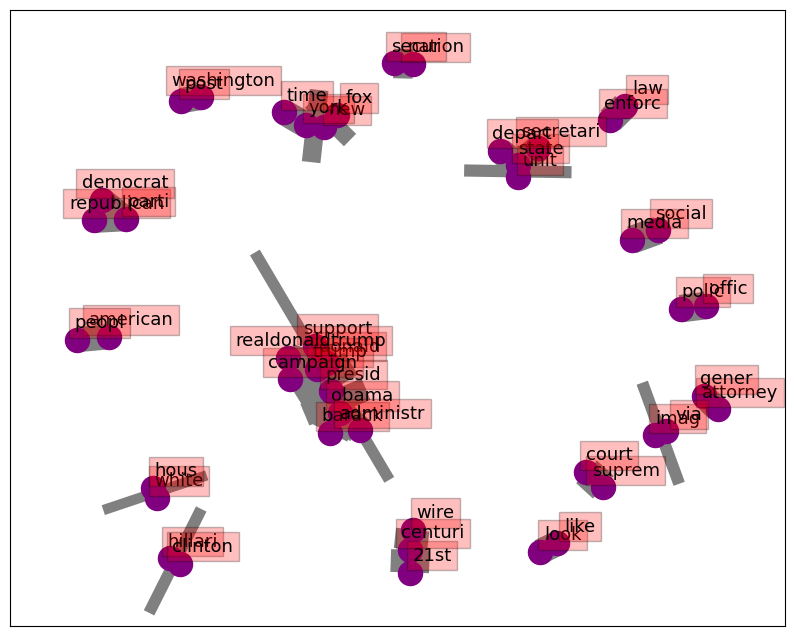

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))

pos = nx.spring_layout(G, k=2)

# networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=weights,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

# 增加 labels
for key, value in pos.items():
    x, y = value[0]+.07, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)

plt.show()

## 5. 建立Ngram預測模型
引入Markov假設，也就是當前的這個字僅僅與前幾個有限的字相關   
$$P(w_i|w_1,...,w_{i-1})=P(w_i|w_{i-m+1},...,w_{i-1})$$  
bi-gram (m=2):
$$ P(w_i|w_{i-1})=\frac {count(w_{i-1},w_i)} {count(w_{i-1})} $$   
tri-gram (m=3):  
$$ P(w_i|w_{i-2},w_{i-1})=\frac {count(w_{i-2},w_{i-1},w_i)} {count(w_{i-2},w_{i-1})} $$   



參考網站：
- [N-gram Language Models](https://towardsdatascience.com/n-gram-language-models-af6085435eeb)
- [自然語言處理 — 使用 N-gram 實現輸入文字預測](https://medium.com/%E6%89%8B%E5%AF%AB%E7%AD%86%E8%A8%98/%E8%87%AA%E7%84%B6%E8%AA%9E%E8%A8%80%E8%99%95%E7%90%86-%E4%BD%BF%E7%94%A8-n-gram-%E5%AF%A6%E7%8F%BE%E8%BC%B8%E5%85%A5%E6%96%87%E5%AD%97%E9%A0%90%E6%B8%AC-10ac622aab7a)
- [自然語言處理中N-Gram模型介紹](https://zhuanlan.zhihu.com/p/32829048)

In [ ]:
data2 = FakeData.copy()
sen_tokens = data2['text'].apply(getToken).tolist()
sen_tokens[0]

['donald',
 'trump',
 'wish',
 'american',
 'happi',
 'new',
 'year',
 'leav',
 'instead',
 'give',
 'shout',
 'enemi',
 'hater',
 'dishonest',
 'fake',
 'news',
 'media',
 'former',
 'realiti',
 'show',
 'star',
 'one',
 'job',
 'countri',
 'rapidli',
 'grow',
 'stronger',
 'smarter',
 'want',
 'wish',
 'friend',
 'support',
 'enemi',
 'hater',
 'even',
 'dishonest',
 'fake',
 'new',
 'media',
 'happi',
 'healthi',
 'new',
 'year',
 'presid',
 'angri',
 'pant',
 'tweet',
 '2018',
 'great',
 'year',
 'america',
 'countri',
 'rapidli',
 'grow',
 'stronger',
 'smarter',
 'want',
 'wish',
 'friend',
 'support',
 'enemi',
 'hater',
 'even',
 'dishonest',
 'fake',
 'new',
 'media',
 'happi',
 'healthi',
 'new',
 'year',
 '2018',
 'great',
 'year',
 'america',
 'donald',
 'trump',
 'realdonaldtrump',
 'decemb',
 '31',
 '2017trump',
 'tweet',
 'went',
 'welll',
 'expectwhat',
 'kind',
 'presid',
 'send',
 'new',
 'year',
 'greet',
 'like',
 'despic',
 'petti',
 'infantil',
 'gibberish',
 'onl

In [ ]:
def ngram(documents, N=2):
    ngram_prediction = dict()
    total_grams = list()
    words = list()
    Word = namedtuple('Word', ['word', 'prob'])

    for doc in documents:
        # 加上開頭和結尾 tag
        split_words = ['<s>'] + list(doc) + ['</s>']
        # 計算分子
        [total_grams.append(tuple(split_words[i:i+N])) for i in range(len(split_words)-N+1)]
        # 計算分母
        [words.append(tuple(split_words[i:i+N-1])) for i in range(len(split_words)-N+2)]

    total_word_counter = Counter(total_grams)
    word_counter = Counter(words)

    for key in total_word_counter:
        word = ''.join(key[:N-1])
        if word not in ngram_prediction:
            ngram_prediction.update({word: set()})

        next_word_prob = total_word_counter[key]/word_counter[key[:N-1]] #P(B|A)
        w = Word(key[-1], '{:.3g}'.format(next_word_prob))
        ngram_prediction[word].add(w)

    return ngram_prediction

In [ ]:
# Bigram預測模型為例
bi_prediction = ngram(sen_tokens, N=2)

**預測下一個出現的詞**

In [ ]:
text = 'donald'
next_words = list(bi_prediction[text])
next_words.sort(key = lambda s: s[1], reverse = True)
for next_word in next_words[:5]:
    print('next word: {}, probability: {}'.format(next_word.word, next_word.prob))

next word: digit, probability: 5.85e-05
next word: trumpearli, probability: 5.85e-05
next word: woke, probability: 5.85e-05
next word: stupid, probability: 5.85e-05
next word: trumpbuffett, probability: 5.85e-05


In [ ]:
text = 'obama'
next_words = list(bi_prediction[text])
next_words.sort(key = lambda s: s[1], reverse = True)
for next_word in next_words[:5]:
    print('next word: {}, probability: {}'.format(next_word.word, next_word.prob))

next word: document, probability: 5.55e-05
next word: ine, probability: 5.55e-05
next word: altern, probability: 5.55e-05
next word: 2010, probability: 5.55e-05
next word: beyonc, probability: 5.55e-05


從預測結果來看，可以看到許多假新聞關鍵字
像是woke議題，與川普息息相關（大家常說川普是種族歧視者）
還有像是曾經有家新聞說歐巴馬的小三是歌手碧昂絲

## LLM Information Extraction


### 連接雲端資料夾

### 套件安裝

In [ ]:
!pip install jieba

!pip install sentence-transformers
!pip install transformers
!pip install sentencepiece

# 用於 transformer 加速
!pip install accelerate
!pip install -i https://pypi.org/simple/ bitsandbytes

!pip install langchain-chroma
!pip install pypdf
!pip install langchain
!pip install huggingface_hub
!pip install grandalf
!pip install pandas
!pip install ctransformers
!pip install langchain-community

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 1.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import os
from getpass import getpass

import pandas as pd
import ast
import json
import re
import jieba

from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline
from langchain_community.llms.huggingface_pipeline import HuggingFacePipeline
from transformers import BitsAndBytesConfig # huggingface 量化

from langchain_community.llms import HuggingFaceEndpoint

from langchain_core.prompts import PromptTemplate
from langchain_core.prompts import ChatPromptTemplate

from langchain_core.runnables import RunnablePassthrough
from langchain_core.runnables import RunnableParallel
from langchain_core.runnables import RunnableLambda

from langchain_core.output_parsers import JsonOutputParser
from langchain_core.pydantic_v1 import BaseModel, Field

from langchain_community.document_loaders import PyPDFLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_chroma import Chroma
from langchain_community.embeddings.sentence_transformer import (
    SentenceTransformerEmbeddings,
)

### HuggingFace Token

In [ ]:
HUGGINGFACEHUB_API_TOKEN = getpass()
os.environ["HUGGINGFACEHUB_API_TOKEN"] = HUGGINGFACEHUB_API_TOKEN

··········


### 載入 LLM 模型 : gemma-1.1-7b-it

In [ ]:
quant_config = BitsAndBytesConfig(load_in_4bit=True)

print(quant_config.is_quantizable())
print(quant_config.quantization_method())

True
fp4


In [ ]:
model_id = "google/gemma-1.1-7b-it"

tokenizer = AutoTokenizer.from_pretrained(model_id, token=HUGGINGFACEHUB_API_TOKEN)
# device_map="auto" 使用 GPU 加速
model = AutoModelForCausalLM.from_pretrained(model_id, device_map="auto", quantization_config=quant_config, token=HUGGINGFACEHUB_API_TOKEN)
pipe = pipeline("text-generation", model=model, tokenizer=tokenizer, max_new_tokens=300)
llm = HuggingFacePipeline(pipeline=pipe)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/620 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/2.11G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/langchain_core/_api/deprecation.py:119: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 0.3. An updated version of the class exists in the langchain-huggingface package and should be used instead. To use it run `pip install -U langchain-huggingface` and import as `from langchain_huggingface import HuggingFacePipeline`.
  warn_deprecated(


#### HuggingFaceEndpoint



In [ ]:
# temperature: 模型回答的活潑程度，0~1

llm = HuggingFaceEndpoint(
    repo_id="google/gemma-1.1-7b-it", temperature=0.7,model_kwargs={'token':HUGGINGFACEHUB_API_TOKEN, 'use_cache':False}
)


The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


#### RunnableParallel

In [ ]:
# 設定繁體中文詞庫
jieba.set_dictionary("./dict/dict.txt.big")

# 新增stopwords
# jieba.analyse.set_stop_words('./dict/stop_words.txt') #jieba.analyse.extract_tags才會作用
with open("./dict/stop_words.txt", encoding="utf-8") as f:
    stopWords = [line.strip() for line in f.readlines()]

# 設定斷詞 function
def getToken(row):
    seg_list = jieba.cut(row, cut_all=False)
    seg_list = [
        w for w in seg_list if w not in stopWords and len(w) > 1
    ]  # 篩選掉停用字與字元數大於1的詞彙
    return seg_list

# 讀取情緒字典
liwc_dict = pd.read_csv("./dict/liwc/LIWC_CH.csv")
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})



### Fake & True news 判別
- 將 Fake news 和 True news 隨機抽樣幾筆並混合成一個表
- 利用 prompt engineering 中的 few shots 問 llm
- llm 將判別出新聞的主題、新聞的主角新聞的情緒，以及是真新聞還是假新聞
- 訓練完後將再問隨機抽樣的真假混合資料，並對比準確程度

In [ ]:
import pandas as pd
import re
import random

# 匯入資料
FakeData = pd.read_csv('./data/Fake.csv')
TrueData = pd.read_csv('./data/True.csv')

# 刪除標點符號/數字/換行符號，只留下英文字母和空格
FakeData["text"] = FakeData["text"].apply(lambda x: re.sub(r'[^\w\s]', '', str(x)))
TrueData["text"] = TrueData["text"].apply(lambda x: re.sub(r'[^\w\s]', '', str(x)))

# 刪除長度小於1的句子
FakeData = FakeData[~FakeData["text"].str.len() < 1]
TrueData = TrueData[~TrueData["text"].str.len() < 1]

# 隨機選取10筆假新聞
sampled_FakeData = FakeData.sample(n=10, random_state=1)

# 隨機選取10筆真新聞
sampled_TrueData = TrueData.sample(n=10, random_state=1)

# 合併真新聞和假新聞，並打亂
combined_data = pd.concat([sampled_FakeData, sampled_TrueData])
combined_data = combined_data.sample(frac=1, random_state=1).reset_index(drop=True)

# 重置索引
combined_data = combined_data.reset_index(drop=True)

# 保存為CSV文件
combined_data.to_csv('combined.csv', index=False)

# 顯示合併後的資料表
print(combined_data)


#答案csv檔，標註來源以便後續對照
sampled_FakeData["source"] = "Fake"
sampled_TrueData["source"] = "True"

# 合併真新聞和假新聞
ans_combined_data = pd.concat([sampled_FakeData, sampled_TrueData])
ans_combined_data = ans_combined_data.sample(frac=1, random_state=1).reset_index(drop=True)

# 重置索引
ans_combined_data = ans_combined_data.reset_index(drop=True)

# 保存為CSV文件
ans_combined_data.to_csv('combined_with_source.csv', index=False)


                                                title  \
0         DOJ LEADER PUTS BLAME FOR RIOTS ON…SLAVERY?   
1   Memories in milk bottles: Polish exhibition 's...   
2   MIKE PENCE SHREDS TIM KAINE IN VP DEBATE: This...   
3   Cambodian PM pulls back on threat to shut righ...   
4   LIZ WARREN CALLED OUT For Crazy Claim Steve Ba...   
5   Court allows Democratic states to defend Obama...   
6   TELL-ALL BOOK Exposes What A Nightmare Hillary...   
7      Trade critic Trump visits Boeing Co's backyard   
8   WATCH: RONALD REAGAN WARNED US ABOUT OBAMA 40 ...   
9    Trump’s Policy Adviser? A Former Lobbyist Wit...   
10  U.S. to unveil revised self-driving car guidel...   
11  POLITICO DOWNGRADES AMERICA: Declares Germany’...   
12  Czech election winner Babis meets anti-EU part...   
13  Senate set for pivotal vote on Supreme Court n...   
14   Samantha Bee Takes On The NRA And Its ‘Asinin...   
15  Democrat Hassan declares victory in New Hampsh...   
16  HUCKABEE BACKS TRUMP’S COMM

In [ ]:
#讀去題目csv
Com = pd.read_csv('./combined.csv')
Com

,title,text,subject,date
0,DOJ LEADER PUTS BLAME FOR RIOTS ON…SLAVERY?,It s no accident that President Obama named Va...,politics,"May 21, 2015"
1,Memories in milk bottles: Polish exhibition 's...,WARSAW Reuters A deeply moving exhibition of ...,worldnews,"November 15, 2017"
2,MIKE PENCE SHREDS TIM KAINE IN VP DEBATE: This...,FULL DEBATE VIDEO Can we get a higher number ...,politics,"Oct 5, 2016"
3,Cambodian PM pulls back on threat to shut righ...,PHNOM PENH Reuters Cambodian Prime Minister H...,worldnews,"December 2, 2017"
4,LIZ WARREN CALLED OUT For Crazy Claim Steve Ba...,Liberals internal struggle in one clip anders...,left-news,"Dec 1, 2016"
5,Court allows Democratic states to defend Obama...,WASHINGTON Reuters A US appeals court on Tues...,politicsNews,"August 1, 2017"
6,TELL-ALL BOOK Exposes What A Nightmare Hillary...,We ve heard about Hillary Clinton s bad behavi...,politics,"Jun 6, 2016"
7,Trade critic Trump visits Boeing Co's backyard,EVERETT WashingtonWASHINGTON Reuters Republic...,politicsNews,"August 30, 2016"
8,WATCH: RONALD REAGAN WARNED US ABOUT OBAMA 40 ...,This video needs to be shared over and over ag...,politics,"Mar 6, 2016"
9,Trump’s Policy Adviser? A Former Lobbyist Wit...,Who is Paul Manafort Well for starters he s a ...,News,"April 13, 2016"


In [ ]:
#去除本次不會用到的欄位
drop_cols = ['subject', 'date']
Com.drop(drop_cols, axis = 1, inplace = True)
Com

,title,text
0,DOJ LEADER PUTS BLAME FOR RIOTS ON…SLAVERY?,It s no accident that President Obama named Va...
1,Memories in milk bottles: Polish exhibition 's...,WARSAW Reuters A deeply moving exhibition of ...
2,MIKE PENCE SHREDS TIM KAINE IN VP DEBATE: This...,FULL DEBATE VIDEO Can we get a higher number ...
3,Cambodian PM pulls back on threat to shut righ...,PHNOM PENH Reuters Cambodian Prime Minister H...
4,LIZ WARREN CALLED OUT For Crazy Claim Steve Ba...,Liberals internal struggle in one clip anders...
5,Court allows Democratic states to defend Obama...,WASHINGTON Reuters A US appeals court on Tues...
6,TELL-ALL BOOK Exposes What A Nightmare Hillary...,We ve heard about Hillary Clinton s bad behavi...
7,Trade critic Trump visits Boeing Co's backyard,EVERETT WashingtonWASHINGTON Reuters Republic...
8,WATCH: RONALD REAGAN WARNED US ABOUT OBAMA 40 ...,This video needs to be shared over and over ag...
9,Trump’s Policy Adviser? A Former Lobbyist Wit...,Who is Paul Manafort Well for starters he s a ...


In [ ]:
class News(BaseModel):
    情緒: str = Field(..., description="Determine the overall sentiment of the sentence.", enum=["positive", "neutral", "negative"])
    主角: str = Field(
        ...,
        description="List all the protagonists mentioned in the sentences, separated by “,” "
    )
    主題: str = Field(
        ...,
        description="Determine the topic of the articles mentioned in the news."
    )
    真假: str = Field(
        ...,
        description="Determine if this news article is true or fake."
    )

food_parser = JsonOutputParser(pydantic_object=News)

# 透過 get_format_instructions() 可以看到如何告訴 LLM 生成我們想要的格式的一些指令
food_parser.get_format_instructions()

'The output should be formatted as a JSON instance that conforms to the JSON schema below.\n\nAs an example, for the schema {"properties": {"foo": {"title": "Foo", "description": "a list of strings", "type": "array", "items": {"type": "string"}}}, "required": ["foo"]}\nthe object {"foo": ["bar", "baz"]} is a well-formatted instance of the schema. The object {"properties": {"foo": ["bar", "baz"]}} is not well-formatted.\n\nHere is the output schema:\n```\n{"properties": {"\\u60c5\\u7dd2": {"title": "\\u60c5\\u7dd2", "description": "Determine the overall sentiment of the sentence.", "enum": ["positive", "neutral", "negative"], "type": "string"}, "\\u4e3b\\u89d2": {"title": "\\u4e3b\\u89d2", "description": "List all the protagonists mentioned in the sentences, separated by \\u201c,\\u201d ", "type": "string"}, "\\u4e3b\\u984c": {"title": "\\u4e3b\\u984c", "description": "Determine the topic of the articles mentioned in the news.", "type": "string"}, "\\u771f\\u5047": {"title": "\\u771f\\u

In [ ]:
# Set up a parser + inject instructions into the prompt template.
food_parser = JsonOutputParser(pydantic_object=News)\

food_template = """<start_of_turn>user
你是一位新聞評斷家，你將會看網路上各式新聞，請抓取出評論中：
1.此評論的情緒，positive,neutral, or negative
2.有討論到主角，例如：donald trump, hillari clinton, president obama
3.新聞的主題，例如：war, election,politics
4.新聞的真假，例如：True,False

以下為一些範例：
```
範例1
text：WASHINGTON (Reuters) - Trump campaign adviser George Papadopoulos told an Australian diplomat in May 2016 that Russia had political dirt on Democratic presidential candidate Hillary Clinton, the New York Times reported on Saturday. The conversation between Papadopoulos and the diplomat, Alexander Downer, in London was a driving factor behind the FBI’s decision to open a counter-intelligence investigation of Moscow’s contacts with the Trump campaign, the Times reported. Two months after the meeting, Australian officials passed the information that came from Papadopoulos to their American counterparts when leaked Democratic emails began appearing online, according to the newspaper, which cited four current and former U.S. and foreign officials. Besides the information from the Australians, the probe by the Federal Bureau of Investigation was also propelled by intelligence from other friendly governments, including the British and Dutch, the Times said. Papadopoulos, a Chicago-based international energy lawyer, pleaded guilty on Oct. 30 to lying to FBI agents about contacts with people who claimed to have ties to top Russian officials. It was the first criminal charge alleging links between the Trump campaign and Russia. The White House has played down the former aide’s campaign role, saying it was “extremely limited” and that any actions he took would have been on his own. The New York Times, however, reported that Papadopoulos helped set up a meeting between then-candidate Donald Trump and Egyptian President Abdel Fattah al-Sisi and edited the outline of Trump’s first major foreign policy speech in April 2016. The federal investigation, which is now being led by Special Counsel Robert Mueller, has hung over Trump’s White House since he took office almost a year ago. Some Trump allies have recently accused Mueller’s team of being biased against the Republican president. Lawyers for Papadopoulos did not immediately respond to requests by Reuters for comment. Mueller’s office declined to comment. Trump’s White House attorney, Ty Cobb, declined to comment on the New York Times report. “Out of respect for the special counsel and his process, we are not commenting on matters such as this,” he said in a statement. Mueller has charged four Trump associates, including Papadopoulos, in his investigation. Russia has denied interfering in the U.S. election and Trump has said there was no collusion between his campaign and Moscow.
抓取結果：{{
    "sentiment":"neutral",
    "main role":"Trump","Russia",
    "topic":"international relations",
    "true or fake":"True",

    "
}}

範例2
text: Many people have raised the alarm regarding the fact that Donald Trump is dangerously close to becoming an autocrat. The thing is, democracies become autocracies right under the people s noses, because they can often look like democracies in the beginning phases. This was explained by Republican David Frum just a couple of months into Donald Trump s presidency, in a piece in The Atlantic called  How to Build an Autocracy. In fact, if you really look critically at what is happening right now   the systematic discrediting of vital institutions such as the free press and the Federal Bureau of Investigation as well the direct weaponization of the Department of Justice in order to go after Trump s former political opponent, 2016 Democratic nominee Hillary Clinton, and you have the makings of an autocracy. We are more than well on our way. Further, one chamber of Congress, the House of Representatives, already has a rogue band of Republicans who are running a parallel investigation to the official Russian collusion investigation, with the explicit intent of undermining and discrediting the idea that Trump could have possibly done anything wrong with the Russians in order to swing the 2016 election in his favor.All of that is just for starters, too. Now, we have Trump making United Nations Ambassador Nikki Haley bully and threaten other countries in the United Nations who voted against Trump s decision to change U.S. policy when it comes to recognition of Jerusalem as the capital of the Jewish State. Well, one expert, who is usually quite measured, has had enough of Trump s autocratic antics: Former CIA Director John O. Brennan. The seasoned spy took to Trump s favorite platform, Twitter, and blasted the decision:Trump Admin threat to retaliate against nations that exercise sovereign right in UN to oppose US position on Jerusalem is beyond outrageous. Shows @realDonaldTrump expects blind loyalty and subservience from everyone qualities usually found in narcissistic, vengeful autocrats.  John O. Brennan (@JohnBrennan) December 21, 2017Director Brennan is correct, of course. Trump is behaving just like an autocrat, and so many people in the nation are asleep when it comes to this dangerous age, in which the greatest threat to democracy and the very fabric of the republic itself is the American president. Fellow Americans, we know the GOP-led Congress will not be the check on Trump that they are supposed to be. It s time to get out and flip the House and possibly the Senate in 2018, and resist in the meantime, if we want to save our country from devolving into something that looks more like Russia or North Korea than the America we have always know. We re already well on our way.Featured image via BRENDAN SMIALOWSKI/AFP/Getty Images
抓取結果：{{
    "sentiment":"negetive",
    "main role":"Donald Trump",
    "topic":"election",
    "true or fake":"Fake",

    "
}}

範例3
text: BOSTON (Reuters) - U.S. immigration officials sought to block a federal judge’s order delaying efforts to deport 51 Indonesians living illegally in New Hampshire, saying they have not shown they would face harm if repatriated, court documents on Wednesday showed. The U.S. government’s motion in federal court in Boston was in response to a judge’s order last month that found members of the group should be given time to make a case that changed conditions in the southeast Asian nation would make it dangerous for them to return. “Even if they are removed, petitioners’ generalized evidence of Indonesia’s conditions do not prove that persecution or torture is immediate or likely for each petitioner,” the motion said. It said the court lacked jurisdiction over their claims, and the immigrants did not state any plausible claims.  The group of ethnic Chinese Christians fled the world’s largest Muslim-majority country following violence that erupted 20 years ago and have been living openly for years in New England under an informal deal reached with U.S. Immigration and Customs Enforcement (ICE). Beginning in August, members of the group who showed up for ICE check-ins were told to prepare to leave the country, in keeping with U.S. President Donald Trump’s campaign promise to crack down on illegal immigration. Members of the group have said in interviews with Reuters that they entered the country on tourist visas but overstayed them and failed to seek asylum on time. Several said they fear they would face persecution or violence for their Christian faith and Chinese ethnicity if they were returned to Indonesia. Federal law gives authority over immigration matters to the executive branch, not the courts, and ICE contends that it has always had authority to deport members of the group. Chief U.S. District Judge Patti Saris in Boston last month found she had authority to ensure the Indonesians have a chance to argue that conditions in their home country had deteriorated significantly enough to reopen their cases for trying to stay in the United States. The Indonesians are part of an ethnic community of about 2,000 people clustered around the city of Dover, New Hampshire. Their cause has drawn the support of the state’s all-Democratic congressional delegation, including U.S. Senator Jeanne Shaheen, and Republican Governor Chris Sununu.
抓取結果：{{
    "sentiment":"neutral",
    "main role":"U.S. immigration officials",
    "topic":"politics",
    "true or fake":"True",

    "
}}

範例4
text：In this #METOO moment, many powerful men are being toppled. It spans many industries, from entertainment, to journalism, to politics and beyond. Any man that ever dared to abuse his power to sexually harass, molest, or assault women better brace himself for being rooted out, publicly shamed, and forced into early retirement.Well, unfortunately, the latest bombshell story has actually resulted in the suicide of a lawmaker. Kentucky State Representative Dan Johnson left a suicide note on Facebook and then shot himself on a bridge, according to reports from local authorities. Bullitt County Sheriff Donnie Tinnell reported to local station WDRB that Johnson s body was found after his suicide note from Facebook was reported to the local police. Here is that note:Now, nobody wants to celebrate a suicide. This man should have resigned gracefully and faced his accuser, who was a friend of his daughter s, who says that Johnson molested her while she was passed out drunk in his home. Apparently, Johnson, who referred to himself as some kind of  pope,  routinely engaged in parties with plenty of alcohol with minors. Johnson s home was called the  Pope s House,  and he was the preacher at the Heart of Fire City Church, where the alleged molestation took place.Now, innocent until proven guilty and all of that, but if someone commits suicide, it s likely there could be some merit there. That s a rather extreme measure to take. Further, by all accounts, this guy was no saint. He was heavily pro-gun, opposed any and all abortion rights, and has referred to President Barack Obama and First Lady Michelle Obama as monkeys on his Facebook page, among other racist messages and images.Again, we re not glad the man is dead. But, it is important for people to remember him for exactly who he was. We grieve for the loss his children, wife, and grandchildren suffered, for nobody deserves such a loss. However, methinks the people of Kentucky are much better off. Sad to say, but true.Featured image via screen capture
抓取結果：{{
    "sentiment":"negetive",
    "main role":"powerful men",
    "topic":"#METOO","society",
    "true or fake":"Fake",
}}


{format_instructions}
請使用英文回答。
除了 JSON 內容外，不要回答任何其他內容

現在請幫我抓取以下句子的資訊：
句子：{query}
抓取結果：<end_of_turn>
<start_of_turn>model
"""

food_prompt = PromptTemplate(
    template=food_template,
    # template="Answer the user query.\n{format_instructions}\nDon't output any other explanation\n{query}\n",
    input_variables=["query"],
    # 將 format_instructions 也輸入到 prompt templete 中
    partial_variables={"format_instructions": food_parser.get_format_instructions()},
)

chain = food_prompt | llm
chain.get_graph().print_ascii()

       +-------------+         
       | PromptInput |         
       +-------------+         
              *                
              *                
              *                
      +----------------+       
      | PromptTemplate |       
      +----------------+       
              *                
              *                
              *                
   +---------------------+     
   | HuggingFaceEndpoint |     
   +---------------------+     
              *                
              *                
              *                
+---------------------------+  
| HuggingFaceEndpointOutput |  
+---------------------------+  


手動建立 parse function

In [ ]:
# 從 json 字串中抓取答案
def extract_answer_from_string(string_):
    string_ = string_.replace("\n", "")
    string_ = string_.replace("json", "")
    string_ = string_.replace("    ", "")
    string_ = string_.replace("```", "")
    try:
        # 可以成功轉換
        dict_result = json.loads(string_)
    except:
        print(string_)
        return string_
    return dict_result

# 從 dict 抓取情緒
def get_sentiment(row):
    sentiment = None
    if isinstance(row, dict):
        if ("情緒" in row.keys()):
            sentiment = row['情緒']
    return sentiment

In [ ]:
llm_result = extract_answer_from_string(chain.invoke({"query": "Ronald Reagan is largely seen as the Messiah of the Republican Party. Despite how long it has been since the man was president, he has always remained the high standard of GOP morality for potential office holders. That is, until now. Reagan is likely rolling over in his grave at the idea of the state of his party with Donald Trump as its standard-bearer, and he s likely doing the same at the prospect of a bigoted accused child molester like Roy Moore (R-AL) being the next GOP Senator from Alabama. Well, now Reagan has another reason to hate Moore: He s clearly in the pocket of Russian autocrat Vladimir Putin just like Donald Trump is.During an interview where he s talking about Americans being the face of  evil  in the world right now, Moore indicates that Putin s harsh and murderous treatment of LGBTQ people in Russia is something he would like to see happen in the United States. Then, he does something most appalling, and goes on to give Putin a message in Russian. Now, no one knows where a bigoted, backwoods buffoon like Roy Moore would learn Russian. After all, he s barely left Alabama, where he has spent the last 40+ years wreacking havoc and just basically cementing Alabama s place as America s bigoted boil on the butt of humanity wherever and whenever he can. However, he managed to learn enough Russian to dog whistle to Putin in that interview. That should disturb us all. Not only is the man being a homophobe, a racist, a misogynist, and more than likely a child molester, he s also a Russian stooge.America, we can do better. We have enough Russian puppets at the highest levels of government. Lord knows we don t need one in the United States Senate.Watch the appalling video below:Please watch this until the end, Roy Moore sides with Putin over Reagan, says that America is the focus of evil in the world, and sends a nice message to Putin in Russian. pic.twitter.com/wFgDkvzEhT  The Reagan Battalion (@ReaganBattalion) December 10, 2017Featured image via Drew Angerer/Getty Images"}))
print(llm_result)
get_sentiment(llm_result)

{'sentiment': 'negative', 'main role': 'Roy Moore, Vladimir Putin, Donald Trump', 'topic': 'politics', 'true or fake': 'True'}


In [ ]:
Com['LLM'] = Com.apply(lambda x: extract_answer_from_string(chain.invoke({"query": x['text']})), axis=1)
Com


{"sentiment": "negative","main role": "National Rifle Association","topic": "gun control","true or fake": "Fake",}


,title,text,LLM
0,DOJ LEADER PUTS BLAME FOR RIOTS ON…SLAVERY?,It s no accident that President Obama named Va...,"{'sentiment': 'negative', 'main role': 'Vanita..."
1,Memories in milk bottles: Polish exhibition 's...,WARSAW Reuters A deeply moving exhibition of ...,"{'sentiment': 'positive', 'main role': 'Emanue..."
2,MIKE PENCE SHREDS TIM KAINE IN VP DEBATE: This...,FULL DEBATE VIDEO Can we get a higher number ...,"{'sentiment': 'positive', 'main role': 'Mike P..."
3,Cambodian PM pulls back on threat to shut righ...,PHNOM PENH Reuters Cambodian Prime Minister H...,"{'sentiment': 'neutral', 'main role': 'Hun Sen..."
4,LIZ WARREN CALLED OUT For Crazy Claim Steve Ba...,Liberals internal struggle in one clip anders...,"{'sentiment': 'negetive', 'main role': 'Libera..."
5,Court allows Democratic states to defend Obama...,WASHINGTON Reuters A US appeals court on Tues...,"{'sentiment': 'neutral', 'main role': 'Donald ..."
6,TELL-ALL BOOK Exposes What A Nightmare Hillary...,We ve heard about Hillary Clinton s bad behavi...,"{'sentiment': 'negative', 'main role': 'Hillar..."
7,Trade critic Trump visits Boeing Co's backyard,EVERETT WashingtonWASHINGTON Reuters Republic...,"{'sentiment': 'neutral', 'main role': 'Donald ..."
8,WATCH: RONALD REAGAN WARNED US ABOUT OBAMA 40 ...,This video needs to be shared over and over ag...,"{'sentiment': 'negative', 'main role': 'Hillar..."
9,Trump’s Policy Adviser? A Former Lobbyist Wit...,Who is Paul Manafort Well for starters he s a ...,"{'sentiment': 'negative', 'main role': 'Paul M..."


In [ ]:
Com.to_csv('Com_results.csv', index=False)

print(Com.head())

                                               title  \
0        DOJ LEADER PUTS BLAME FOR RIOTS ON…SLAVERY?   
1  Memories in milk bottles: Polish exhibition 's...   
2  MIKE PENCE SHREDS TIM KAINE IN VP DEBATE: This...   
3  Cambodian PM pulls back on threat to shut righ...   
4  LIZ WARREN CALLED OUT For Crazy Claim Steve Ba...   

                                                text  \
0  It s no accident that President Obama named Va...   
1  WARSAW Reuters  A deeply moving exhibition of ...   
2  FULL DEBATE VIDEO  Can we get a higher number ...   
3  PHNOM PENH Reuters  Cambodian Prime Minister H...   
4  Liberals  internal struggle in one clip anders...   

                                                 LLM  
0  {'sentiment': 'negative', 'main role': 'Vanita...  
1  {'sentiment': 'positive', 'main role': 'Emanue...  
2  {'sentiment': 'positive', 'main role': 'Mike P...  
3  {'sentiment': 'neutral', 'main role': 'Hun Sen...  
4  {'sentiment': 'negetive', 'main role': 'Libera..

In [ ]:
import pandas as pd

# 讀取LLM預測結果的CSV文件
llm_results = pd.read_csv('Com_results.csv')

# 讀取帶有真實標籤的combined_with_source.csv文件
combined_with_source = pd.read_csv('combined_with_source.csv')

# 提取LLM預測結果中的'true or fake'欄位
llm_results['predicted_true_or_fake'] = llm_results['LLM'].apply(lambda x: eval(x)['true or fake'])

# 計算準確率
accuracy = (llm_results['predicted_true_or_fake'] == combined_with_source['source']).mean()
print(f'LLM模型的準確率為: {accuracy:.2%}')


LLM模型的準確率為: 65.00%


## Graph分析實體網路圖

In [ ]:
import datetime
meta = pd.read_csv('filter.csv')
start_date = datetime.datetime(2016, 9, 1)
end_date = datetime.datetime(2016, 11, 1)
true_df = meta.copy()
true_df = true_df[true_df['Authenticity'] == 'True']
true_df['id'] = true_df.reset_index().index
true_df['date'] = pd.to_datetime(true_df['month'])
true_df = true_df[(true_df['date'] >= start_date) & (true_df['date'] <= end_date)]
true_df['text_length'] = true_df['text'].str.len()
eighty = true_df['text_length'].quantile(0.6)
true_df = true_df[true_df['text_length'] < eighty]
true_df.head()

,title,text,subject,date,Authenticity,month,id,text_length
3103,Senior senators want to amend Saudi September ...,WASHINGTON (Reuters) - Two senior U.S. senator...,politics,2016-11-01,True,2016-11,3103,1653
3104,U.S. ethics office tweets sarcasm at Trump on ...,WASHINGTON (Reuters) - President-elect Donald ...,politics,2016-11-01,True,2016-11,3104,2883
3110,Pelosi re-elected to House Democratic leadersh...,WASHINGTON (Reuters) - U.S. House of Represent...,politics,2016-11-01,True,2016-11,3110,2454
3115,Trump considering Palin to lead Veterans Affai...,WASHINGTON (Reuters) - President-elect Donald ...,politics,2016-11-01,True,2016-11,3115,297
3116,"Factbox: Trump to meet with Linda McMahon, Gen...",(Reuters) - U.S. Republican President-elect Do...,politics,2016-11-01,True,2016-11,3116,617


In [ ]:
start_date = datetime.datetime(2016, 9, 1)
end_date = datetime.datetime(2016, 11, 1)
fake_df = meta.copy()
fake_df = fake_df[fake_df['Authenticity'] == 'Fake']
fake_df['id'] = fake_df.reset_index().index
fake_df['date'] = pd.to_datetime(fake_df['month'])
fake_df = fake_df[(fake_df['date'] >= start_date) & (fake_df['date'] <= end_date)]
fake_df['text_length'] = fake_df['text'].str.len()
eighty = fake_df['text_length'].quantile(0.6)
fake_df = fake_df[fake_df['text_length'] < eighty]
fake_df.head()

<ipython-input-49-45872440ce3f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fake_df['text_length'] = fake_df['text'].str.len()


,title,text,subject,date,Authenticity,month,id,text_length
7068,BRILLIANT! TUCKER CARLSON Humiliates Jill Stei...,https://www.youtube.com/watch?v=uQbAww5wajA,politics,2016-11-01,Fake,2016-11,1314,43
7070,CNN HOST Suggests Women Wear Muslim Headscarf ...,,politics,2016-11-01,Fake,2016-11,1316,1
7071,WOOHOO! CARRIER EMPLOYEE Tells How He Found Ou...,Great interview on @foxandfriends by @SteveDoo...,politics,2016-11-01,Fake,2016-11,1317,216
7072,REPUBLICAN WINNING STREAK CONTINUES: Democrats...,Rep. Tim Ryan (D. Ohio) had launched a bid to ...,politics,2016-11-01,Fake,2016-11,1318,568
7074,OOPS! SEN COONS ADMITS REGRET MAKING IT EASIER...,,politics,2016-11-01,Fake,2016-11,1320,1


In [ ]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


True

#### 建立標出Entity的function

In [ ]:
def getNER(sentence, exclude, nerType):
  names = []
  for sent in nltk.sent_tokenize(sentence):
    for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(sent))):
      if hasattr(chunk, 'label'):
        if chunk.label() == nerType:
          name = ' '.join(c[0] for c in chunk)
          if name not in exclude:
            names.append(name)
  return list(set(names))

In [ ]:
#true
excludePerson = ['Sir','Lady','Madam','Miss','Had', 'Poor']
true_df['person'] = true_df.text.apply(lambda r: getNER(r,excludePerson, 'PERSON'))
fake_df['person'] = fake_df.text.apply(lambda r: getNER(r,excludePerson, 'PERSON'))

origin_true_df = true_df.copy()

In [ ]:
origin_true_df.head()

,title,text,subject,date,Authenticity,month,id,text_length,person
3103,Senior senators want to amend Saudi September ...,WASHINGTON (Reuters) - Two senior U.S. senator...,politics,2016-11-01,True,2016-11,3103,1653,"[Obama, Barack Obama, John McCain, McCain, Lin..."
3104,U.S. ethics office tweets sarcasm at Trump on ...,WASHINGTON (Reuters) - President-elect Donald ...,politics,2016-11-01,True,2016-11,3104,2883,"[Bob Goodlatte, Trump, Hope Hicks, Donald Trum..."
3110,Pelosi re-elected to House Democratic leadersh...,WASHINGTON (Reuters) - U.S. House of Represent...,politics,2016-11-01,True,2016-11,3110,2454,"[Pelosi, Ryan, Trump, Shuler, Donald Trump, En..."
3115,Trump considering Palin to lead Veterans Affai...,WASHINGTON (Reuters) - President-elect Donald ...,politics,2016-11-01,True,2016-11,3115,297,"[Sarah Palin, Donald Trump]"
3116,"Factbox: Trump to meet with Linda McMahon, Gen...",(Reuters) - U.S. Republican President-elect Do...,politics,2016-11-01,True,2016-11,3116,617,"[Donald Trump, Trump, Marine Corps, Barack Obama]"


#### 建立person的資料處理function

In [ ]:
#把沒有分好的person重新指定
def get_freq_names(df, threshold):
  person_exploded = df.explode('person')
  person_exploded['person'] = person_exploded['person'].replace('Trump', 'Donald Trump')
  person_exploded['person'] = person_exploded['person'].replace('Donald', 'Donald Trump')
  person_exploded['person'] = person_exploded['person'].replace('Hillary', 'Hillary Clinton')
  person_exploded['person'] = person_exploded['person'].replace('Democrat Hillary', 'Hillary Clinton')
  person_exploded['person'] = person_exploded['person'].replace('Clinton', 'Hillary Clinton')
  person_exploded['person'] = person_exploded['person'].replace('Obama', 'Barack Obama')
  single_freq = person_exploded.groupby('person').count().sort_values('text')
  freqNames = single_freq[single_freq.text>= threshold].index.tolist()
  return freqNames
# 取出出現頻繁的人名、(出現超過9次的)
#-----------
# 把每一個句子裡面出現的人名不在freqNames的拿掉
# 之後捨棄掉人名數量少於2的句子

def removeName(names,names_pool):
  return list(set(names).intersection(set(names_pool)))

# 把人物取組合兩兩一組
def getComb(names):
  return list(combinations(names,2))


#### 將真、假新聞資料套用到function中

In [ ]:
def data_process(df, threshold):
  freq_names = get_freq_names(df, threshold)
  filter_name = df.copy()
  #removeName
  filter_name['person'] = filter_name['person'].apply(lambda r:removeName(r,freq_names))
  filter_name = filter_name[filter_name['person'].str.len()>1]
  #getComb
  filter_name['name_comb'] = filter_name['person'].map(getComb)

  #set
  filter_name = filter_name.reset_index(names=['sent_id']).explode('name_comb')[['sent_id','name_comb']]
  filter_name = pd.DataFrame(filter_name.name_comb.tolist(),columns=['name1', 'name2'])
  filter_name['value'] = 1
  return filter_name


In [ ]:
def get_mat_tri(filter_name):
  vals = np.unique(filter_name[['name1', 'name2']])
  mat = pd.pivot_table(filter_name,index = 'name1', columns = 'name2' ,values='value' ,aggfunc='count').fillna(0).reindex(columns=vals, index=vals, fill_value=0).to_numpy()
  tri = (np.tril(mat,-1).T + np.triu(mat,1))
  mat = tri+tri.T
  #mat_s = tri+tri.T
  return vals, mat


In [ ]:
# 隨機生成十六進制顏色碼
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

# 透過 adjacency matrix 建立 graph
def matPresentGraph(mat:np.array, node_id:list, node_type:list = None, node_value:list = None, directed = True, edge_color = None) -> pyvis.network.Network:
  '''
    根據輸入的matrix建立網路圖
    mat: adjacency matrix
    node_id: 要設定的節點id
    node_type: 用來區分不同類型的節點（例如：不同群組），會作為節點的title
    node_value: 節點大小
    directed: 有向/無向
    edge_color: edge顏色

  '''

  # 如果設定為無向圖，則檢查輸入的 matrix 是否對稱
  if directed != True:
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    else:
      print('matrix is not Symmetric')

  # 若無設定 node_type，則為所有節點設置相同的顏色(隨機)和類型
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]

  else: # 若有設定node_type，則為每種類型分配一個隨機顏色
    node_color_map = {}

    for i in set(node_type):
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c

    node_colors = [node_color_map[i] for i in node_type]

  # 若無設定edge_color，則設置隨機顏色
  if edge_color == None:
    edge_color = random_color()
  # edge_color = random_color()

  # 若無設定node_value，則設定所有節點的大小為1
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')

  # 加入點
  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = node_type,
      color = node_colors
  )

  # 加入邊
  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col] > 0.:
        net.add_edge(
            node_id[row], node_id[col], width = mat[row][col]/13, color = edge_color, title = mat[row][col]
        )

  return net

#### 繪製Person實體在真新聞當中的網路圖

In [ ]:
#true
true_filter_name = data_process(true_df, 20)
true_vals, true_mat = get_mat_tri(true_filter_name)
net = matPresentGraph(true_mat,true_vals,directed = False)
net.show_buttons(filter_=["physics"])
net.show("./person_true_RE.html")
IPython.display.HTML('person_true_RE.html')

matrix is Symmetric
./person_true_RE.html


#### 繪製假新聞之Person網路圖

In [ ]:

#fake
fake_filter_name = data_process(fake_df, 10)
fake_vals, fake_mat = get_mat_tri(fake_filter_name)
net = matPresentGraph(fake_mat,fake_vals,directed = False)
net.show_buttons(filter_=["physics"])
net.show("./person_fake_RE.html")
IPython.display.HTML('person_fake_RE.html')

matrix is Symmetric
./person_fake_RE.html


分析： 真新聞中，明顯看出人物之間的連結更強，在新聞中的互動較高。假新聞之網路圖則互動低，各自獨立出現在新聞中。

### Organization分析

In [ ]:
def get_org_freq_names(df, threshold):
  exploded = df.explode('org')
  exploded['org'] = exploded['org'].replace('Republican Donald Trump', '')
  exploded['org'] = exploded['org'].replace('Democrats', 'Democatic')
  exploded['org'] = exploded['org'].replace('Democrat', 'Democatic')

  single_freq = exploded.groupby('org').count().sort_values('text')
  freqNames = single_freq[single_freq.text>= threshold].index.tolist()
  return freqNames
def org_data_process(df, threshold):
  freq_names = get_org_freq_names(df, threshold)
  filter_name = df.copy()
  #removeName
  filter_name['org'] = filter_name['org'].apply(lambda r:removeName(r,freq_names))
  filter_name = filter_name[filter_name['org'].str.len()>1]
  #getComb
  filter_name['name_comb'] = filter_name['org'].map(getComb)

  #set
  filter_name = filter_name.reset_index(names=['sent_id']).explode('name_comb')[['sent_id','name_comb']]
  filter_name = pd.DataFrame(filter_name.name_comb.tolist(),columns=['name1', 'name2'])
  filter_name['value'] = 1
  return filter_name

#### 真新聞 Organization

In [ ]:
excludeORG = ['']
true_df['org'] = true_df.text.apply(lambda r: getNER(r,excludeORG, 'ORGANIZATION'))
true_filter_org = org_data_process(true_df, 35)

true_vals, true_mat = get_mat_tri(true_filter_org)
net = matPresentGraph(true_mat,true_vals,directed = False)
net.show_buttons(filter_=["physics"])
net.show("./org_true_RE.html")
IPython.display.HTML('org_true_RE.html')

matrix is Symmetric
./org_true_RE.html


In [ ]:
fake_df['org'] = fake_df.text.apply(lambda r: getNER(r,excludeORG, 'ORGANIZATION'))


#### 假新聞Organization網路圖

In [ ]:

fake_filter_org = org_data_process(fake_df, 10)

fake_vals, fake_mat = get_mat_tri(fake_filter_org)
net = matPresentGraph(fake_mat,fake_vals,directed = False)
net.show_buttons(filter_=["physics"])
net.show("./org_fake_RE.html")
IPython.display.HTML('org_fake_RE.html')

matrix is Symmetric
./org_fake_RE.html


呈現和Person同樣的情形，即在真新聞中，ORG實體之間互動性強，有錯綜複雜的關聯性。假新聞則各自出現，組織之間幾乎沒有任何關係或互動。

#### 尋找Person網路圖中的重要Vertex

In [ ]:
import net_func
true_filter_name = data_process(true_df, 25)
pers = np.unique(true_filter_name[['name1', 'name2']])
mat = pd.pivot_table(true_filter_name,index = 'name1', columns = 'name2' ,values='value' ,aggfunc='count').fillna(0).reindex(columns=pers, index=pers, fill_value=0).to_numpy()
tri = (np.tril(mat,-1).T + np.triu(mat,1))/2
mat_s = tri+tri.T
mat_s
net_func.getMeasure(mat=mat_s)
eig_cent = net_func.centralityGraph(alg='eig',max_iter=10000,mat=mat_s)
eig_cent
net = net_func.matPresentGraph(mat=mat_s,node_id=pers,node_value=(np.array(eig_cent)*100).tolist(),directed=False)

net.show("./person_net.html")
IPython.display.HTML('person_net.html')


matrix is Symmetric
matrix is Symmetric
./person_net.html


因為是2016年大選，因此Trump和Hillary自然成為最重要人物，且在當時極具政治相關性的Obama和Putin也有高度重要性。

In [ ]:
fake_filter_name = data_process(fake_df, 10)
pers = np.unique(fake_filter_name[['name1', 'name2']])
mat = pd.pivot_table(fake_filter_name,index = 'name1', columns = 'name2' ,values='value' ,aggfunc='count').fillna(0).reindex(columns=pers, index=pers, fill_value=0).to_numpy()
tri = (np.tril(mat,-1).T + np.triu(mat,1))/2
mat_s = tri+tri.T
mat_s
net_func.getMeasure(mat=mat_s)
eig_cent = net_func.centralityGraph(alg='eig',max_iter=10000,mat=mat_s)
eig_cent
net = net_func.matPresentGraph(mat=mat_s,node_id=pers,node_value=(np.array(eig_cent)*100).tolist(),directed=False)

net.show("./person_net_fake.html")
IPython.display.HTML('person_net_fake.html')

matrix is Symmetric
matrix is Symmetric
./person_net_fake.html


我們認為假新聞中出現更少的政治性重要人物，只聚焦在話題的候選人身上是假新聞的一大特色。畢竟假新聞有大部分都是在針對特定人物/政黨做抹黑或造神，過多國際性、時事性的政治議題比較不是假新聞關注的重點。

# 結論
- 假新聞和真新聞在文本特徵、情緒表達、實體識別和主題分佈上存在顯著差異。
- 假新聞多使用模糊、不具體的詞彙，情緒負面，主要針對特定人物進行報導。
- 真新聞則引用具體的報導和政黨相關詞彙，主題分佈較為清晰，涉及多種政治和社會議題。